# **IBM/Coursera Data Professional Certificate** 
# **Applied Data Science Capstone Project - The Battle of the Neighborhoods**

## **BUSINESS PROBLEM**
Towns in the U.K. exhibit a considerable degree of variation. This project will use machine learning techniques to examine the relationship between the amount of venues of different types in UK towns and their population, and to classify towns in the UK according to similar venue characteristics. This analysis would be of potential interest to someone aiming to immigrate to the UK or to establish a business or branch of a multinational business in the U.K. 

## **DATA**

The data which will be used is **Foursquare API** UK venue data and geographical data hosted on https://www.doogal.co.uk/UKPostcodes.php. These two datasets will need to be cleaned and merged before analysis.

### **Download Libraries and Modules**

First download all the libraries and modules which will be used.

In [ ]:
!pip install geopy
import pandas as pd
import numpy as np
import requests
import csv
import matplotlib as mpl   #for graphing
from matplotlib import pyplot
import matplotlib.pyplot as plt 
from scipy import stats
import json 
import pandas as pd
import numpy as np
import scipy.optimize as opt
import seaborn as sns
from sklearn import preprocessing
from geopy.geocoders import Nominatim # convert an address into latitude and longitude values
from pandas.io.json import json_normalize
import matplotlib.cm as cm
import matplotlib.colors as colors2
mpl.style.use('ggplot') 
import folium 
from sklearn.preprocessing import StandardScaler #standardization
from sklearn.preprocessing import PolynomialFeatures #polynomial feature transformation
from sklearn.linear_model import LinearRegression
from sklearn.linear_model import Ridge
import itertools
from IPython.display import display
#from IPython.html import widgets 
from ipywidgets import interact, interactive, fixed, interact_manual
from sklearn.model_selection import GridSearchCV 
from sklearn.model_selection import cross_val_score
from sklearn.model_selection import cross_val_predict
from sklearn.model_selection import train_test_split
from io import StringIO
from sklearn.externals.six import StringIO
import pydotplus
import matplotlib.image as mpimg
from IPython.display import Image  
from PIL import Image as IM 
from sklearn import metrics
from sklearn.metrics import classification_report, confusion_matrix
from sklearn.metrics import r2_score
from sklearn.metrics import mean_squared_error
from sklearn.metrics import recall_score
from sklearn.metrics import precision_score
from sklearn.metrics import f1_score
from sklearn.metrics import silhouette_score, silhouette_samples
from scipy import ndimage 
from sklearn import manifold, datasets 
from sklearn import datasets, cluster
from sklearn.cluster import KMeans
from sklearn.cluster import DBSCAN 
from scipy.cluster import hierarchy 
from scipy.spatial import distance_matrix
from sklearn.cluster import FeatureAgglomeration
from sklearn.cluster import AgglomerativeClustering
from sklearn.decomposition import PCA  
import matplotlib.image as mpimg
from mpl_toolkits.mplot3d import Axes3D 
from sklearn import svm
from sklearn.neighbors import KNeighborsClassifier
from sklearn import tree
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier
import warnings
warnings.filterwarnings('ignore')
%matplotlib inline

### **Load UK Postcode Data**

Next load the UK Postcode Data. The column ***Region*** contains the towns which will be analyzed. Each town has multiple postcodes, so the data will have to be grouped by 'Region'. For ***Population*** and ***Households*** the sum for each 'Region' will be calculated, and for ***Latitude*** and ***Longitude***, the mean for each region will be calculated.

In [2]:
uk = pd.read_csv('Postcode districts UK.csv')  ##Downloaded data from https://www.doogal.co.uk/UKPostcodes.php and saved as CSV file
uk.dropna(subset=['Latitude', 'Longitude'], inplace = True)
uk['Population'].fillna(0 , inplace = True)
uk['Households'].fillna(0 , inplace = True)
ukcoordinate = uk[['Latitude', 'Longitude']].mean()
uklat, uklong = ukcoordinate[0], ukcoordinate[1]
uk

,Postcode,Latitude,Longitude,Easting,Northing,Grid Reference,Town/Area,Region,Postcodes,Active postcodes,Population,Households,Nearby districts
0,AB1,57.1269,-2.136440,391839.0,804005.0,NJ918040,Aberdeen,Aberdeen,2655.0,0.0,0.0,0.0,"AB10, AB9, AB15, AB25, AB2, AB12, AB16, AB11, ..."
1,AB2,57.1713,-2.141520,391541.0,808948.0,NJ915089,Aberdeen,Aberdeen,3070.0,0.0,0.0,0.0,"AB16, AB22, AB24, AB25, AB1, AB9, AB15, AB10, ..."
2,AB3,57.0876,-2.596240,363963.0,799780.0,NO639997,Aberdeen,Aberdeen,2168.0,0.0,0.0,0.0,"AB31, AB34, AB52, AB33, AB14, AB32, AB30, AB13..."
3,AB4,57.5343,-2.127130,392487.0,849358.0,NJ924493,"Fraserburgh, Peterhead, Macduff",Aberdeen,2956.0,0.0,0.0,0.0,"AB41, AB43, AB42, AB53, AB22, AB23, AB2, AB24,..."
4,AB5,57.4652,-2.647640,361248.0,841843.0,NJ612418,"Buckie, Huntly, Inverurie",Aberdeen,3002.0,0.0,0.0,0.0,"AB54, AB52, AB45, AB53, AB33, AB44, AB55, AB51..."
...,...,...,...,...,...,...,...,...,...,...,...,...,...
3109,YO91,53.9779,-1.066370,461330.0,453941.0,SE613539,"Lawrence Court, PO Boxes",York,10.0,0.0,0.0,0.0,"YO31, YO3, YO1, YO10, YO32, YO90, YO30, YO24, ..."
3110,YO95,53.9267,-0.815105,477904.0,448491.0,SE779484,Pocklington,York,1.0,0.0,0.0,0.0,"YO42, YO4, YO41, YO43, YO19, YO17, YO10, YO1, ..."
3111,ZE1,60.1517,-1.168170,446286.0,1141091.0,HU462410,"Lerwick, Scalloway",Shetland,393.0,327.0,8445.0,3862.0,"ZE2, ZE3, KW17, KW15, KW16, AB42, AB43, AB4, K..."
3112,ZE2,60.3115,-1.229190,442690.0,1158847.0,HU426588,Shetland,Shetland,343.0,311.0,14209.0,5845.0,"ZE1, ZE3, KW17, KW15, KW16, AB42, AB43, AB4, K..."


### **Fetch Venues Data from Foursquare**

Make Foursquare API request using my credentials. The 100 nearest venues within a 5km radius of the 3096 postcodes are fetched.



In [3]:
ukaddress = 'United Kingdom'
geolocator = Nominatim(user_agent="uk_explorer")
uklocation = geolocator.geocode(ukaddress)
uklatitude = uklocation.latitude
uklongitude = uklocation.longitude
print('The geograpical coordinate of United Kingdom are {}, {}.'.format(uklatitude, uklongitude))

The geograpical coordinate of United Kingdom are 54.7023545, -3.2765753.


In [4]:
CLIENT_ID = 'XXTQYRTQSGEES4LIZMTQGIDZ3CAC04STQXWU5H3MFRQJFZ3G' # My Foursquare ID
CLIENT_SECRET = 'CT3QO05LMC0PKFDCNRU4B4IJ5B3XG4GLYUUU41JWAZ0VPJHO' # My Foursquare Secret
VERSION = '20180605' # Foursquare API version
print('Your credentails:')
print('CLIENT_ID: ' + CLIENT_ID)
print('CLIENT_SECRET:' + CLIENT_SECRET)

Your credentails:
CLIENT_ID: XXTQYRTQSGEES4LIZMTQGIDZ3CAC04STQXWU5H3MFRQJFZ3G
CLIENT_SECRET:CT3QO05LMC0PKFDCNRU4B4IJ5B3XG4GLYUUU41JWAZ0VPJHO


In [5]:
LIMITUK = 100 # Max number of venues to be returned by API request for each coordinate of the request
radiusuk = 150000 # Radius for UK as a whole
radius = 5000 # Radius for each town in the UK
urluk = 'https://api.foursquare.com/v2/venues/explore?&client_id={}&client_secret={}&v={}&ll={},{}&radius={}&limit={}'.format(
    CLIENT_ID, 
    CLIENT_SECRET, 
    VERSION, 
    uklatitude, 
    uklongitude, 
    radiusuk, 
    LIMITUK)
urluk

'https://api.foursquare.com/v2/venues/explore?&client_id=XXTQYRTQSGEES4LIZMTQGIDZ3CAC04STQXWU5H3MFRQJFZ3G&client_secret=CT3QO05LMC0PKFDCNRU4B4IJ5B3XG4GLYUUU41JWAZ0VPJHO&v=20180605&ll=54.7023545,-3.2765753&radius=150000&limit=100'

In [6]:
ukresults = requests.get(urluk).json()
check = pd.DataFrame(ukresults)
check.head()

,meta,response
code,200,NaN
requestId,5f2107e013a607527c7471e0,NaN
suggestedFilters,NaN,"{'header': 'Tap to show:', 'filters': [{'name'..."
headerLocation,NaN,Current map view
headerFullLocation,NaN,Current map view


Now here is a function to fetch the nearest 100 venues within a 5km radius of every postcode in the geographical dataset

In [7]:
def ukgetNearbyVenues(names, latitudes, longitudes, radius):
    ukvenues_list=[]
    for name, lat, lng in zip(names, latitudes, longitudes):
        print(name)  
        # create the API request URL
        urluk = 'https://api.foursquare.com/v2/venues/explore?&client_id={}&client_secret={}&v={}&ll={},{}&radius={}&limit={}'.format(
            CLIENT_ID, 
            CLIENT_SECRET, 
            VERSION, 
            lat, 
            lng, 
            radius, 
            LIMITUK)
        # make the GET request
        ukresults = requests.get(urluk).json()["response"]['groups'][0]['items']
        # return only relevant information for each nearby venue
        ukvenues_list.append([(
            name, 
            lat, 
            lng, 
            v['venue']['name'], 
            v['venue']['location']['lat'], 
            v['venue']['location']['lng'],  
            v['venue']['categories'][0]['name']) for v in ukresults])
    uknearby_venues = pd.DataFrame([item for ukvenue_list in ukvenues_list for item in ukvenue_list])
    uknearby_venues.columns = ['Town/Area', 
                  'Town/Area Latitude', 
                  'Town/Area Longitude', 
                  'Venue', 
                  'Venue Latitude', 
                  'Venue Longitude', 
                  'Venue Category']
    
    return(uknearby_venues)

In [ ]:
uk_venues = ukgetNearbyVenues(names=uk['Region'],           #Fetch nearest 100 venues in 5km radius of each of the 3096 postcodes and save to spreadsheet    
                                  latitudes=uk['Latitude'],
                                  longitudes=uk['Longitude'],
                                  radius = radius 
                                 )
uk_venues.to_csv('uk_venues.csv')

The API request returns **265932** venues

In [8]:
uk_venues = pd.read_csv('uk_venues.csv') #open the saved venues data
uk_venues

,Town/Area,Town/Area Latitude,Town/Area Longitude,Venue,Venue Latitude,Venue Longitude,Venue Category
0,Aberdeen,57.1124,-2.243510,Northern Lights Lounge,57.199933,-2.202709,Airport Lounge
1,Aberdeen,57.1034,-2.272700,Northern Lights Lounge,57.199933,-2.202709,Airport Lounge
2,Aberdeen,57.2084,-2.200920,Northern Lights Lounge,57.199933,-2.202709,Airport Lounge
3,Aberdeen,57.1865,-2.119590,Northern Lights Lounge,57.199933,-2.202709,Airport Lounge
4,Aberdeen,57.2083,-2.089800,Northern Lights Lounge,57.199933,-2.202709,Airport Lounge
...,...,...,...,...,...,...,...
265927,York,53.9599,-1.090960,Sant Angelo,53.928397,-1.385169,Wine Bar
265928,York,53.9267,-0.815105,Wildes,53.960637,-1.082206,Wine Bar
265929,York,53.9267,-0.815105,Field And Fawcett,53.956005,-1.014766,Wine Bar
265930,York,54.1544,-1.080350,National Centre for Birds of Prey,54.241132,-1.076086,Zoo


### **Data Wrangling** 

**Geographic Data**

For each town, the total Population and total number of households is calculated by grouping the ***Region*** column by the sum of all the values from each of the postcodes and selecting just the ***Population*** and ***Households*** columns. 


In [9]:
uk2 = uk.groupby(['Region']).sum()
uk3 = uk2[uk2.columns[6:8]]
uk2

,Latitude,Longitude,Easting,Northing,Postcodes,Active postcodes,Population,Households
Region,,,,,,,,
Aberdeen,1086.4526,-41.650320,7381353.0,15392398.0,23481.0,6855.0,245387.0,112158.0
Aberdeenshire,974.0809,-42.558970,6285182.0,13996142.0,13255.0,8915.0,223979.0,93341.0
Adur,101.6721,-0.500124,1046641.0,211033.0,1055.0,739.0,32639.0,14269.0
Allerdale,328.0630,-20.325460,1863739.0,3193442.0,4813.0,4127.0,98058.0,43111.0
Amber Valley,212.1896,-5.628090,1759396.0,1400721.0,4805.0,2904.0,131664.0,56522.0
...,...,...,...,...,...,...,...,...
Wychavon,208.5272,-8.033620,1598138.0,992687.0,4572.0,2888.0,95934.0,40902.0
Wycombe,413.2197,-6.068381,3887867.0,1564660.0,6381.0,4172.0,157892.0,61856.0
Wyre,161.6552,-9.030260,1001113.0,1331045.0,3318.0,2592.0,98490.0,44100.0


**Venues Data**

The venues data needs to be preprocessed before analysis can be done. Redundant venue categories are merged e.g. 'Cafe' and 'Coffee Shop', and duplicate venues, where the venue name, latitude and venue longitude are the same, are removed.

In [10]:
#Merge Redundant Categories
uk_venues['Venue Category'][uk_venues['Venue Category'] == 'Bar'] = 'Pub'   
uk_venues['Venue Category'][uk_venues['Venue Category'] == 'Beer Bar'] = 'Pub'
uk_venues['Venue Category'][uk_venues['Venue Category'] == 'Brewery'] = 'Pub'
uk_venues['Venue Category'][uk_venues['Venue Category'] == 'Cocktail Bar'] = 'Pub'
uk_venues['Venue Category'][uk_venues['Venue Category'] == 'Café'] = 'Coffee Shop'
uk_venues['Venue Category'][uk_venues['Venue Category'] == 'Deli / Bodega'] = 'Restaurant'
uk_venues['Venue Category'][uk_venues['Venue Category'] == 'Portuguese Restaurant'] = 'Restaurant'
uk_venues['Venue Category'][uk_venues['Venue Category'] == 'Indie Movie Theater'] = 'Theater'
uk_venues['Venue Category'][uk_venues['Venue Category'] == 'Italian Restaurant'] = 'Italian Food'
uk_venues['Venue Category'][uk_venues['Venue Category'] == 'Indian Restaurant'] = 'Indian Food'
uk_venues['Venue Category'][uk_venues['Venue Category'].str.contains('Restaurant')] = 'Restaurant'
uk_venues['Venue Category'][uk_venues['Venue Category'] == 'Italian Food'] = 'Italian Restaurant'
uk_venues['Venue Category'][uk_venues['Venue Category'] == 'Indian Food'] = 'Indian Restaurant'
#Remove Duplicates
uk_venues['unique name'] = uk_venues['Town/Area'] + '_' + uk_venues['Venue']  + '_' + uk_venues['Venue Latitude'].astype(str)  + '_' + uk_venues['Venue Longitude'].astype(str) 
uk_venues = uk_venues.drop_duplicates(subset = 'unique name')
uk_venues = uk_venues.drop(columns = 'unique name')
venue_categories = uk_venues['Venue Category'].unique()

After cleaning there are **76318** unique venues and **351** unique venue categories left

In [11]:
print('there are {} unique venue categories in the UK'.format(venue_categories.shape[0]))
print('there are {} unique venues in the UK'.format(uk_venues.shape[0]))
uk_venues

there are 351 unique venue categories in the UK
there are 76318 unique venues in the UK


,Town/Area,Town/Area Latitude,Town/Area Longitude,Venue,Venue Latitude,Venue Longitude,Venue Category
0,Aberdeen,57.1124,-2.243510,Northern Lights Lounge,57.199933,-2.202709,Airport Lounge
5,Aberdeen,57.1269,-2.136440,No 10 Tavern,57.143409,-2.121221,Pub
6,Aberdeen,57.1269,-2.136440,CASC ABERDEEN,57.145874,-2.097568,Pub
7,Aberdeen,57.1269,-2.136440,Revolucion de Cuba,57.147413,-2.101209,Pub
8,Aberdeen,57.1269,-2.136440,No. 1 Bar/Grill,57.143286,-2.119574,Pub
...,...,...,...,...,...,...,...
265899,York,53.9581,-1.071130,Goji Vegetarian Cafe and Deli,53.961740,-1.079906,Restaurant
265918,York,53.9484,-1.121640,Sant Angelo,53.928397,-1.385169,Wine Bar
265919,York,53.9082,-0.829513,Wildes,53.960637,-1.082206,Wine Bar
265920,York,53.9082,-0.829513,Field And Fawcett,53.956005,-1.014766,Wine Bar


In [12]:
uk_venues.describe(include = ['object', 'float64']) #statistical description of data

,Town/Area,Town/Area Latitude,Town/Area Longitude,Venue,Venue Latitude,Venue Longitude,Venue Category
count,76318,76318.000000,76318.000000,76318,76318.000000,76318.000000,76318
unique,424,NaN,NaN,16941,NaN,NaN,351
top,Cornwall,NaN,NaN,Co-op Food,NaN,NaN,Pub
freq,749,NaN,NaN,1355,NaN,NaN,13316
mean,NaN,52.699422,-1.724585,NaN,52.698972,-1.724316,NaN
std,NaN,1.632843,1.701660,NaN,1.636817,1.702221,NaN
min,NaN,49.199500,-7.826240,NaN,49.167022,-7.872203,NaN
25%,NaN,51.474100,-2.781760,NaN,51.484520,-2.781427,NaN
50%,NaN,52.259600,-1.547880,NaN,52.251027,-1.550341,NaN
75%,NaN,53.588900,-0.344351,NaN,53.588450,-0.331302,NaN


**Convert Categorical Variables to Dummy Variables**

The venue categories, are categorical variables. The algorithms which will be used in this project can only work with numerical data. The venue categories will be transformed into dummy or indicator variables, where 0 and 1, signify the absence or presence of the category in each sample(Town).

In [13]:
uk_onehot = pd.get_dummies(uk_venues[['Venue Category']], prefix="", prefix_sep="")
uk_onehot['Town/Area'] = uk_venues['Town/Area'] 
ukfixed_columns = [uk_onehot.columns[-1]] + list(uk_onehot.columns[:-1])
uk_onehot = uk_onehot[ukfixed_columns]
maskonehot = np.random.rand(len(uk_onehot[uk_onehot['Town/Area']=='Liverpool'])) < 0.07
viewdata = uk_onehot[uk_onehot['Town/Area']=='Liverpool'][['Town/Area','Theater', 'Pub', 'Restaurant', 'Coffee Shop', 'Museum', 'Park', 'Movie Theater', 'History Museum', 'Italian Restaurant']]
viewdata[maskonehot]

,Town/Area,Theater,Pub,Restaurant,Coffee Shop,Museum,Park,Movie Theater,History Museum,Italian Restaurant
139096,Liverpool,0,0,0,0,0,0,0,0,0
139238,Liverpool,0,1,0,0,0,0,0,0,0
139270,Liverpool,0,0,0,0,0,0,0,0,0
139394,Liverpool,0,0,0,0,0,0,0,0,0
139853,Liverpool,0,0,0,1,0,0,0,0,0
139960,Liverpool,0,0,1,0,0,0,0,0,0
140025,Liverpool,0,0,0,0,0,0,0,0,0
140571,Liverpool,0,0,0,0,0,0,0,0,0
140829,Liverpool,0,0,1,0,0,0,0,0,0
140888,Liverpool,0,0,0,0,0,0,0,0,0


**Feature Scaling**

Scaling is essential for algorithms which depend on Euclidian distance measures and for Principal Component Analysis, and it is also needed to make sure all the features which are being analyzed are of comparable order of magnitude. 

**The *Population*, *Households* and each of the venue category columns are scaled using Maximum Absolute Value Normalization**. Each value of the feature vector is divided by the maximum value of the feature. This will give the features a range between 0 and 1. 

In [14]:
#Standardizing Population and Households Columns
uk3 = uk3.values
uk3 = pd.DataFrame(uk3)
uk3 = uk3/uk3.max()    # I added this, delete aftr
uk3.index = uk2.index
unclassified = pd.concat([uk2,uk3], axis=1)
unclassified = unclassified.drop(columns = ['Postcodes', 'Active postcodes', 'Easting', 'Northing'])
unclassified = unclassified.rename(columns = {0:'Population (normalized)', 1:'Households(normalized)' })  
unclassified

,Latitude,Longitude,Population,Households,Population (normalized),Households(normalized)
Region,,,,,,
Aberdeen,1086.4526,-41.650320,245387.0,112158.0,0.222007,0.264462
Aberdeenshire,974.0809,-42.558970,223979.0,93341.0,0.202639,0.220092
Adur,101.6721,-0.500124,32639.0,14269.0,0.029529,0.033645
Allerdale,328.0630,-20.325460,98058.0,43111.0,0.088715,0.101653
Amber Valley,212.1896,-5.628090,131664.0,56522.0,0.119120,0.133275
...,...,...,...,...,...,...
Wychavon,208.5272,-8.033620,95934.0,40902.0,0.086794,0.096444
Wycombe,413.2197,-6.068381,157892.0,61856.0,0.142849,0.145853
Wyre,161.6552,-9.030260,98490.0,44100.0,0.089106,0.103985


**Creating the Analysis DataFrames**

Two DataFrames will be produced. 

The first DataFrame, will for each venue category in each town, contain the total number of that venue category. So in the previous example, the variable for **Pub** for the first town would be **20** and for the second town **10**. This DataFrame will be used for regression, to examine the relationship between the total number of venues in a town and its population. 

The second DataFrame, will for each venue category in each town, contain the density of that venue category in relation to all other venues. i.e. if there are 20 pubs in a town, and a 100 venues in that town, 20% of the venues in that town are pubs, and the variable for **Pub** in that town is **0.20** whereas if another town has only 20 venues and 10 are pubs, the variable for **Pub** is **0.50**.

The venue category variables in both of these DataFrames will also be scaled by Maximum Absolute Value Normalization. Each of the values in each column will be divided by the maximum value of the feature.


Here is the venue categories in terms of **Total Number** (showing just 10 of the venue categories). **This undergoes Maximum Absolute Value Normalization and be joined to the normalized *Population* and *Households* columns to produce DataFrame I**

In [15]:
uksummed = uk_onehot.groupby('Town/Area').sum().reset_index()  #creating the venue category totals data
uksummeddata = uksummed
uksummeddata.set_index('Town/Area', inplace = True)
uksummeddata[['Theater', 'Pub', 'Restaurant', 'Coffee Shop', 'Museum', 'Park', 'Indian Restaurant','Movie Theater', 'History Museum', 'Italian Restaurant']]

,Theater,Pub,Restaurant,Coffee Shop,Museum,Park,Indian Restaurant,Movie Theater,History Museum,Italian Restaurant
Town/Area,,,,,,,,,,
Aberdeen,2,22,16,13,1,5,3,0,1,2
Aberdeenshire,3,29,24,24,1,6,2,0,1,2
Adur,1,13,12,18,0,6,2,2,1,2
Allerdale,1,30,7,15,3,2,0,1,0,2
Amber Valley,2,57,19,12,2,13,7,3,0,2
...,...,...,...,...,...,...,...,...,...,...
Wychavon,6,53,25,32,3,9,3,1,3,2
Wycombe,2,52,26,13,2,6,1,0,0,8
Wyre,2,26,7,7,1,5,1,1,0,2


In [16]:
ukonehotgrouped = uk_onehot.groupby('Town/Area').mean().reset_index()   #creating the venue category density data
ukonehotgrouped.set_index('Town/Area', inplace = True)
ukonehotgrouped['Town/Area'] = unclassified.index
ukonehotgrouped[['Population (normalized)', 'Households(normalized)']] = unclassified[['Population (normalized)', 'Households(normalized)']]

In [17]:
ukcol = ukonehotgrouped.columns[:351]
ukdata = ukonehotgrouped.values[:, :ukonehotgrouped.shape[1]-3] #- 3 to remove the town/area, population, households columns
#Normalize the Venue Categories Mean Dummy Variable columns
#Join Standardized Population and Households to Normalized Mean Dummy Variable per town
uk_groupednormalized = pd.DataFrame (columns = ukcol, data = ukdata, index = unclassified.index)
uk_groupednormalized = uk_groupednormalized/uk_groupednormalized.max()
uk_groupednormalized[['Population (normalized)', 'Households(normalized)']] = unclassified[['Population (normalized)', 'Households(normalized)']]
ukdataset = uk.groupby('Region').mean()
ukdataset.drop(columns = ['Population', 'Households'], inplace = True)
ukdataset = ukdataset.join(uk.groupby('Region').sum()[['Population', 'Households']])
ukdataset['Town/Area'] = ukdataset.index
ukdataset = ukdataset.groupby('Town/Area').mean()
ukdataset['Town/Area'] = ukdataset.index
ukdataset = ukdataset.join(uk_groupednormalized)

Here is **DataFrame I** (showing just 10 of the venue categories)

In [18]:
uksummeddata = uksummeddata/uksummeddata.max()
uksummeddata[['Population (normalized)', 'Households(normalized)', 'Latitude', 'Longitude', 'Population', 'Households']] = ukdataset[['Population (normalized)', 'Households(normalized)', 'Latitude', 'Longitude', 'Population', 'Households']]
uksummeddata.drop(columns = ['Population', 'Households', 'Latitude', 'Longitude']).head(10)
uksummeddata[uksummeddata.columns[0:354]]
uksummeddata[['Theater', 'Pub', 'Restaurant', 'Coffee Shop', 'Museum', 'Park', 'Indian Restaurant','Movie Theater', 'History Museum', 'Italian Restaurant', 'Population (normalized)']]

,Theater,Pub,Restaurant,Coffee Shop,Museum,Park,Indian Restaurant,Movie Theater,History Museum,Italian Restaurant,Population (normalized)
Town/Area,,,,,,,,,,,
Aberdeen,0.285714,0.164179,0.202532,0.151163,0.166667,0.106383,0.230769,0.000000,0.083333,0.133333,0.222007
Aberdeenshire,0.428571,0.216418,0.303797,0.279070,0.166667,0.127660,0.153846,0.000000,0.083333,0.133333,0.202639
Adur,0.142857,0.097015,0.151899,0.209302,0.000000,0.127660,0.153846,0.333333,0.083333,0.133333,0.029529
Allerdale,0.142857,0.223881,0.088608,0.174419,0.500000,0.042553,0.000000,0.166667,0.000000,0.133333,0.088715
Amber Valley,0.285714,0.425373,0.240506,0.139535,0.333333,0.276596,0.538462,0.500000,0.000000,0.133333,0.119120
...,...,...,...,...,...,...,...,...,...,...,...
Wychavon,0.857143,0.395522,0.316456,0.372093,0.500000,0.191489,0.230769,0.166667,0.250000,0.133333,0.086794
Wycombe,0.285714,0.388060,0.329114,0.151163,0.333333,0.127660,0.076923,0.000000,0.000000,0.533333,0.142849
Wyre,0.285714,0.194030,0.088608,0.081395,0.166667,0.106383,0.076923,0.166667,0.000000,0.133333,0.089106



Here are the venue categories in terms of **Density** (showing just 10 of the venue categories). **This undergoes Maximum Absolute Value Normalization and be joined to the normalized *Population* and *Households* columns to produce DataFrame II**

In [19]:
ukonehotgrouped[['Theater', 'Pub', 'Restaurant', 'Coffee Shop', 'Museum', 'Park', 'Movie Theater', 'History Museum', 'Italian Restaurant']] #[ukonehotgrouped.columns[0:352]] - To show all columns 

,Theater,Pub,Restaurant,Coffee Shop,Museum,Park,Movie Theater,History Museum,Italian Restaurant
Town/Area,,,,,,,,,
Aberdeen,0.012048,0.132530,0.096386,0.078313,0.006024,0.030120,0.000000,0.006024,0.012048
Aberdeenshire,0.010490,0.101399,0.083916,0.083916,0.003497,0.020979,0.000000,0.003497,0.006993
Adur,0.009709,0.126214,0.116505,0.174757,0.000000,0.058252,0.019417,0.009709,0.019417
Allerdale,0.006452,0.193548,0.045161,0.096774,0.019355,0.012903,0.006452,0.000000,0.012903
Amber Valley,0.010929,0.311475,0.103825,0.065574,0.010929,0.071038,0.016393,0.000000,0.010929
...,...,...,...,...,...,...,...,...,...
Wychavon,0.025105,0.221757,0.104603,0.133891,0.012552,0.037657,0.004184,0.012552,0.008368
Wycombe,0.010753,0.279570,0.139785,0.069892,0.010753,0.032258,0.000000,0.000000,0.043011
Wyre,0.014815,0.192593,0.051852,0.051852,0.007407,0.037037,0.007407,0.000000,0.014815


Here is **DataFrame II** (showing just 10 of the venue categories)

In [20]:
ukdataset[['Theater', 'Pub', 'Restaurant', 'Coffee Shop', 'Museum', 'Park', 'Movie Theater', 'History Museum', 'Italian Restaurant', 'Population (normalized)']]

,Theater,Pub,Restaurant,Coffee Shop,Museum,Park,Movie Theater,History Museum,Italian Restaurant,Population (normalized)
Town/Area,,,,,,,,,,
Aberdeen,0.216867,0.35819,0.475904,0.399398,0.162651,0.112737,0,0.114458,0.176205,0.222007
Aberdeenshire,0.188811,0.27405,0.414336,0.427972,0.0944056,0.0785215,0,0.0664336,0.102273,0.202639
Adur,0.174757,0.341118,0.575243,0.891262,0,0.218031,0.368932,0.184466,0.283981,0.029529
Allerdale,0.116129,0.523104,0.222984,0.493548,0.522581,0.0482949,0.122581,0,0.18871,0.088715
Amber Valley,0.196721,0.841825,0.512637,0.334426,0.295082,0.265886,0.311475,0,0.159836,0.119120
...,...,...,...,...,...,...,...,...,...,...
Wychavon,0.451883,0.599344,0.516475,0.682845,0.338912,0.140944,0.0794979,0.238494,0.122385,0.086794
Wycombe,0.193548,0.755594,0.690188,0.356452,0.290323,0.120737,0,0,0.629032,0.142849
Wyre,0.266667,0.520521,0.256019,0.264444,0.2,0.138624,0.140741,0,0.216667,0.089106


## **METHODOLOGY**

### **Exploratory Data Analysis**

Before performing any analysis, an exploratory analysis of the dataset is performed. The correlation between each feature in DataFrame I and the Population can be quantified using the **Pearson Coefficient**. The higher the Pearson Coefficient the higher the correlation. The statistical significance of a feature can be quantified using the **P-Value**. The lower the P-value the more statistically significant it is and the higher the certainty in the correlation coefficient. **P-values less than 0.001 are generally considered statistically significant**

In [21]:
corrset = uksummeddata.drop(columns = ['Population', 'Population (normalized)'])
coeff = pd.DataFrame(columns = ['Feature', 'Pearson coeff', 'Pvalue'])
for i in np.arange(0,len(corrset.columns)-1):
    pearson_coef, p_value = stats.pearsonr(uksummeddata['Population (normalized)'], uksummeddata[corrset.columns[i]])
    coeff.loc[i, 'Pearson coeff'] = pearson_coef
    coeff.loc[i, 'Pvalue'] = p_value
    coeff.loc[i, 'Feature'] = corrset.columns[i]

Here are the 10 most statistically significant features with regards to Population. Households has a perfect correlation with Population so this feature will not be selected.

In [22]:
features = coeff.set_index('Feature')
features  = features.sort_values(by = 'Pvalue', ascending = True)
features.head(10)

,Pearson coeff,Pvalue
Feature,,
Households(normalized),0.99606,0
Theater,0.504862,8.35397e-29
Pub,0.483733,2.97636e-26
Restaurant,0.469571,1.22272e-24
Coffee Shop,0.441436,1.19744e-21
Museum,0.412632,7.32484e-19
Park,0.392206,4.83179e-17
Indian Restaurant,0.391583,5.4656e-17
Movie Theater,0.389894,7.62406e-17


**The features with high correlation and statistical significance to Population are not necessarily the highest frequency features. The highest frequency features are also important features in the makeup of the towns** 

Here are the features with highest frequency in the dataset. 

Text(0, 0.5, 'Venue Category')

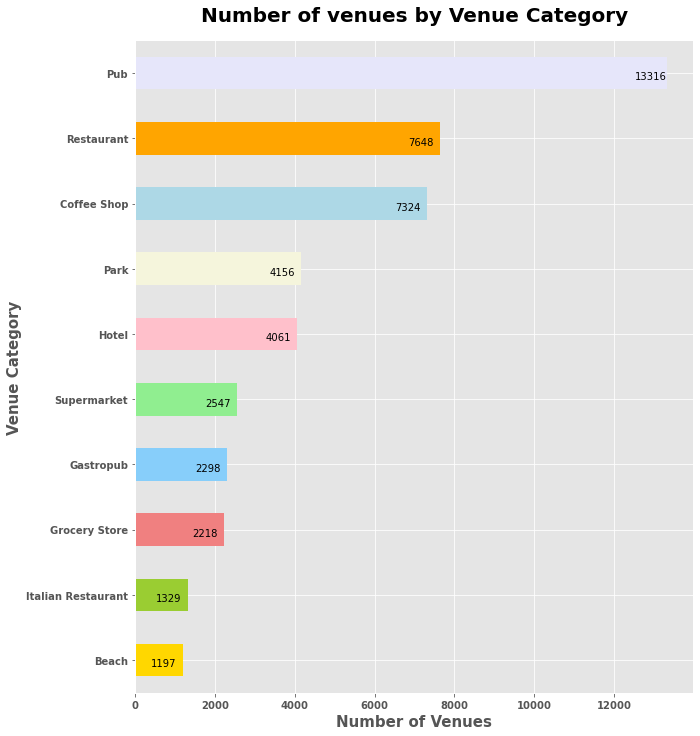

In [23]:
mpl.style.use('ggplot') 
ukvisuals = uksummed.copy()
ukvisuals['Total'] = ukvisuals.sum(axis = 1)
ukvisuals = ukvisuals.join(uk.groupby('Region').sum()[['Population', 'Households', 'Latitude', 'Longitude']])
ukvisuals.sort_values(by = 'Total', ascending = False, inplace = True)
venuecategories = ukvisuals.drop(columns = ['Population', 'Households', 'Latitude', 'Longitude', 'Total']).sum().to_frame()
venuecategories.rename(columns = {0:'Count'}, inplace = True)
venuecategories['Venue Category'] = venuecategories.index
venuecategories.reset_index()
venuecategories.set_index('Venue Category')
venuecategories.sort_values(by = 'Count', ascending = False, inplace = True)
topvenues = venuecategories[0:10]
topvenues.loc['Other'] = 'Other'
topvenues.loc['Other', 'Count'] = venuecategories.tail(341)['Count'].sum()
topvenues.loc['Other', 'Venue Category'] = 'n/a'
topvenues.loc[['Other']]
topvenues.sort_values(by = 'Count', ascending = True, inplace = True)
topvenues.set_index('Venue Category')
colors_list = ['gold', 'yellowgreen', 'lightcoral', 'lightskyblue', 'lightgreen', 'pink', 'beige', 'lightblue', 'orange', 'lavender']
topvenues.head(10)['Count'].plot(kind='barh',
                            figsize=(10, 12),
                            color = colors_list
                                )
plt.title('Number of venues by Venue Category', size =20, fontweight = 'bold', y = 1.02)
for index, value in enumerate(topvenues.head(10)['Count']):  
    label = value
    plt.annotate(label, xy=(value - 800, index-0.1), color='black')
plt.xlabel('Number of Venues', fontweight = 'bold', size = 15)
plt.xticks(fontweight = 'bold')
plt.yticks(fontweight = 'bold')
plt.ylabel('Venue Category', fontweight = 'bold', size = 15)

Here is the Pearson Coefficient and Pvalue of the 10 venue categories with the highest frequency. **Some venue categories like *Beach* are not highly correlated with Population**. The top 5 venues categories by frequency are also in the top 10 of venue categories which are correlated to population 

In [24]:
coeff2 = pd.DataFrame(columns = ['Feature', 'Pearson coeff', 'Pvalue'])
for i in np.arange(0,len(topvenues.index)-1):
    pearson_coef2, p_value2 = stats.pearsonr(uksummeddata['Population (normalized)'], uksummeddata[topvenues.index[i]])
    coeff2.loc[i, 'Pearson coeff'] = pearson_coef2
    coeff2.loc[i, 'Pvalue'] = p_value2
    coeff2.loc[i, 'Feature'] = topvenues.index[i]
coeff2 = coeff2.set_index('Feature')
coeff2.sort_values(by = 'Pvalue', ascending = True)

,Pearson coeff,Pvalue
Feature,,
Pub,0.483733,2.97636e-26
Restaurant,0.469571,1.22272e-24
Coffee Shop,0.441436,1.19744e-21
Park,0.392206,4.83179e-17
Italian Restaurant,0.369254,3.82738e-15
Gastropub,0.298681,3.47658e-10
Hotel,0.293779,6.91348e-10
Supermarket,0.293136,7.55912e-10
Grocery Store,0.257192,7.83539e-08


This pie chart shows the proportion of the top 10 venue categories in the dataset, to all the venues in the dataset. **60.4% of all the venues in the dataset, belong to the top 10 venue categories.**

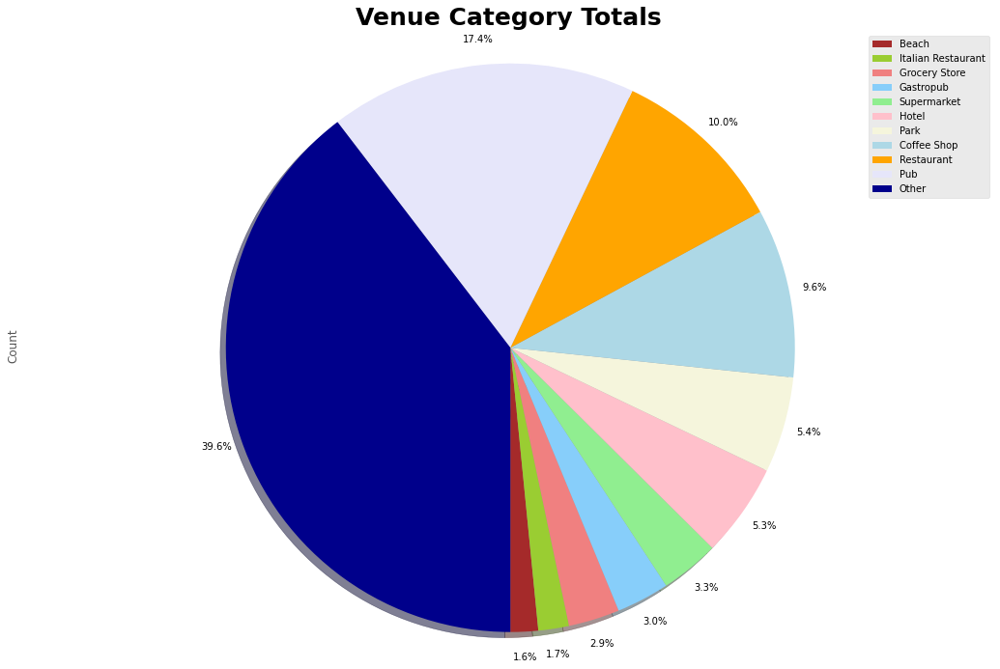

In [25]:
colors_list = ['brown', 'yellowgreen', 'lightcoral', 'lightskyblue', 'lightgreen', 'pink', 'beige', 'lightblue', 'orange', 'lavender', 'darkblue']
topvenues['Count'].plot(kind='pie',
                            figsize=(18, 12),
                            autopct='%1.1f%%', 
                            startangle=270,    
                            shadow=True,
                            labels = None,         # turn off labels on pie chart
                            pctdistance=1.09,    # the ratio between the center of each pie slice and the start of the text generated by autopct 
                            colors=colors_list,  # add custom colors
                            explode=None         
                            )
plt.autoscale()
plt.title('Venue Category Totals', size = 25, fontweight = 'bold') 
plt.axis('equal') 
# add legend
plt.legend(labels=topvenues.index, loc='best') 

This box plot shows the average number of each venue category per town. **Each town in the UK has an average of 31 pubs!**

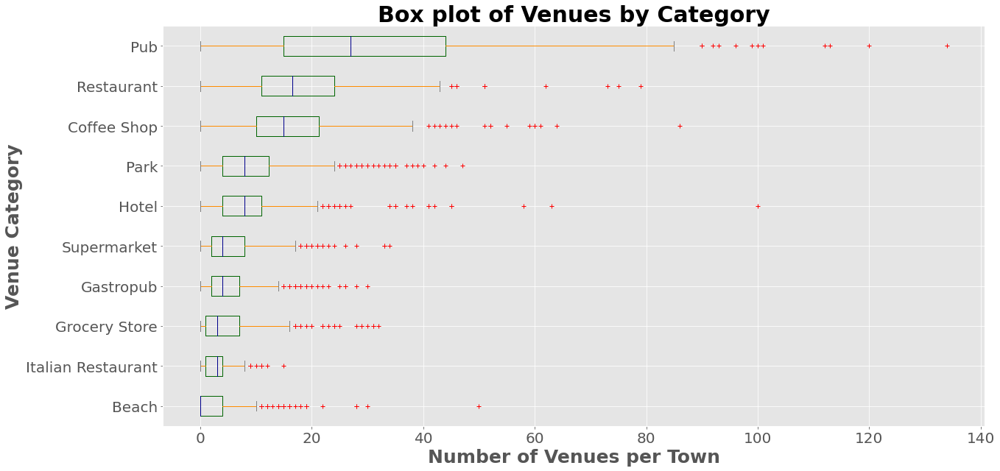

In [26]:
colorbox = dict(boxes='DarkGreen', whiskers='DarkOrange',
                medians='DarkBlue', caps='Gray')
ukvisuals[topvenues.head(10).index].plot(kind='box', sym = 'r+', color = colorbox, vert = False, figsize = (20,10))
plt.title('Box plot of Venues by Category', size = 30, fontweight = 'bold')
plt.ylabel('Venue Category', size = 25, fontweight = 'bold')
plt.xlabel('Number of Venues per Town', size = 25, fontweight = 'bold')
plt.xticks(size = 20)
plt.yticks(size = 20)
plt.show()

In [27]:
ukvisuals[topvenues.head(10).index].describe().round().T.sort_values(by = 'mean', ascending = False)

,count,mean,std,min,25%,50%,75%,max
Pub,424.0,31.0,22.0,0.0,15.0,27.0,44.0,134.0
Restaurant,424.0,18.0,11.0,0.0,11.0,16.0,24.0,79.0
Coffee Shop,424.0,17.0,11.0,0.0,10.0,15.0,21.0,86.0
Hotel,424.0,10.0,9.0,0.0,4.0,8.0,11.0,100.0
Park,424.0,10.0,9.0,0.0,4.0,8.0,12.0,47.0
Supermarket,424.0,6.0,6.0,0.0,2.0,4.0,8.0,34.0
Grocery Store,424.0,5.0,6.0,0.0,1.0,3.0,7.0,32.0
Gastropub,424.0,5.0,5.0,0.0,2.0,4.0,7.0,30.0
Beach,424.0,3.0,5.0,0.0,0.0,0.0,4.0,50.0
Italian Restaurant,424.0,3.0,3.0,0.0,1.0,3.0,4.0,15.0


**Each town in the UK has an average of 180 venues**. Remember each town is defined by grouping all the postcodes in the ***Region*** column of the geographic data. For each postcode, the nearest 100 venues in a 5km radius are searched so for each town, an average of 180 venues is reasonable. There is a high **standard deviation of 101** so towns vary considerably in the total number of venues as a function of population. This is why venue category density (**DataFrame II**) is a better measure for comparing towns

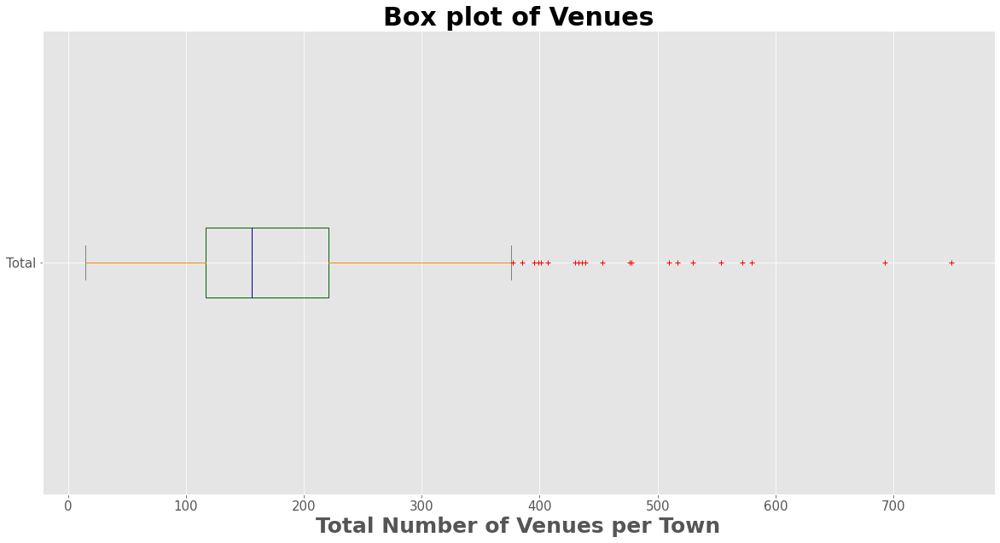

,Total
count,424.0
mean,180.0
std,101.0
min,15.0
25%,117.0
50%,156.0
75%,221.0
max,749.0


In [28]:
ukvisuals[['Total']].plot(kind='box', sym = 'r+', color = colorbox, vert = False, figsize = (20,10))
plt.title('Box plot of Venues', size = 30, fontweight = 'bold')
plt.xlabel('Total Number of Venues per Town', size = 25, fontweight = 'bold')
plt.yticks(size = 15)
plt.xticks(size = 15)
plt.show()
ukvisuals[['Total']].describe().round()

**Cornwall is the town with the highest number of venues**

In [29]:
ukvisuals[['Total']]

,Total
Town/Area,
Cornwall,749
Highland,693
Hampshire,580
North Yorkshire,572
Wiltshire,554
...,...
Kirkcudbrightshire,19
Strabane,18
Wigtownshire,16


The average Population/per town in the UK is **148947** with a standard deviation of **135596**. **The distribution of Population is log-normal**. 75% of the towns have a population between 60796 and 196748 which are less than a standard deviation away from the mean as shown in the box plot and distribution plots below

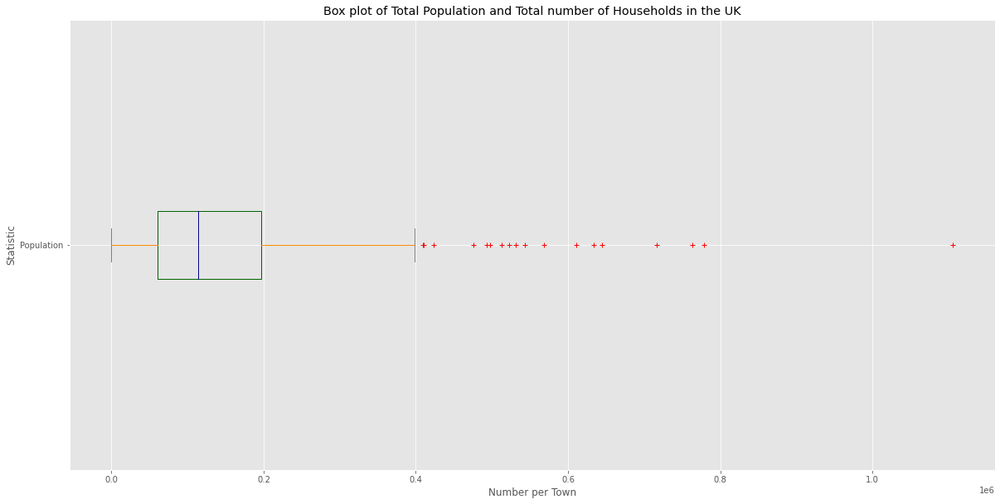

In [30]:
ukvisuals[['Population']].plot(kind='box', sym = 'r+', color = colorbox, vert = False, figsize = (20,10))
plt.title('Box plot of Total Population and Total number of Households in the UK')
plt.ylabel('Statistic')
plt.xlabel('Number per Town')
plt.show()

In [31]:
ukvisuals[['Population']].describe().round()

,Population
count,424.0
mean,148947.0
std,135596.0
min,0.0
25%,60796.0
50%,113848.0
75%,196748.0
max,1105310.0


No handles with labels found to put in legend.


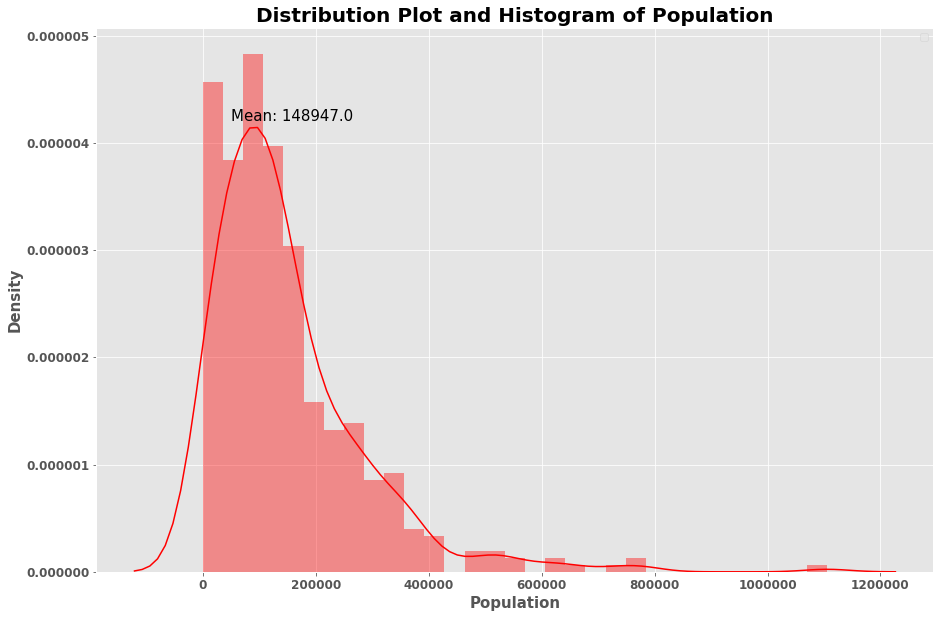

In [32]:
plt.figure(figsize = (15,10))
plt.autoscale()
ax = sns.distplot(uksummeddata['Population'], hist=True, color='red')
ax.ticklabel_format(useOffset=False, style='plain')
plt.ylabel('Density', size = 15, fontweight = 'bold')
plt.xlabel('Population', size = 15, fontweight = 'bold')
plt.title('Distribution Plot and Histogram of Population', size = 20, fontweight = 'bold')
plt.annotate('Mean: {}'.format(uksummeddata['Population'].mean()), xy = (uksummeddata['Population'].mean()-100000,0.0000042), size = 15)
plt.xticks(size = 12, fontweight = 'bold')
plt.yticks(size = 12, fontweight = 'bold')
plt.legend()

**Here is a map of the UK displaying the distribution of Population**. The lack in color variation is due to the population being log-normally distributed 

In [33]:
Popmap = folium.Map(location=[uklat, uklong], zoom_start=7, tiles ='Stamen Toner')
pop = pd.DataFrame(list(ukdataset['Population (normalized)'])) #Replace Population (normalized) everywhere it appears in this code block with Feature of Choice to visualize geopgraphical distribution of any feature
pop.rename(columns = {0:'Population (normalized)'}, inplace = True)
normalisedpop = pd.DataFrame(round((pop['Population (normalized)']/pop['Population (normalized)'].max())*100)).astype(int)
popx = np.arange(1, max(normalisedpop['Population (normalized)'])+1) #the maximum value of the normalized feature is 1, which when multiplied by 100 is 100
popys = [i + (popx)**2 + (i*popx)**2 for i in range(1,max(normalisedpop['Population (normalized)'])+1)]
popcolors_array = plt.cm.Spectral(np.linspace(0, 1, len(popys)))
poprainbow = [colors2.rgb2hex(i) for i in popcolors_array]
# loop through through each feature and add to the map
Popcolor = []
for i, j in enumerate(normalisedpop['Population (normalized)']):
    popcolor = poprainbow[j-1]
    Popcolor.append(popcolor)
for lat, lng, poi, pop, number in zip(ukdataset['Latitude'], ukdataset['Longitude'], ukdataset['Town/Area'], list(ukdataset['Population (normalized)']), normalisedpop['Population (normalized)']):
    label = folium.Popup(str(poi) + '' + 'Population (normalized)' + str(pop), parse_html=True)
    folium.features.CircleMarker(
        [lat, lng],
        radius=3, 
        color=Popcolor[number],
        fill=True,
        popup=label,
        fill_color=Popcolor[number],
        fill_opacity=0.8
  ).add_to(Popmap)
Popmap

**Creating Population Bins**

The population of towns can be segmented into equally spaced bins. 6 evenly spaced bins were chosen.

(array([-200000.,       0.,  200000.,  400000.,  600000.,  800000.,
        1000000., 1200000.]),
 [Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, '')])

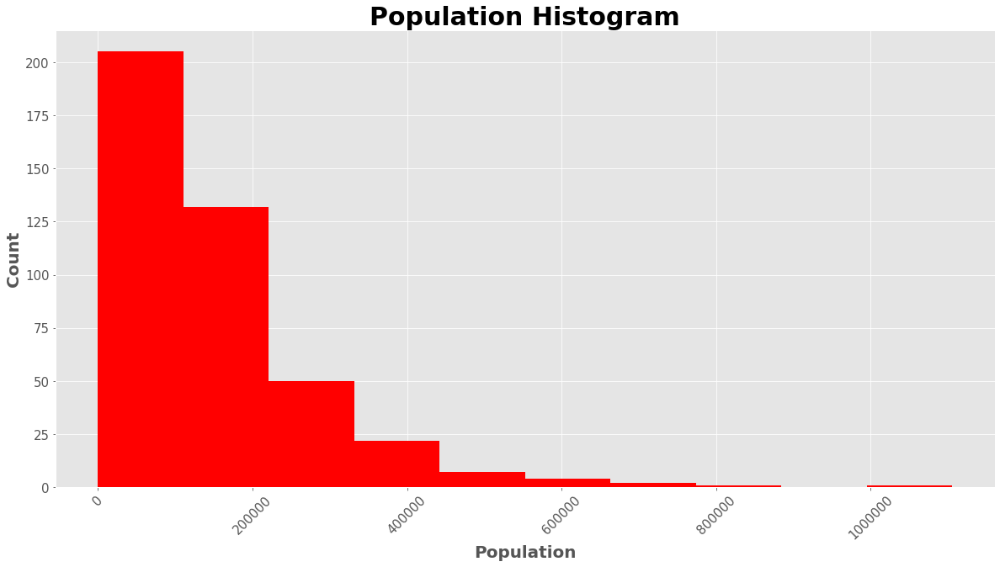

In [34]:
plt.figure(figsize = (20,10))
plt.ticklabel_format(style='plain', scilimits=None)
binpop = uksummeddata.copy()
plt.hist(binpop["Population"], color = 'red')
# set x/y labels and plot title
plt.xlabel("Population", size =20, fontweight = 'bold')
plt.ylabel("Count", size=20, fontweight = 'bold')
plt.title("Population Histogram", size=30, fontweight = 'bold')
plt.yticks(size = 15)
plt.xticks(rotation=45, size = 15)

In [35]:
bins = np.linspace(min(binpop['Population']), max(binpop["Population"]), 7)

In [36]:
group_names = pd.DataFrame()
for i in np.arange(1, len(bins)):
    group_names.loc[i, 'Bin'] = "Bin" + (i).astype(str)  + "(" + bins.astype(int)[i-1].astype(str) + "-" + bins.astype(int)[i].astype(str) + ")"
group_names

,Bin
1,Bin1(0-184218)
2,Bin2(184218-368436)
3,Bin3(368436-552655)
4,Bin4(552655-736873)
5,Bin5(736873-921091)
6,Bin6(921091-1105310)


In [37]:
binpop['Pop-binned'] = pd.cut(binpop['Population'], bins, labels=np.array(group_names['Bin']), include_lowest=True)
binpop['Pop-binned']

Town/Area
Aberdeen         Bin2(184218-368436)
Aberdeenshire    Bin2(184218-368436)
Adur                  Bin1(0-184218)
Allerdale             Bin1(0-184218)
Amber Valley          Bin1(0-184218)
                        ...         
Wychavon              Bin1(0-184218)
Wycombe               Bin1(0-184218)
Wyre                  Bin1(0-184218)
Wyre Forest           Bin1(0-184218)
York             Bin2(184218-368436)
Name: Pop-binned, Length: 424, dtype: category
Categories (6, object): [Bin1(0-184218) < Bin2(184218-368436) < Bin3(368436-552655) < Bin4(552655-736873) < Bin5(736873-921091) < Bin6(921091-1105310)]

**309 of the 424 towns belong to Bin 1, which has a maximum population which is near the 75% percentile.**

In [38]:
binpop['Population'].head()
binpop['Pop-binned'].value_counts()

Bin1(0-184218)          309
Bin2(184218-368436)      93
Bin3(368436-552655)      14
Bin4(552655-736873)       5
Bin5(736873-921091)       2
Bin6(921091-1105310)      1
Name: Pop-binned, dtype: int64

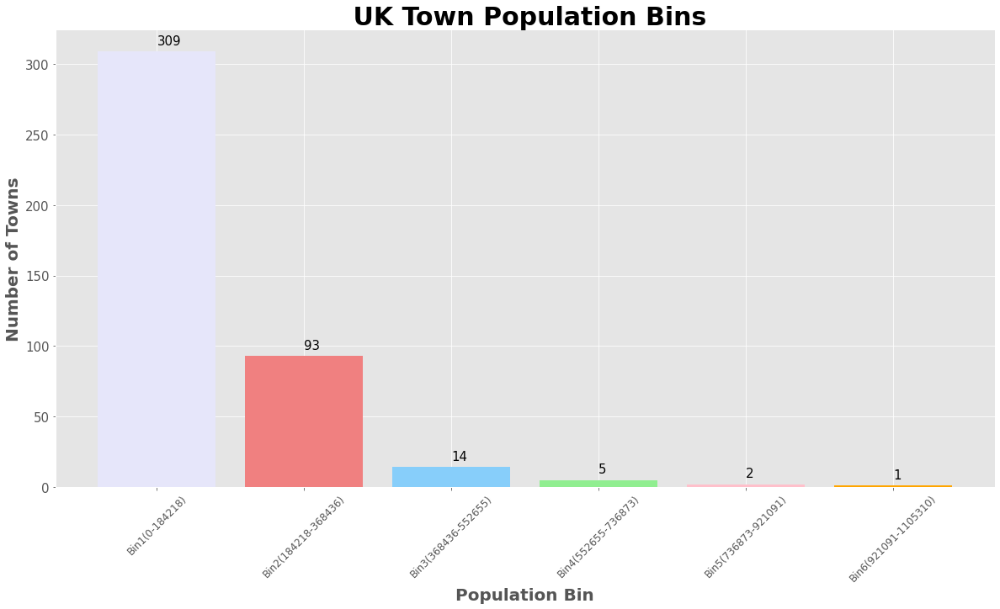

In [39]:
plt.figure(figsize = (20,10))
colors_pop = ['lavender', 'lightcoral', 'lightskyblue', 'lightgreen', 'pink', 'orange', 'lavender']
pyplot.bar(binpop['Pop-binned'].value_counts().index, binpop['Pop-binned'].value_counts(), color = colors_pop)
# set x/y labels and plot title
plt.xlabel("Population Bin", size = 20, fontweight = 'bold')
plt.ylabel("Number of Towns", size = 20, fontweight = 'bold')
plt.title(" UK Town Population Bins", size = 30, fontweight = 'bold')
plt.yticks(size = 15)
plt.xticks(rotation=45, size = 12) 
for index, value in enumerate(binpop['Pop-binned'].value_counts()):  
    label = value
    plt.annotate(label, xy = (index, value + 5), color='black', size = 15)

Text(0.5, 1.0, 'Histogram of UK Population (Binned)')

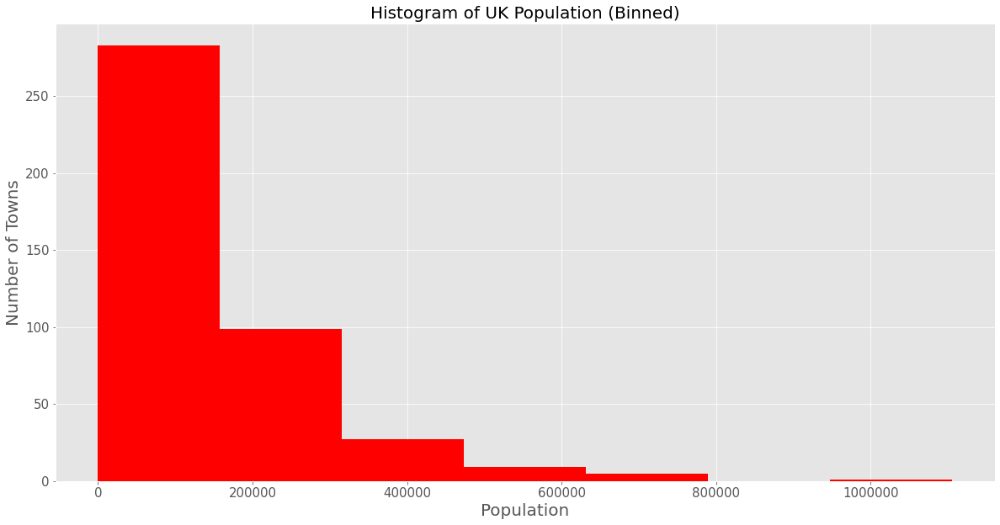

In [40]:
plt.figure(figsize = (20,10))
plt.ticklabel_format(style='plain', scilimits=None)
plt.yticks(size = 15)
plt.xticks(size = 15)
plt.hist(binpop["Population"], bins = 7, color = 'red')
plt.xlabel("Population", size = 20)
plt.ylabel("Number of Towns", size = 20)
plt.title("Histogram of UK Population (Binned)", size = 20)

Join the population bins to the dataset

In [41]:
#ukdataset.drop(columns = 'Pop-binned', inplace = True) #uncomment line every time you need to rerun this cell after the first time.
ukdataset = ukdataset.join(binpop['Pop-binned'])
ukdataset[['Pop-binned']].head()

,Pop-binned
Town/Area,
Aberdeen,Bin2(184218-368436)
Aberdeenshire,Bin2(184218-368436)
Adur,Bin1(0-184218)
Allerdale,Bin1(0-184218)
Amber Valley,Bin1(0-184218)


### **Regression**

**Linear Regression**

In Linear Regression, a linear function is modeled to predict the Population as a function of a feature or feature(s) in the dataset. The performance of the model is evaluated using **R^2 (R-Square)** or the **Coefficient of Determination**, which is a measure of how closely the regression line fits the data. R^2 is a number ranging from negative values to 1. Negative values signify overfitting, and values between 0 and 1, signify the strength of the fit, where 1 equals a perfect fit to the data. **Mean Squared Error (MSE)** is an absolute measure of the error of prediction. The higher the MSE, the worse the fit. The order of magnitude of this value is normally within the order of magnitude of the data.  Hence **R^2** is the metric to pay closer attention as its intuitive meaning is independent of the data. 

**Feature Selection**

The features which are selected for linear regression are the 10 features with the highest correlation to Population

In [42]:
regressionset = uksummeddata
regcol = ['Theater', 'Pub', 'Restaurant', 'Coffee Shop', 'Museum', 'Park', 'Indian Restaurant', 'Movie Theater', 'History Museum', 'Italian Restaurant', 'Population (normalized)']
X = regressionset[[regcol[1]]] #select feature 
Y = regressionset[regcol[10]] # Population (normalized)
Z = regressionset[regcol[:10]] #All Features
Z.columns

Index(['Theater', 'Pub', 'Restaurant', 'Coffee Shop', 'Museum', 'Park',
       'Indian Restaurant', 'Movie Theater', 'History Museum',
       'Italian Restaurant'],
      dtype='object')

**Simple Linear Regression**

Simple Linear Regression (SLR) has the form **Y = mx + c**, where Y is the vector of predictions, m is the coefficient vector, x is the feature vector and c is the intercept. SLR will be performed on five of the features.

A linear regression model will be fit to each feature vector and the corresponding target vector. The target vector is the population for all the towns, and the feature vector is one of the individual selected features. A prediction will be made of the population for each town which is the average of each prediction from 4-fold cross validation using the SLR model. 

In [43]:
theatre = LinearRegression()                                                          #Fit and predict for each Linear Regression Model
theatre.fit(regressionset[[regcol[0]]],Y)
yhattheatre = theatre.predict(regressionset[[regcol[0]]])
yhatcrosstheatre = cross_val_predict(theatre, regressionset[[regcol[0]]], Y, cv = 4)
pubby = LinearRegression()
pubby = pubby.fit(regressionset[[regcol[1]]],Y)
yhatpubs = pubby.predict(regressionset[[regcol[1]]])
yhatcrosspubs = cross_val_predict(pubby, regressionset[[regcol[1]]], Y, cv = 4)
restaurant = LinearRegression()
restaurant = restaurant.fit(regressionset[[regcol[2]]],Y)
yhatrestaurant = restaurant.predict(regressionset[[regcol[2]]])
yhatcrossrestaurant = cross_val_predict(restaurant, regressionset[[regcol[2]]], Y, cv = 4)
coffee = LinearRegression()
coffee= coffee.fit(regressionset[[regcol[3]]],Y)
yhatcoffee = coffee.predict(regressionset[[regcol[3]]])
yhatcrosscoffee = cross_val_predict(coffee, regressionset[[regcol[3]]], Y, cv = 4)
movies = LinearRegression()
movies= movies.fit(regressionset[[regcol[7]]],Y)
yhatmovies = movies.predict(regressionset[[regcol[7]]])
yhatcrossmovies = cross_val_predict(movies, regressionset[[regcol[7]]], Y, cv = 4)

**Multiple Linear Regression**

Multiple Linear Regression (MLR) is of the form **Y = mx + c**, where Y is the vector of predictions, m is the coefficient vector, X is the feature matrix and c is the intercept. 

Alternatively it can be written as **Y = aX1 + bX2 + cX3 + dX4 +...+ nXn + m** where Y is the vector of the predictions, a, b, c...n are coefficients, X1, X2, X3...Xn are feature vectors and m is the intercept (a coefficient multiplied by a zeroth order feature i.e. 1)

**A multiple linear regression model will be fit to a feature matrix consisting of the 10 features and the corresponding target vector - the population.** 

In [44]:
ukmultipleregression = LinearRegression() #call Linear Regression Model
ukmultipleregression.fit(Z, Y) #fit to dataset with all the samples, features and true target values of population
Ymulthat = ukmultipleregression.predict(Z) #predict on dataset the population for each town as a function of all the features -> a regression line

**Linear Regression with Polynomial Features**

Here is a linear regression fit for ***Pub*** using seaborn's *regplot* function

Text(0.5, 0, 'Pub')

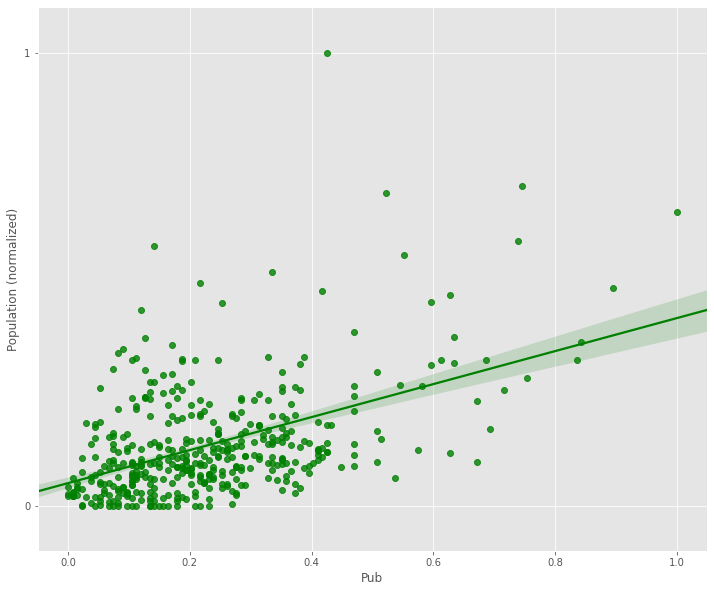

In [45]:
width = 12
height = 10
plt.figure(figsize=(width, height))
sns.regplot(regressionset[[regcol[1]]], Y, data = uksummeddata, ci = 80, color = 'green')
plt.yticks(np.arange(-6, 6))
plt.ylim(-0.1,1.1)
plt.xlabel(regcol[1])

Here is the same plot manually generated by calling and fitting the linear regression function

(array([-0.2,  0. ,  0.2,  0.4,  0.6,  0.8,  1. ,  1.2]),
 [Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, '')])

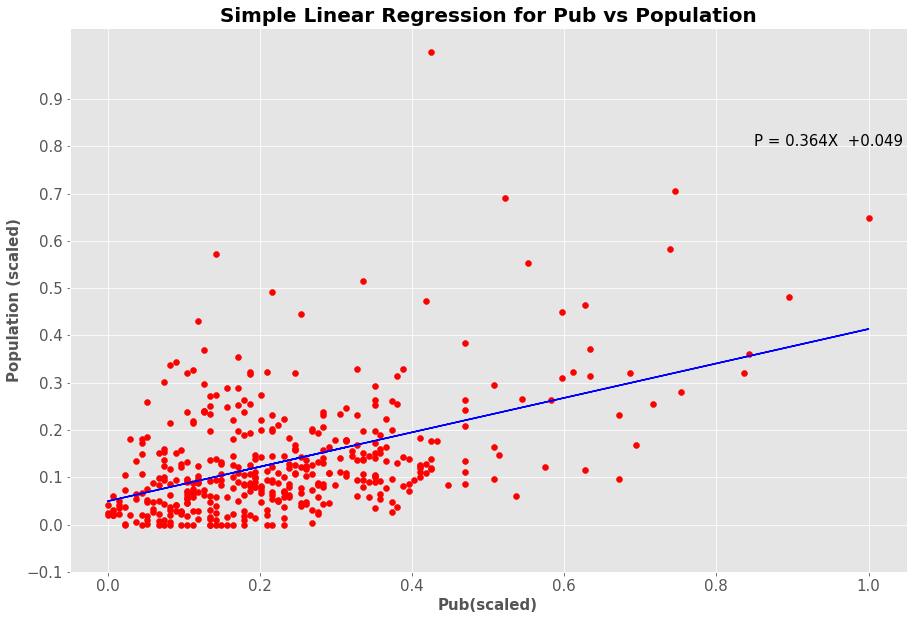

In [46]:
plt.figure(figsize = (15, 10))
plt.scatter(uksummeddata[regcol[1]], uksummeddata['Population (normalized)'], color = 'red')
plt.plot(uksummeddata[regcol[1]], (pubby.coef_*uksummeddata[regcol[1]] + pubby.intercept_).values, color = 'blue')
plt.annotate('P = {}X  +{}'.format(pubby.coef_[0].round(3), pubby.intercept_.round(3)), xy = (0.85,0.8), size = 15)
plt.title('Simple Linear Regression for {} vs Population'.format(regcol[1]), size = 20, fontweight = 'bold')
plt.xlabel(regcol[1] + '(scaled)', size = 15, fontweight = 'bold')
plt.ylabel('Population (scaled)', size = 15, fontweight = 'bold')
plt.yticks(np.arange(-0.1, 1, 0.1), size = 15)
plt.xticks(size = 15)

A residual plot suggests that the relationship between the feature **Pub** and Population *may not be linear* as the residuals are not equally distributed about the x-axis

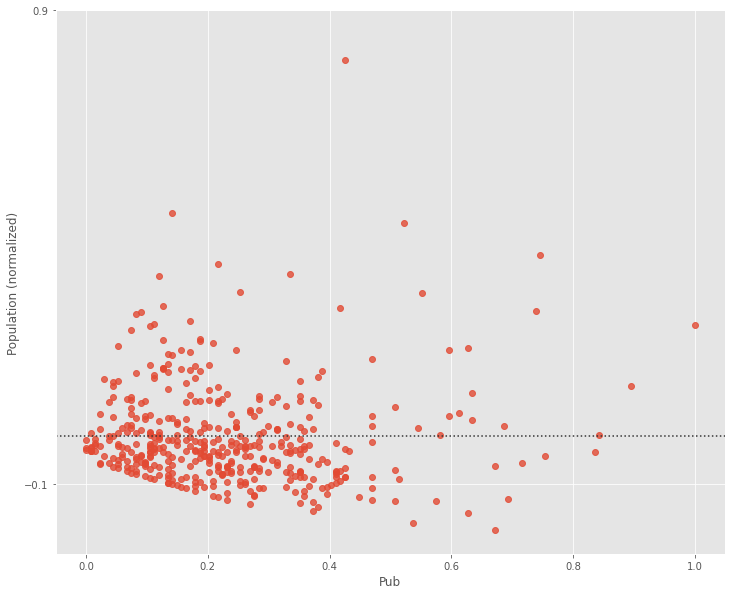

In [47]:
width = 12
height = 10
plt.figure(figsize=(width, height))
sns.residplot(X, Y)
plt.yticks(np.arange(-0.1, 1.1))
plt.xlabel(regcol[1])
plt.show()

The relationship between population and some features may be better described by a non-linear function such as a polynomial function. 

Below is a polynomial fit for ***Pub*** with a 4th order polynomial

In [48]:
def PlotPolly(model, independent_variable, dependent_variabble, Name):
    x_new = np.linspace(0, 1, 30)
    y_new = model(x_new)
    plt.plot(independent_variable, dependent_variabble, '.', x_new, y_new, '-')
    plt.title('Polynomial Regression for Population vs {} '.format(regcol[1]), size = 20, fontweight = 'bold')
    #ax = plt.gca()
    ax.set_facecolor((0.898, 0.898, 0.898))
   # fig = plt.gcf()
    plt.xlabel(Name  + '(scaled)', size = 15, fontweight = 'bold')
    plt.ylabel('Population (scaled)', size = 15, fontweight = 'bold')
    plt.show()
    plt.close()

In [49]:
x = regressionset[regcol[1]].astype(float)
y=Y.astype(float)
f = np.polyfit(x, y,4)
p = np.poly1d(f)
print('Polynomial Function P = {}X^4 + {}X^3 {}X^2 + {}X  +{}'.format(f[0], f[1], f[2], f[3], f[4]))

Polynomial Function P = -2.2306001593892235X^4 + 4.424589293540049X^3 -2.3651068141112765X^2 + 0.6828769987068437X  +0.049337751965164586


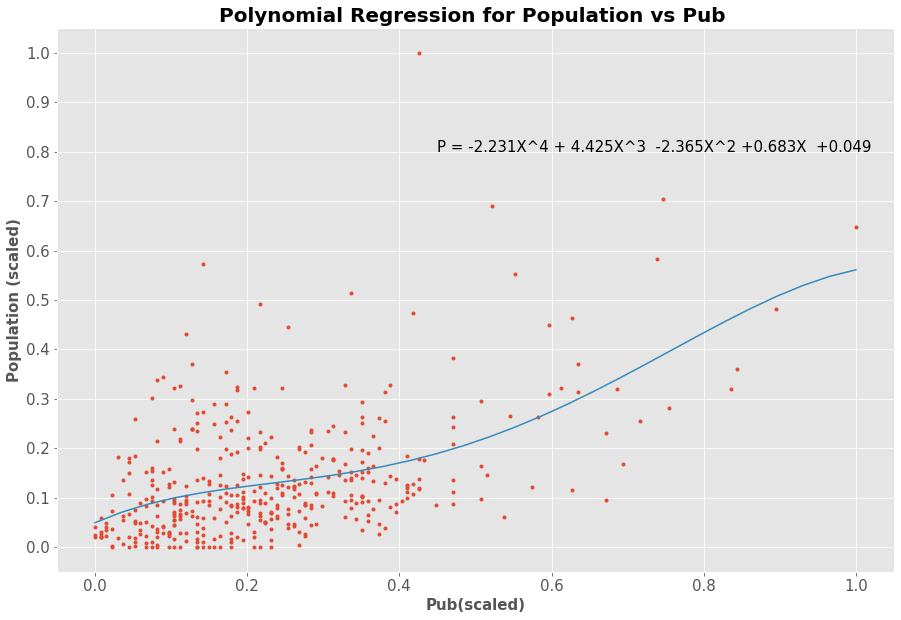

In [50]:
plt.figure(figsize = (15,10))
plt.yticks(np.arange(-0.1, 1.1, 0.1), size = 15)
plt.xticks(size = 15)
plt.annotate('P = {}X^4 + {}X^3  {}X^2 +{}X  +{}'.format(f[0].round(3), f[1].round(3), f[2].round(3), f[3].round(3), f[4].round(3)), xy = (0.45,0.8), size = 15)
PlotPolly(p, x, y, regcol[1])

We can visually investigate other orders of polynomials and the fit to the test data for different train/test splits

In [51]:
def PollyPlot(xtrain, xtest, y_train, y_test, lr,poly_transform):  #Investigate Polynomial Functions of different orders for individual features given different train/test splits
    width = 20
    height = 10
    plt.figure(figsize=(width, height))
    #training data 
    #testing data 
    # lr:  linear regression object 
    #poly_transform:  polynomial transformation object 
    xmax=max([xtrain.values.max(), xtest.values.max()])
    xmin=min([xtrain.values.min(), xtest.values.min()])
    x=np.arange(xmin, xmax, 0.1)
    plt.plot(xtrain, y_train, 'bo', label='Training Data')
    plt.plot(xtest, y_test, 'go', label='Test Data')
    plt.plot(x, lr.predict(poly_transform.fit_transform(x.reshape(-1, 1))), label='Predicted Function')
    plt.ylim([-0.1, 1])
    plt.ylabel(regcol[10])
    plt.xlabel(regcol[1])
    plt.legend()

In [52]:
def f(order, test_data):
    x_train, x_test, y_train, y_test = train_test_split(Z, Y, test_size=test_data, random_state=0)
    pr = PolynomialFeatures(degree=order)
    x_train_pr = pr.fit_transform(x_train[[regcol[1]]])
    x_test_pr = pr.fit_transform(x_test[[regcol[1]]])
    poly = LinearRegression()
    poly.fit(x_train_pr,y_train)
    PollyPlot(x_train[[regcol[1]]], x_test[[regcol[1]]], y_train,y_test, poly, pr)

In [53]:
interact(f, order=(0, 8, 1), test_data=(0.10, 0.70, 0.05))

interactive(children=(IntSlider(value=4, description='order', max=8), FloatSlider(value=0.4, description='test…

<function __main__.f(order, test_data)>

The relationship between all the selected features and the population can be described by an n-degree polynomial transformation of the features. The degree of the polynomial is selected by determining the mean 3-fold cross-validation R-square for different Polynomial transformation degrees. The higher the R^2 the better the fit. **Here we can see that the R-Square increases until the transformation order reaches 1, after which it declines to about 0 at transformation order 2 and then negative for higher orders which signifies overfitting**. 1st degree transformation means the multiple linear regression features stay the same as they are all already first degree. A 2nd degree polynomial feature transformation will also be carried out for comparison. 

In [ ]:
Rsqu = []
order = np.arange(0, 4)
for n in order:
    pr = PolynomialFeatures(degree=n)
    lr = LinearRegression()
    Z_pr = pr.fit_transform(Z)   
    lr.fit(Z_pr, Y)
    Rsqu.append(cross_val_score(lr, Z_pr, Y, cv=3).mean())

In [ ]:
import matplotlib.pyplot as plt 
plt.figure(figsize = (16,10))
plt.plot(order, Rsqu)
plt.xlabel('Order', size = 20, fontweight = 'bold')
plt.xticks(size =15)
plt.yticks(size = 15)
plt.ylabel('R^2', size = 20, fontweight = 'bold')
plt.ylim(-1,0.5, 1)
plt.title('Mean 3-fold Cross-Validation R^2 vs Polynomial Feature Order', size = 25, fontweight = 'bold')
plt.savefig('PolynomialFeatures_Deg2.png', )

The best Polynomial Feature Transformation order is **1**

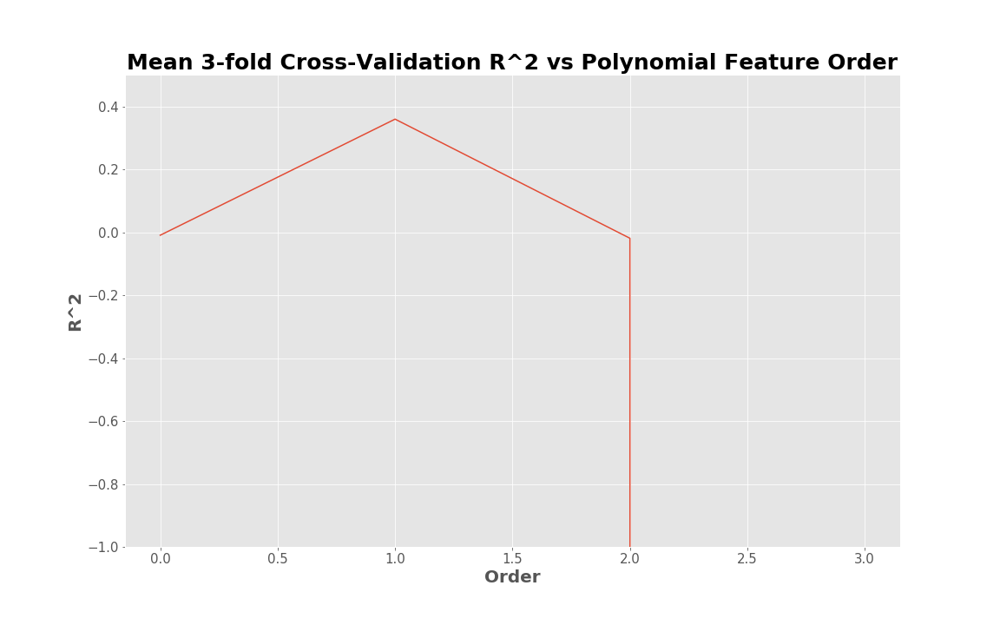

In [54]:
polyorder = IM.open('PolynomialFeatures2_CrossVal.png') 
polyorder

Split the Feature Matrix into a train and test set. 

    Train: 70%
    Test: 30%

In [55]:
Z_full_train, Z_full_test, Y_full_train, Y_full_test = train_test_split(Z, Y, test_size=0.3, random_state=0)
print('There are', Z_full_train.shape[0], 'samples (towns) in the training set')
print('There are', Z_full_test.shape[0], 'samples (towns) in the test set')

There are 296 samples (towns) in the training set
There are 128 samples (towns) in the test set


For a 70/30 train test split, the best polynomial feature transformation order is also 1. **A 1st degree transformation is equivalent to the Multiple Linear Regression Model as the features are all 1st order. A 2nd Degree Polynomial Transformation will also be carried out to compare the results.**

In [ ]:
Rsqu_test = []
order = np.arange(0, 4)
for n in order:
    pr = PolynomialFeatures(degree=n)
    lr = LinearRegression()
    
    Z_full_train_pr = pr.fit_transform(Z_full_train)
    
    Z_full_test_pr = pr.fit_transform(Z_full_test)    
    
    lr.fit(Z_full_train_pr, Y_full_train)
    
    Rsqu_test.append(lr.score(Z_full_test_pr, Y_full_test))

In [ ]:
import matplotlib.pyplot as plt 
plt.figure(figsize = (16,10))
plt.plot(order, Rsqu)
plt.xlabel('Order', size = 20, fontweight = 'bold')
plt.xticks(size =15)
plt.yticks(size = 15)
plt.ylabel('R^2', size = 20, fontweight = 'bold')
plt.ylim(-6,1, 1)
plt.title('R^2 vs Polynomial Feature Order for 70% to 30% train/test split', size = 25, fontweight = 'bold')
plt.savefig('Polyfeaturestest.png')

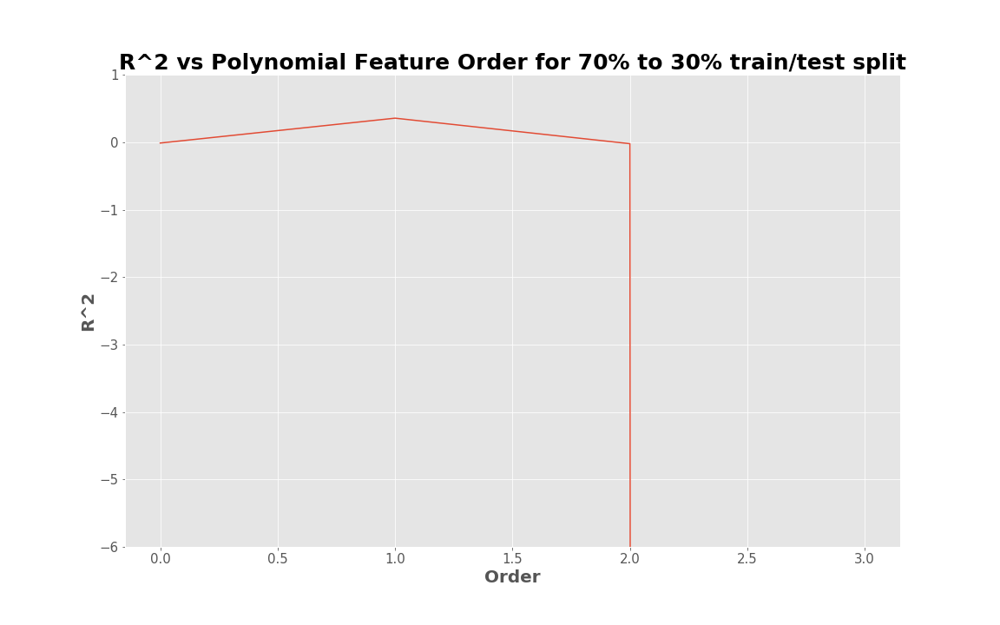

In [56]:
polyordertest = IM.open('Polyfeaturestest.png') 
polyordertest

**1st Degree Transformation**

In [57]:
pr=PolynomialFeatures(degree=1)
pr
Z_pr=pr.fit_transform(Z)

In [58]:
print('Original Feature Set: {} features'.format(Z.shape[1]))
Z

Original Feature Set: 10 features


,Theater,Pub,Restaurant,Coffee Shop,Museum,Park,Indian Restaurant,Movie Theater,History Museum,Italian Restaurant
Town/Area,,,,,,,,,,
Aberdeen,0.285714,0.164179,0.202532,0.151163,0.166667,0.106383,0.230769,0.000000,0.083333,0.133333
Aberdeenshire,0.428571,0.216418,0.303797,0.279070,0.166667,0.127660,0.153846,0.000000,0.083333,0.133333
Adur,0.142857,0.097015,0.151899,0.209302,0.000000,0.127660,0.153846,0.333333,0.083333,0.133333
Allerdale,0.142857,0.223881,0.088608,0.174419,0.500000,0.042553,0.000000,0.166667,0.000000,0.133333
Amber Valley,0.285714,0.425373,0.240506,0.139535,0.333333,0.276596,0.538462,0.500000,0.000000,0.133333
...,...,...,...,...,...,...,...,...,...,...
Wychavon,0.857143,0.395522,0.316456,0.372093,0.500000,0.191489,0.230769,0.166667,0.250000,0.133333
Wycombe,0.285714,0.388060,0.329114,0.151163,0.333333,0.127660,0.076923,0.000000,0.000000,0.533333
Wyre,0.285714,0.194030,0.088608,0.081395,0.166667,0.106383,0.076923,0.166667,0.000000,0.133333


In [59]:
print('Polynomial Degree-1 Feature Transformation transforms 10 features into {} Polynomial Features and a zeroth order feature of the form:'.format(Z_pr.shape[1]-1))
print(pd.DataFrame(pr.get_feature_names()).head(20).T)
pd.DataFrame(pr.get_feature_names()).T

Polynomial Degree-1 Feature Transformation transforms 10 features into 10 Polynomial Features and a zeroth order feature of the form:
   0   1   2   3   4   5   6   7   8   9  10
0  1  x0  x1  x2  x3  x4  x5  x6  x7  x8  x9


,0,1,2,3,4,5,6,7,8,9,10
0,1,x0,x1,x2,x3,x4,x5,x6,x7,x8,x9


In [60]:
print('Polynomial Features Degree-1 feature set has the shape', Z_pr.shape)
print('The 1st degree transformation produces an identical feature set to the one used for Multiple Linear Regression')
pd.DataFrame(Z_pr)

Polynomial Features Degree-1 feature set has the shape (424, 11)
The 1st degree transformation produces an identical feature set to the one used for Multiple Linear Regression


,0,1,2,3,4,5,6,7,8,9,10
0,1.0,0.285714,0.164179,0.202532,0.151163,0.166667,0.106383,0.230769,0.000000,0.083333,0.133333
1,1.0,0.428571,0.216418,0.303797,0.279070,0.166667,0.127660,0.153846,0.000000,0.083333,0.133333
2,1.0,0.142857,0.097015,0.151899,0.209302,0.000000,0.127660,0.153846,0.333333,0.083333,0.133333
3,1.0,0.142857,0.223881,0.088608,0.174419,0.500000,0.042553,0.000000,0.166667,0.000000,0.133333
4,1.0,0.285714,0.425373,0.240506,0.139535,0.333333,0.276596,0.538462,0.500000,0.000000,0.133333
...,...,...,...,...,...,...,...,...,...,...,...
419,1.0,0.857143,0.395522,0.316456,0.372093,0.500000,0.191489,0.230769,0.166667,0.250000,0.133333
420,1.0,0.285714,0.388060,0.329114,0.151163,0.333333,0.127660,0.076923,0.000000,0.000000,0.533333
421,1.0,0.285714,0.194030,0.088608,0.081395,0.166667,0.106383,0.076923,0.166667,0.000000,0.133333
422,1.0,0.285714,0.350746,0.151899,0.139535,0.333333,0.148936,0.307692,0.000000,0.250000,0.066667


**2nd-Degree Transformation**

In [61]:
pr2 = PolynomialFeatures(degree=2)
Z_pr2 = pr2.fit_transform(Z)

In [62]:
print('Polynomial Degree-2 Feature Transformation transforms 10 features into {} polynomial features (including the zeroth order feature) of the form:'.format(Z_pr2.shape[1]))
print(pd.DataFrame(pr2.get_feature_names()).head(20).T, '...')
print(pd.DataFrame(pr2.get_feature_names())[20:40].T, '...')
print('where the maximum degree of a feature is two')

Polynomial Degree-2 Feature Transformation transforms 10 features into 66 polynomial features (including the zeroth order feature) of the form:
   0   1   2   3   4   5   6   7   8   9  10    11     12     13     14  \
0  1  x0  x1  x2  x3  x4  x5  x6  x7  x8  x9  x0^2  x0 x1  x0 x2  x0 x3   

      15     16     17     18     19  
0  x0 x4  x0 x5  x0 x6  x0 x7  x0 x8   ...
      20    21     22     23     24     25     26     27     28     29    30  \
0  x0 x9  x1^2  x1 x2  x1 x3  x1 x4  x1 x5  x1 x6  x1 x7  x1 x8  x1 x9  x2^2   

      31     32     33     34     35     36     37    38     39  
0  x2 x3  x2 x4  x2 x5  x2 x6  x2 x7  x2 x8  x2 x9  x3^2  x3 x4   ...
where the maximum degree of a feature is two


In [63]:
print('Polynomial Features Degree-2 feature set has the shape', Z_pr2.shape)
pd.DataFrame(Z_pr2)

Polynomial Features Degree-2 feature set has the shape (424, 66)


,0,1,2,3,4,5,6,7,8,9,...,56,57,58,59,60,61,62,63,64,65
0,1.0,0.285714,0.164179,0.202532,0.151163,0.166667,0.106383,0.230769,0.000000,0.083333,...,0.053254,0.000000,0.019231,0.030769,0.000000,0.000000,0.000000,0.006944,0.011111,0.017778
1,1.0,0.428571,0.216418,0.303797,0.279070,0.166667,0.127660,0.153846,0.000000,0.083333,...,0.023669,0.000000,0.012821,0.020513,0.000000,0.000000,0.000000,0.006944,0.011111,0.017778
2,1.0,0.142857,0.097015,0.151899,0.209302,0.000000,0.127660,0.153846,0.333333,0.083333,...,0.023669,0.051282,0.012821,0.020513,0.111111,0.027778,0.044444,0.006944,0.011111,0.017778
3,1.0,0.142857,0.223881,0.088608,0.174419,0.500000,0.042553,0.000000,0.166667,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.027778,0.000000,0.022222,0.000000,0.000000,0.017778
4,1.0,0.285714,0.425373,0.240506,0.139535,0.333333,0.276596,0.538462,0.500000,0.000000,...,0.289941,0.269231,0.000000,0.071795,0.250000,0.000000,0.066667,0.000000,0.000000,0.017778
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
419,1.0,0.857143,0.395522,0.316456,0.372093,0.500000,0.191489,0.230769,0.166667,0.250000,...,0.053254,0.038462,0.057692,0.030769,0.027778,0.041667,0.022222,0.062500,0.033333,0.017778
420,1.0,0.285714,0.388060,0.329114,0.151163,0.333333,0.127660,0.076923,0.000000,0.000000,...,0.005917,0.000000,0.000000,0.041026,0.000000,0.000000,0.000000,0.000000,0.000000,0.284444
421,1.0,0.285714,0.194030,0.088608,0.081395,0.166667,0.106383,0.076923,0.166667,0.000000,...,0.005917,0.012821,0.000000,0.010256,0.027778,0.000000,0.022222,0.000000,0.000000,0.017778
422,1.0,0.285714,0.350746,0.151899,0.139535,0.333333,0.148936,0.307692,0.000000,0.250000,...,0.094675,0.000000,0.076923,0.020513,0.000000,0.000000,0.000000,0.062500,0.016667,0.004444


In [64]:
print('Example: feature 13 is of the polynomial form X0*X2. Taking the first sample, Row 0, X0 is 0.285714, X2 is 0.202532 so feature 13, is 0.285714*0.202532 = 0.057866')
pd.DataFrame(Z_pr2)[pd.DataFrame(Z_pr2).columns[[1,3,13]]]

Example: feature 13 is of the polynomial form X0*X2. Taking the first sample, Row 0, X0 is 0.285714, X2 is 0.202532 so feature 13, is 0.285714*0.202532 = 0.057866


,1,3,13
0,0.285714,0.202532,0.057866
1,0.428571,0.303797,0.130199
2,0.142857,0.151899,0.021700
3,0.142857,0.088608,0.012658
4,0.285714,0.240506,0.068716
...,...,...,...
419,0.857143,0.316456,0.271248
420,0.285714,0.329114,0.094033
421,0.285714,0.088608,0.025316
422,0.285714,0.151899,0.043400


**Ridge Regression** 

Ridge Regression is a specialised function used to tune the regression models by controlling the magnitude of the coefficients to prevent overfitting and improve out-of-sample accuracy. This is particularly important for higher order features. A parameter alpha is selected which corresponds to a set of coefficients, which produce a better out of sample fit. The parameter alpha can be found using a Grid Search. Alpha will be selected from a range between 0 and 99.


**Grid Search**

A Grid Search is a function which searches a hyperparameter space, or grid of hyperparamaters to locate the combination of hyperparameters which results in the best cross-validation accuracy. A Grid Search will be used in several instances to determine the optimal parameters for the machine learning algorithms used.


For Multiple Linear Regression **the best alpha = 5**

In [65]:
parameters1= [{'alpha': np.arange(0,100)}]
parameters1
RR=Ridge()
Grid1 = GridSearchCV(RR, parameters1,cv=3)
Grid1.fit(Z, Y)
BestRR=Grid1.best_estimator_
print(BestRR.score(Z, Y))
print(BestRR)

0.41465779052455937
Ridge(alpha=5, copy_X=True, fit_intercept=True, max_iter=None,
   normalize=False, random_state=None, solver='auto', tol=0.001)


For Linear Regression with a 2nd-degree polynomial features transformation of the feature set,  **the best alpha = 13**

In [ ]:
parameters2= [{'alpha': np.arange(0,100)}]
parameters2
RR2=Ridge()
Grid2 = GridSearchCV(RR2, parameters2,cv=3)
Grid2.fit(Z_pr2, Y)
BestRR2=Grid2.best_estimator_
print(BestRR2.score(Z_pr2, Y))
print(BestRR2)

We can see the variation of R-Square as a function of alpha for the 2nd-Degree Polynomial feature transformation model on the train and test data. R-Square on the test data, is maximum for alpha ~3. With increasing alpha, R-Square always decreases for the training data. For the test data, tuning improves R-Square as alpha increases until the optimum alpha value is reached and then it decreases. 

In [ ]:
Rsqu_test = []
Rsqu_train = []
ALPHA = []
ALFA = np.array(range(0,100))
for alfa in ALFA:
    RigeModel = Ridge(alpha=alfa) 
    RigeModel.fit(Z_full_train_pr2, Y_full_train)
    Rsqu_test.append(RigeModel.score(Z_full_test_pr2, Y_full_test))
    Rsqu_train.append(RigeModel.score(Z_full_train_pr2, Y_full_train))
    ALPHA.append(alfa)

In [ ]:
plt.figure(figsize = (20,10))
plt.plot(ALFA,Rsqu_test, 'b', label='test data')
plt.plot(ALFA,Rsqu_train, 'r', label='training Data ')
#plt.xlim(0,1000)
plt.ylim(0,1)
plt.autoscale()
plt.xlabel('alpha', size = 25, fontweight = 'bold')
plt.xticks(size = 15)
plt.yticks(size = 15)
plt.ylabel('R-Square', size = 25, fontweight = 'bold')
plt.title('R-Square vs Alpha on Train and Test Data for 2nd Degree Polynomial Feature Transformation', size = 25, fontweight = 'bold', y = 1.05)
plt.legend()
plt.savefig('RidgeRegAlpha.png')

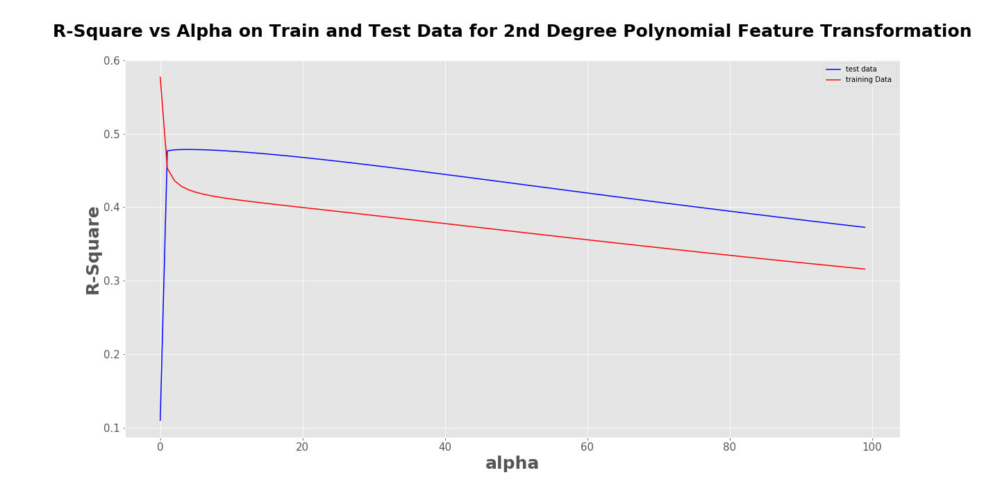

In [66]:
IM.open('RidgeRegAlpha.png')

**REGRESSION RESULTS**

We don't know which functions approximate the relationship between each feature and population, but we know these features are correlated with the population by an average of Pearson Coefficient of ~0.47 so we'll choose SLR for simplicity and for comparison with MLR and linear regression with polynomial features. The other models tested will be MLR, MLR with Ridge Regression, 2nd degree polynomial features linear regression (LRPF2) and 2nd degree polynomial features linear regression tuned with Ridge Regression (LRPF2 with Ridge Regression). 

The models will be evaluated for in-sample accuracy and out-of-sample accuracy using R-Square and MSE. In-sample accuracy will be determined by training on the full dataset and prediction on the full dataset. Out-of-sample R-Square will be determined by averaging the R-Square from 4-fold cross-validation. Out-of-sample MSE will be determined by generating a cross-validated prediction vector and measuring the mean-square error between this and the vector of true values.

In [67]:
Rige = Ridge(alpha=5) 
Rige.fit(Z, Y)
Rige2 = Ridge(alpha = 13)
Rige2.fit(Z_pr2, Y)
Yrige = Rige.predict(Z)
Yrige2 = Rige2.predict(Z_pr2)
r_squared = r2_score(Y, p(x))
msepoly = mean_squared_error(Y, p(x))
ukpolyreg2 = LinearRegression()
ukpolyreg2.fit(Z_pr2, Y)
ypolyreg2 = ukpolyreg2.predict(Z_pr2)
ycrosspolyreg2 = cross_val_predict(ukpolyreg2, Z_pr2, Y, cv=4)
Rcrossmulti = cross_val_score(ukmultipleregression, Z, Y, cv=4)
yhatcrossmulti = cross_val_predict(ukmultipleregression,Z, Y,cv=4)
Ycrossrige = cross_val_predict(Rige, Z, Y, cv = 4)
Ycrossrige2 = cross_val_predict(Rige2, Z_pr2,Y, cv=4)
msetheatre = mean_squared_error(Y, yhatcrosstheatre)
msetheatre_in = mean_squared_error(Y, yhattheatre)
msepubs = mean_squared_error(Y, yhatcrosspubs)
msepubs_in = mean_squared_error(Y, yhatpubs)
mserestaurant = mean_squared_error(Y, yhatcrossrestaurant)
mserestaurant_in = mean_squared_error(Y, yhatrestaurant)
msecoffee = mean_squared_error(Y, yhatcrosscoffee)
msecoffee_in = mean_squared_error(Y, yhatcoffee)
msemovies = mean_squared_error(Y, yhatcrossmovies)
msemovies_in = mean_squared_error(Y, yhatmovies)
mse_multi = mean_squared_error(Y, yhatcrossmulti)  
mse_multi_in = mean_squared_error(Y, Ymulthat)   
mse_polyfeatures2 = mean_squared_error(Y, ycrosspolyreg2) 
mse_polyfeatures_in2 = mean_squared_error(Y, ypolyreg2)
mse_ridge = mean_squared_error(Y, Ycrossrige)
mse_ridge2 = mean_squared_error(Y, Ycrossrige2)
mse_ridge_in = mean_squared_error(Y, Yrige)
mse_ridge_in2 = mean_squared_error(Y, Yrige2)
Model = ('Simple Regression ({})'.format(regcol[0]), 'Simple Regression ({})'.format(regcol[1]), 'Simple Regression ({})'.format(regcol[2]), 'Simple Regression ({})'.format(regcol[3]), 'Simple Regression ({})'.format(regcol[7]), 'Polynomial Features Degree 2', 'Multiple Linear Regression with Ridge Regression', 'Polynomial Features with Ridge Regression Degree 2','Multiple Linear Regression')
R_square_in = (round(theatre.score(regressionset[[regcol[0]]],Y), 5), round(pubby.score(regressionset[[regcol[1]]],Y), 5), round(restaurant.score(regressionset[[regcol[2]]],Y),5), round(coffee.score(regressionset[[regcol[3]]],Y),5), 
            round(movies.score(regressionset[[regcol[7]]],Y),5),
           round(ukpolyreg2.score(Z_pr2, Y),5), round(Rige.score(Z, Y),5), round(Rige2.score(Z_pr2, Y),5), round(ukmultipleregression.score(Z, Y),5))
R_square = (round(cross_val_score(theatre, regressionset[[regcol[0]]],Y, cv=4).mean(), 5), round(cross_val_score(pubby, regressionset[[regcol[1]]],Y, cv=4).mean(), 5), round(cross_val_score(restaurant, regressionset[[regcol[2]]],Y, cv=4).mean(),5), round(cross_val_score(coffee, regressionset[[regcol[3]]],Y, cv=4).mean(),5), 
            round(cross_val_score(movies, regressionset[[regcol[7]]],Y, cv=4).mean(),5),
           round(cross_val_score(ukpolyreg2, Z_pr2, Y, cv=4).mean(),5), round(cross_val_score(Rige, Z, Y, cv=4).mean(),5), round(cross_val_score(Rige2, Z_pr2, Y, cv=4).mean(),5), round(Rcrossmulti.mean(),5))
MSE = (round(msetheatre,5), round(msepubs,5), round(mserestaurant,5), round(msecoffee,5), round(msemovies,5), round(mse_polyfeatures2,5), round(mse_ridge,5),round(mse_ridge2,5), round(mse_multi,5))
MSE_in = (round(msetheatre_in,5), round(msepubs_in,5), round(mserestaurant_in,5), round(msecoffee_in,5), round(msemovies_in,5), round(mse_polyfeatures_in2,5), round(mse_ridge_in,5), round(mse_ridge_in2,5), round(mse_multi_in,5))
Intercept = (round(theatre.intercept_, 5), round(pubby.intercept_,5), round(restaurant.intercept_,5), round(coffee.intercept_,5), 
             round(movies.intercept_,5),  round(ukpolyreg2.intercept_,5), round(Rige.intercept_,5),round(Rige2.intercept_,5), round(ukmultipleregression.intercept_,5))
Coefficient = (np.around(theatre.coef_,5), np.around(pubby.coef_,5), np.around(restaurant.coef_,5), 
                        np.around(coffee.coef_,5), np.around(movies.coef_,5), 
                         np.around(ukpolyreg2.coef_,5), np.around(Rige.coef_,5), np.around(Rige2.coef_,5), np.around(ukmultipleregression.coef_,5))

In [68]:
evaluation = pd.DataFrame()
for i in np.arange(0,len(MSE)):
    rsquare_in, rsquare, Mse_in, Mse, model = R_square_in[i].astype(str), R_square[i].astype(str), MSE_in[i].astype(str), MSE[i].astype(str), Model[i]
    evaluation.loc[i, 'R-Square (In Sample)'] = rsquare_in
    evaluation.loc[i, 'R-Square (Out of Sample - 4-fold X-validation)'] = rsquare
    evaluation.loc[i, 'Mean Square Error (In Sample)'] = Mse_in
    evaluation.loc[i, 'Mean Square Error (Out of Sample - 4-fold X-validation)'] = Mse
    evaluation.loc[i, 'Model'] = model
for j in np.arange(0,len(Intercept)):
    intercept = Intercept[j].astype(str)
    coefficient = Coefficient[j].astype(str)
    evaluation.loc[j, 'Intercept'] = intercept
    evaluation.loc[j, 'Coefficient'] = coefficient
evaluation.loc[0, 'Coefficient'] = np.around(theatre.coef_,5).astype(str)
evaluation = evaluation.sort_values(by = ['R-Square (Out of Sample - 4-fold X-validation)'], ascending = False)
evaluation = evaluation.set_index('Model')
evaluation

,R-Square (In Sample),R-Square (Out of Sample - 4-fold X-validation),Mean Square Error (In Sample),Mean Square Error (Out of Sample - 4-fold X-validation),Intercept,Coefficient
Model,,,,,,
Polynomial Features with Ridge Regression Degree 2,0.43152,0.39761,0.00854,0.00885,0.04076,"[0.0, 0.0439, 0.01589, 0.02316, 0.0174, 0.0187..."
Multiple Linear Regression with Ridge Regression,0.41466,0.37995,0.00879,0.00907,0.00447,"[0.10353, 0.04992, 0.05832, 0.05011, 0.05374, ..."
Multiple Linear Regression,0.41817,0.36801,0.00874,0.00912,-0.00736,"[0.10974, 0.03688, 0.07237, 0.06393, 0.05559, ..."
Simple Regression (Theater),0.25489,0.23509,0.01119,0.0113,0.06089,[0.24744]
Simple Regression (Restaurant),0.2205,0.18824,0.0117,0.01184,0.04171,[0.40753]
Simple Regression (Pub),0.234,0.18586,0.0115,0.0118,0.04939,[0.36423]
Simple Regression (Coffee Shop),0.19487,0.17188,0.01209,0.01224,0.05028,[0.42058]
Simple Regression (Movie Theater),0.15202,0.11808,0.01273,0.01291,0.08223,[0.25947]
Polynomial Features Degree 2,0.53126,-0.02558,0.00704,0.01563,0.00131,"[0.0, 0.05024, -0.08799, 0.22587, 0.31733, 0.1..."


We can use distribution plots to see how the distribution of predictions from the various regression models, matches the true population distribution. 

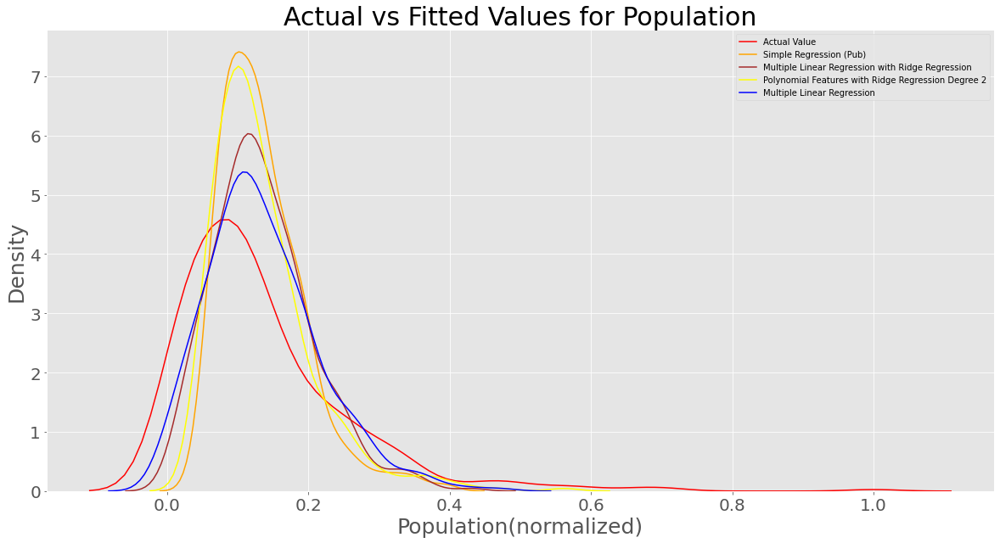

In [69]:
colors_dist = ['red','purple', 'orange', 'black', 'lime', 'gold', 'magenta', 'brown', 'yellow', 'blue', 'green']
plt.figure(figsize=(20, 10))
ax1 = sns.distplot(Y, hist=False, color=colors_dist[0], label="Actual Value")
#sns.distplot(yhatcrosstheatre, hist=False, color = colors_dist[1], label=Model[0] , ax=ax1) #uncomment each of the commented lines to see distribution piots for other models
sns.distplot(yhatcrosspubs, hist=False, color = colors_dist[2], label=Model[1] , ax=ax1)
#sns.distplot(yhatcrossrestaurant, hist=False, color = colors_dist[3], label=Model[2] , ax=ax1)
#sns.distplot(yhatcoffee, hist=False, color = colors_dist[4], label=Model[3] , ax=ax1)
#sns.distplot(yhatmovies, hist=False, color=colors_dist[5], label=Model[4] , ax=ax1)
#sns.distplot(ycrosspolyreg2, hist=False, color = colors_dist[6], label=Model[5] , ax=ax1)
sns.distplot(Ycrossrige, hist=False, color = colors_dist[7], label=Model[6] , ax=ax1)
sns.distplot(Ycrossrige2, hist=False, color = colors_dist[8], label=Model[7] , ax=ax1)
sns.distplot(yhatcrossmulti, hist=False, color = colors_dist[9], label=Model[8] , ax=ax1)
plt.title('Actual vs Fitted Values for Population', size = 30)
plt.xlabel('Population(normalized)', size = 25)
plt.ylabel('Density', size = 25)
plt.xticks(size = 20)
plt.yticks(size = 20)
plt.show()
plt.close()

The best model is the **2nd Degree Polynomial Features with Ridge Regression** linear model. It has the highest out-of-sample R^2 and second-highest in-sample R^2. The 2nd Degree Polynomial Features linear regression model without Ridge Regression is actually the worst for out-of-sample prediction. Its R^2 is negative, which means its overfit. It has the highest in-sample R^2 but as shown previously, a 1st Degree Polynomial Feature transformation without Ridge Regression, which is equivalent to the Multiple Linear Regression model is better for out-of-sample accuracy. 

On the other hand, for the Linear Regression Model tuned with Ridge Regression the out-of-sample R^2 peaks for 2nd-order Polynomial Transformation of the features. This is why the 2nd Degree Polynomial Features with Ridge Regression model has the best out-of-sample fit.

In [ ]:
Rsqupoly = []
order = np.arange(0, 5)
for n in order:
    pr = PolynomialFeatures(degree=n)
    Z_pr = pr.fit_transform(Z)
    parameters_feat= [{'alpha': [0.001,0.1,1, 10, 100]}]
    R_feat=Ridge()
    Grid_feat = GridSearchCV(R_feat, parameters_feat,cv=3)
    Grid_feat.fit(Z_pr, Y)
    Rsqupoly.append(cross_val_score(Grid_feat.best_estimator_, Z_pr, Y, cv=3).mean())

In [ ]:
plt.figure(figsize = (25,15))
plt.plot(order, Rsqupoly)
plt.autoscale()
plt.xlabel('Order', size = 20, fontweight = 'bold')
plt.xticks(size =15)
plt.yticks(size = 15)
plt.ylabel('R^2', size = 20, fontweight = 'bold')
plt.ylim(-0.1,0.5, 10)
plt.title('Mean 3-fold Cross-Validation R^2 of Ridge Regression tuned Linear Regression with Polynomial Features model for different orders of transformation', size = 20, fontweight = 'bold')
plt.savefig('PolynomialFeatures_RR.png')

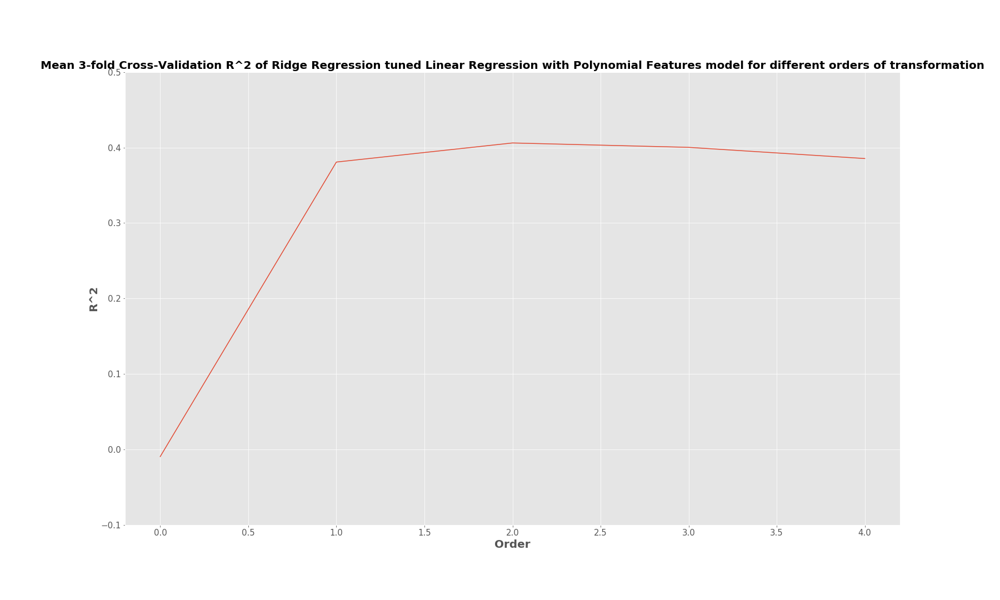

In [70]:
IM.open('PolynomialFeatures_RR.png')

Ridge Regression isnt needed for the simple linear regression models as tuning the singular coefficient for out-of-sample accuracy makes neglible improvement and change to the value of the coefficient.

Take for example, **Pub**

In [71]:
Feature  = regressionset[[regcol[1]]]   #Select any feature by changing 0 to the index of the feature set corresponding to the feature  
parameters3= [{'alpha': [0.001,0.1,1, 10, 100, 1000, 10000, 100000, 100000]}]
singleridge=Ridge()
Gridsingle = GridSearchCV(singleridge, parameters3,cv=3)
Gridsingle.fit(Feature, Y)
BestsingleRR=Gridsingle.best_estimator_
print(cross_val_score(BestsingleRR, Feature, Y, cv=4).mean(),5)
print(BestsingleRR)

0.19278866889539475 5
Ridge(alpha=1, copy_X=True, fit_intercept=True, max_iter=None,
   normalize=False, random_state=None, solver='auto', tol=0.001)


In [72]:
featureRige = Ridge(alpha=1)  #select the best alpha shown in the grid search
featureRige.fit(Feature, Y)
featureYrige = featureRige.predict(Feature)
featureYcrossrige = cross_val_predict(featureRige, Feature, Y, cv = 4)
featuremse_ridge_in = mean_squared_error(Y, featureYrige)
featuremse_ridge = mean_squared_error(Y, featureYcrossrige)

In [73]:
pubridge = pd.DataFrame()
pubridge.loc['Pub', 'In-Sample R-Square'] = round(featureRige.score(X, Y),5)
pubridge.loc['Pub', 'Out-of-Sample R-Square'] =round(cross_val_score(featureRige, Feature, Y, cv=4).mean(),5)
pubridge.loc['Pub', 'In-Sample MSE'] = featuremse_ridge_in
pubridge.loc['Pub', 'Out-of-Sample MSE'] = featuremse_ridge
pubridge.loc['Pub', 'Intercept'] = round(featureRige.intercept_,5) 
pubridge.loc['Pub', 'Coefficient'] = featureRige.coef_[0].round(5)
pubridge

,In-Sample R-Square,Out-of-Sample R-Square,In-Sample MSE,Out-of-Sample MSE,Intercept,Coefficient
Pub,0.23243,0.19279,0.011524,0.011808,0.05637,0.33444


Ridge Regression also makes no significant improvement to the multiple linear regression model. The 2nd Degree Polynomial Features with Ridge Regression and the Multiple Linear Regression with Ridge Regression models are only marginally better than the Multiple Linear Regression model. As the 2nd Degree Polynomial Features with Ridge Regression model is very complex, with 66 features, the multiple linear regression model is favoured. The multiple linear regression without ridge regression model most closely matches the true population distribution so this is would be the preferred model.

In [74]:
print('The Multiple Linear Regression model tuned with Ridge Regression is  {}X1 + {}X2 + {}X3 + {}X4 + {}X5 + {}X6 + {}X7 + {}X8 + {}X9 + {}X10  {}'.format(ukmultipleregression.coef_[0].round(3), 
        ukmultipleregression.coef_[1].round(3), ukmultipleregression.coef_[2].round(3),ukmultipleregression.coef_[3].round(3), ukmultipleregression.coef_[4].round(3), ukmultipleregression.coef_[5].round(3),ukmultipleregression.coef_[6].round(3), ukmultipleregression.coef_[7].round(3), ukmultipleregression.coef_[8].round(3), ukmultipleregression.coef_[9].round(3), ukmultipleregression.intercept_.round(3)))

The Multiple Linear Regression model tuned with Ridge Regression is  0.11X1 + 0.037X2 + 0.072X3 + 0.064X4 + 0.056X5 + 0.084X6 + 0.041X7 + 0.083X8 + 0.083X9 + 0.032X10  -0.007


We can compare the predictions of each of the models, versus the true population. The predictions and actual values were *inverse normalized*, by multiplying each value by the maximum value of population (1105310) so it makes more sense.  **The average error of prediction is quite high.**  Additionally for the functions which contain negative coefficients, there are a few (~1%) spurious negative population predictions. **Less than 50% (R-square < 0.5) of the variation in population can be described by any of the linear regression functions of venue categories.**  The mean squared error for the models is ~0.01, which corresponds to a mean error ~0.1 which is >50% of the average population of a town in the UK. The normalized average population is 0.134 (average town: 148947 / maximum town: 1105310). This means that although most of the selected features have some correlation to the population, the relationship may not be linear or perhaps more correlated features would need to be incorporated into the feature set, to increase the accuracy of prediction. 

In [75]:
All_yhat = (yhatcrosstheatre*max(ukdataset['Population']), yhatcrosspubs*max(ukdataset['Population']), yhatcrossrestaurant*max(ukdataset['Population']), yhatcrosscoffee*max(ukdataset['Population']), 
            yhatcrossmovies*max(ukdataset['Population']), ycrosspolyreg2*max(ukdataset['Population']), Ycrossrige*max(ukdataset['Population']), 
            Ycrossrige2*max(ukdataset['Population']), yhatcrossmulti*max(ukdataset['Population'])) #multiplying by the max population to remove the normalization
predictiondata = pd.DataFrame()
predictiondata['Actual Population'] = Y.values*max(ukdataset['Population'])
for i in np.arange(0, len(Model)):
    predictiondata['Prediction:{}'.format(Model[i])] = All_yhat[i].round(0)
predictiondata.index = Y.index
mask = np.random.rand(len(predictiondata)) < 0.02 #masking so that each time this cell is run, a random selection of towns is displayed
predictiondata[mask]

,Actual Population,Prediction:Simple Regression (Theater),Prediction:Simple Regression (Pub),Prediction:Simple Regression (Restaurant),Prediction:Simple Regression (Coffee Shop),Prediction:Simple Regression (Movie Theater),Prediction:Polynomial Features Degree 2,Prediction:Multiple Linear Regression with Ridge Regression,Prediction:Polynomial Features with Ridge Regression Degree 2,Prediction:Multiple Linear Regression
Town/Area,,,,,,,,,,
Omagh,54264.0,66428.0,63322.0,58926.0,57304.0,92576.0,6524.0,6612.0,48645.0,-12208.0
Orkney Islands,21278.0,66428.0,69319.0,53105.0,68350.0,142670.0,30920.0,33787.0,59685.0,18235.0
South Lakeland,90543.0,146577.0,225443.0,193126.0,197482.0,139344.0,188601.0,194985.0,173259.0,202888.0
Southwark,175385.0,311049.0,92890.0,65689.0,93028.0,139344.0,215443.0,182992.0,181326.0,187821.0


### **Clustering**

Clustering will be used to detect towns which have shared venue characteristics. It will be performed using the venue category density data (Dataset II). As there is no ground truth way of grouping towns machine learning algorithms, clustering can detect similarities between towns based on venue category density and group the most similar towns. Additionally, if geolocation is incorporated we can observe, whether there is any geographical segmentation of clusters of similar towns. Two clustering algorithms will be used, K-Means and DBSCAN.

**Silhouette Score**

To evaluate how well defined the clusters are we can use the Silhouette Score which does not require any ground truth cluster labels. It measures the relationship between intra-cluster homogeneity and intercluster dissimilarity. The number ranges from -1, which means points are assigned to the wrong cluster, to 1, which means the clusters are homogenous and well-separated. Values near 0, signify that the clusters overlap


In [76]:
 #clusterset= ukdataset[ukdataset.columns[:363]]  #if K-means has already been run uncomment #creating cluste
#clusterset.drop(columns = 'K-Means Cluster Labels', inplace = True) #if K-means has already been run uncomment
clusterset = ukdataset[ukdataset.columns[:362]] #if K-means has not been run it should be uncommented
clusterset.drop(columns = ['Latitude', 'Longitude', 'Easting', 'Northing', 'Postcodes', 'Active postcodes', 'Population', 'Households', 'Households(normalized)', 'Town/Area'], inplace = True)
lat_stand, long_stand = StandardScaler().fit_transform(ukdataset[['Latitude']]), StandardScaler().fit_transform(ukdataset[['Longitude']])
print('Clustering Feature Matrix')
clusterset.head(10)

Clustering Feature Matrix


,Accessories Store,Airport,Airport Lounge,Airport Service,Airport Terminal,Amphitheater,Antique Shop,Apres Ski Bar,Aquarium,Arcade,...,Windmill,Wine Bar,Wine Shop,Winery,Wings Joint,Women's Store,Yoga Studio,Zoo,Zoo Exhibit,Population (normalized)
Town/Area,,,,,,,,,,,,,,,,,,,,,
Aberdeen,0,0,0.120482,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0.222007
Aberdeenshire,0,0,0.13986,0,0,0,0,0,0.328671,0,...,0,0,0,0,0,0,0,0,0,0.202639
Adur,0,0,0,0,0,0,0,0,0,0,...,0,0.533981,0,0,0,0,0,0,0,0.029529
Allerdale,0,0,0,0,0,0,0,0,0.606452,0,...,0,0,0,0,0,0,0,0.154839,0,0.088715
Amber Valley,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0.119120
Anglesey,0,0,0,0,0,0,0,0,0.447619,0,...,0,0,0,0,0,0,0,0.114286,0,0.063105
Angus,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0.153846,0,0.093339
Antrim,0,0,0.2,1,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0.036635
Archiestown,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0.000000


**Distance Matrix**

Distance between samples and locations in feature space can be calculated with Euclidian distance. Many algorithms rely on computing the euclidian distance using a distance matrix. Here is the distance matrix for Dataset II. All the distances used in this project are Euclidian distance. 

In [77]:
feature_mtx = clusterset.values
dist_matrix = distance_matrix(feature_mtx,feature_mtx) 
print(dist_matrix)  #distance matrix

[[0.         1.49017193 3.26750817 ... 3.43913168 2.49203705 2.66160842]
 [1.49017193 0.         3.42766105 ... 3.55304685 2.61369954 2.75807606]
 [3.26750817 3.42766105 0.         ... 4.0321057  3.24756592 3.37363207]
 ...
 [3.43913168 3.55304685 4.0321057  ... 0.         3.36286146 3.49564961]
 [2.49203705 2.61369954 3.24756592 ... 3.36286146 0.         2.61523605]
 [2.66160842 2.75807606 3.37363207 ... 3.49564961 2.61523605 0.        ]]


**Principal Component Analysis**

Principal Component Analysis (PCA) is used to transform the multi-dimension feature matrix, into a smaller matrix containing just the principal components, i.e, **decorrelated features, which are functions of the original features, maximize the variance, and preserve the statistical information of the original feature matrix**. PCA is useful for visualizing the results of clustering and in some instances, the principal components can correspond almost exclusively to particular features. You can decide how many principal components you want to transform the dataset into. We will select 3 components, as 3D is the maximum dimension for visualizing the clusters

In [78]:
pca = PCA(n_components=3)
pca.fit(clusterset)

PCA(copy=True, iterated_power='auto', n_components=3, random_state=None,
  svd_solver='auto', tol=0.0, whiten=False)

**Feature Agglomeration**

Feature agglomeration transforms the feature matrix into a smaller dimensional feature matrix, retaining statistical information, which consists of merged features of the original feature matrix and/or features which contain most of the statistical information. To boost the performance of the clustering model, the feature matrix will be reduced by Feature Agglomeration to create a feature matrix which optimizes the results.

**K-Means**

K-Means, clusters towns based on the similarity of their features. A value of K, is specified, which determines the number of clusters that you want the algorithm to create. The algorithm iteratively places samples in the nearest of the K-centroids to it based on euclidian distance. Multiple iterations and initial states are run to reach the global optimum configuration of clusters.

**Tuning** 

The optimum parameters for K-Means will be determined by plotting a range of Silhouette Scores for different parameters of the model and number of features, and selecting the most-well defined clusters that make intuitive sense and describe the variation of the towns. Below is the code for tabulating Silhouette Scores.

In [ ]:
from sklearn import datasets, cluster 
Silhouette_ScoreFeatureAgg = []
KClusters = []
FeatureAgg = []
Algorithm = []
Initial = []
for i in np.arange(2,15):  # Number of clusters ranging from 2 to 14
    for k,l in enumerate(np.arange(3, 20)): #20 #number of features ranging from 3 to 19
        for n,m in enumerate(np.arange(1,15)): #10 #number of initial states ranging from 1 to 14
            for o,p in enumerate(['elkan', 'auto']):
                agglo = cluster.FeatureAgglomeration(n_clusters=l)
                agglo.fit(clusterset)
                Xreduc = agglo.transform(clusterset)
                kmeansfeatureagg = KMeans(init = "k-means++", n_clusters=i, n_init = m, precompute_distances=True, algorithm=p).fit(Xreduc) 
                sil_scorefeat = metrics.silhouette_score(Xreduc, kmeansfeatureagg.labels_, metric='euclidean')
                Silhouette_ScoreFeatureAgg.append(sil_scorefeat)
                KClusters.append(i)
                FeatureAgg.append(l)
                Initial.append(m)
                Algorithm.append(p)

In [ ]:
Silhouette_ScoreFeatureAgg = pd.DataFrame(Silhouette_ScoreFeatureAgg)
Silhouette_ScoreFeatureAgg['KCluster'] = KClusters
Silhouette_ScoreFeatureAgg['FeatureAgg'] = FeatureAgg
Silhouette_ScoreFeatureAgg['Algorithm'] = Algorithm
Silhouette_ScoreFeatureAgg['Initial'] = Initial
Silhouette_ScoreFeatureAgg.rename(columns = {0:'Silhouette Score'}, inplace = True)
Silhouette_ScoreFeatureAgg.to_csv('K-Means_Silhouette.csv') #save to spreadsheet

In [79]:
Kmeans_silhouette = pd.read_csv('K-Means_Silhouette.csv') #
Kmeans_silhouette.drop(columns = 'Unnamed: 0', inplace = True)
viewkmeans_silscore = Kmeans_silhouette.sort_values(by = 'Silhouette Score', ascending = False)
viewkmeans_silscore.head(10)

,Silhouette Score,KCluster,FeatureAgg,Algorithm,Initial
55,0.758705,2,4,auto,14
42,0.758705,2,4,elkan,8
30,0.758705,2,4,elkan,2
31,0.758705,2,4,auto,2
32,0.758705,2,4,elkan,3
33,0.758705,2,4,auto,3
34,0.758705,2,4,elkan,4
35,0.758705,2,4,auto,4
36,0.758705,2,4,elkan,5
37,0.758705,2,4,auto,5


We select one of the highest scoring models where the number of initializations is greater than 5 in order to reach the global optimum, the Silhouette Score is greater than 0.2, the number of clusters is greater than 3, and more than 5 features are used. 

In [80]:
Kmeans_silhouette[Kmeans_silhouette['Silhouette Score'] > 0.2][Kmeans_silhouette['KCluster'] >3][Kmeans_silhouette['FeatureAgg'] > 5][Kmeans_silhouette['Initial'] > 5].sort_values(by = 'Silhouette Score', ascending = False).head(20)

,Silhouette Score,KCluster,FeatureAgg,Algorithm,Initial
1522,0.312836,5,6,elkan,6
1528,0.312836,5,6,elkan,9
1534,0.312836,5,6,elkan,12
1523,0.312374,5,6,auto,6
1532,0.312374,5,6,elkan,11
1538,0.312374,5,6,elkan,14
1537,0.312374,5,6,auto,13
1536,0.312374,5,6,elkan,13
1533,0.312374,5,6,auto,11
1539,0.312374,5,6,auto,14


The Silhouette score gradually decreases with increasing number of clusters, but varies for each number of clusters depending on the other parameters

Text(0.5, 0, 'Number of Clusters')

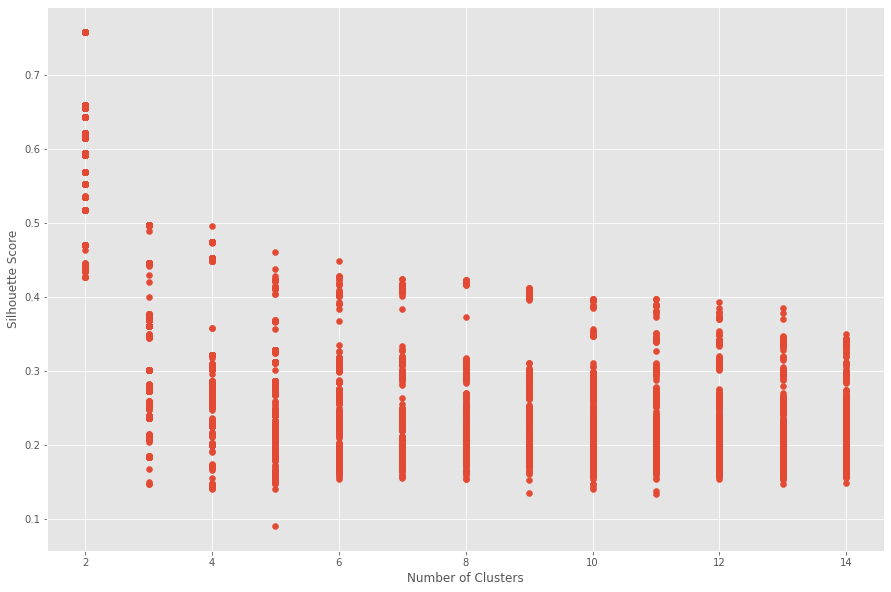

In [81]:
plt.figure (figsize = (15, 10))
plt.scatter(Kmeans_silhouette['KCluster'], Kmeans_silhouette['Silhouette Score']) 
plt.ylabel('Silhouette Score')
plt.xlabel('Number of Clusters')

It also decreases with increasing number of Features. We want to include the most important features in the general makeup of UK towns, the ones which are most prevalent in the dataset, and use more than just a couple of features, so greater than 5 is a good number of features. 

Text(0.5, 0, 'Number of Features')

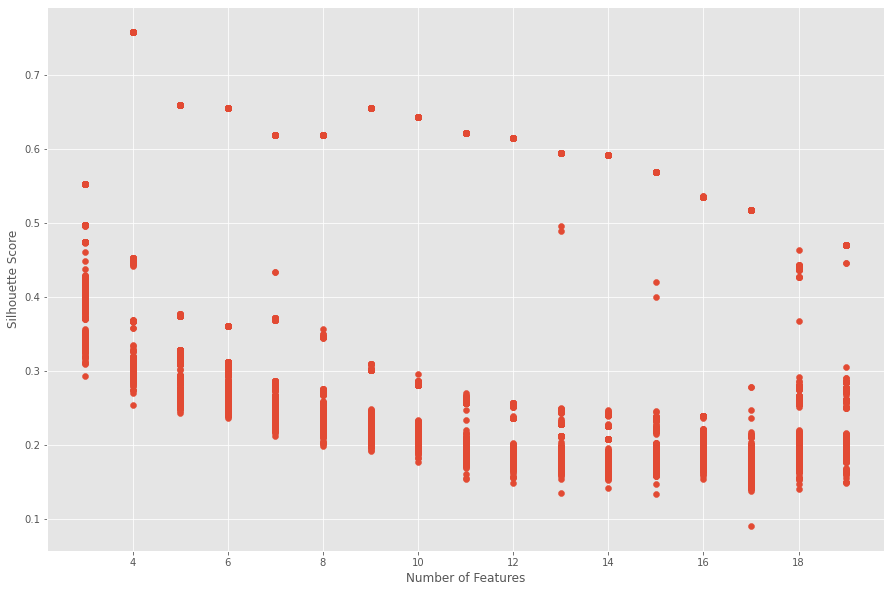

In [82]:
plt.figure (figsize = (15, 10))
plt.scatter(Kmeans_silhouette['FeatureAgg'], Kmeans_silhouette['Silhouette Score']) 
plt.ylabel('Silhouette Score')
plt.xlabel('Number of Features')

**Execute K-Means** 

We'll select the model where the number of features is 6, number of clusters is 5, number of initializations is 6 and has a Silhouette Score of ~0.312(+/-0.001 depending on initial state)

In [83]:
from sklearn import datasets, cluster
num_features = 6
agglokmeans = cluster.FeatureAgglomeration(num_features)
agglokmeans.fit(clusterset)
kclusters = 5
X_reduced = agglokmeans.transform(clusterset)
ukkmeans = KMeans(init = "k-means++", n_clusters=kclusters, n_init = 6, precompute_distances=True, algorithm='elkan').fit(X_reduced)  

In [84]:
print('Selected K-Means Cluster Model has a', num_features,'-feature, feature set, with', kclusters, 'clusters using the Elkan algorithm with a Silhouette Score of',  metrics.silhouette_score(X_reduced, ukkmeans.labels_, metric='euclidean').round(3))

Selected K-Means Cluster Model has a 6 -feature, feature set, with 5 clusters using the Elkan algorithm with a Silhouette Score of 0.312


This is the reduced feature set

In [85]:
pd.DataFrame(X_reduced[0:5] ) #Reduced Feature Set

,0,1,2,3,4,5
0,0.110216,0.027623,0.018812,0.063261,0.178041,0.411164
1,0.112639,0.021064,0.026427,0.062032,0.077653,0.372119
2,0.110532,0.136751,0.007802,0.061423,0.262393,0.602541
3,0.106869,0.000000,0.024444,0.026117,0.059247,0.413212
4,0.087657,0.004532,0.023447,0.104786,0.334772,0.562963


We can compare it with the original feature set

In [86]:
clusterset.head()

,Accessories Store,Airport,Airport Lounge,Airport Service,Airport Terminal,Amphitheater,Antique Shop,Apres Ski Bar,Aquarium,Arcade,...,Windmill,Wine Bar,Wine Shop,Winery,Wings Joint,Women's Store,Yoga Studio,Zoo,Zoo Exhibit,Population (normalized)
Town/Area,,,,,,,,,,,,,,,,,,,,,
Aberdeen,0,0,0.120482,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0.222007
Aberdeenshire,0,0,0.13986,0,0,0,0,0,0.328671,0,...,0,0,0,0,0,0,0,0,0,0.202639
Adur,0,0,0,0,0,0,0,0,0,0,...,0,0.533981,0,0,0,0,0,0,0,0.029529
Allerdale,0,0,0,0,0,0,0,0,0.606452,0,...,0,0,0,0,0,0,0,0.154839,0,0.088715
Amber Valley,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0.119120


It removed 'useless' features, such as features which are null for most towns. Let's see how it compares to a feature set including 15 of the top features

In [87]:
clusterset[['Italian Restaurant', 'Grocery Store', 'Gastropub', 'Pub', 'Supermarket', 'Hotel', 'Park', 'Coffee Shop', 'Restaurant', 'Scenic Lookout', 'Tea Room', 'Theater', 'Indian Restaurant', 'Movie Theater', 'History Museum']].head(5)

,Italian Restaurant,Grocery Store,Gastropub,Pub,Supermarket,Hotel,Park,Coffee Shop,Restaurant,Scenic Lookout,Tea Room,Theater,Indian Restaurant,Movie Theater,History Museum
Town/Area,,,,,,,,,,,,,,,
Aberdeen,0.176205,0.286145,0.0502008,0.35819,0.421687,0.27883,0.112737,0.399398,0.475904,0.133391,0.150602,0.216867,0.258176,0,0.114458
Aberdeenshire,0.102273,0.41521,0.0291375,0.27405,0.332168,0.368631,0.0785215,0.427972,0.414336,0.0774226,0.174825,0.188811,0.0999001,0,0.0664336
Adur,0.283981,0.0461165,0.161812,0.341118,0.145631,0.0249653,0.218031,0.891262,0.575243,0.429958,0,0.174757,0.277393,0.368932,0.184466
Allerdale,0.18871,0.214516,0.107527,0.523104,0.387097,0.381567,0.0482949,0.493548,0.222984,0.285714,0.16129,0.116129,0,0.122581,0
Amber Valley,0.159836,0.0778689,0.182149,0.841825,0.10929,0.028103,0.265886,0.334426,0.512637,0,0,0.196721,0.546448,0.311475,0


The features have been transformed but likely contain most of the statistical information of the most relevant features, and less of the information of useless features. 

Now we insert the cluster labels generated in the K-Means Model for each town into DataFrame II . **Every time the K-Means algorithm with the selected parameters is run it converges to the same result (within 0.001 Silhouette Coefficient as the number of intiializations selected leads to convergence to global optimum), but the labels used to identify the clusters are interchangeable**

In [88]:
#ukdataset.drop(columns = 'K-Means Cluster Labels', inplace = True) #Uncomment if K-means is run again
ukdataset.insert(0, 'K-Means Cluster Labels', ukkmeans.labels_) #insert cluster labels 
ukdataset['K-Means Cluster Labels'].fillna(20 , inplace = True)
ukdataset['K-Means Cluster Labels'] = ukdataset['K-Means Cluster Labels'].astype(int)
uklat, uklong = uk['Latitude'].mean(), uk['Longitude'].mean()
ukdataset['Class'] =  'Class' + '' + ukdataset['K-Means Cluster Labels'].astype(str) #create a column called 'Class', used to group by K-Means Cluster
#ukdataset.to_csv('K-Means_ClusteredData.csv') save K-Means clustered data 
ukdataset.head()

,K-Means Cluster Labels,Latitude,Longitude,Easting,Northing,Postcodes,Active postcodes,Population,Households,Town/Area,...,Winery,Wings Joint,Women's Store,Yoga Studio,Zoo,Zoo Exhibit,Population (normalized),Households(normalized),Pop-binned,Class
Town/Area,,,,,,,,,,,,,,,,,,,,,
Aberdeen,0,57.181716,-2.192122,388492.263158,810126.210526,1235.842105,360.789474,245387.0,112158.0,Aberdeen,...,0,0,0,0,0,0,0.222007,0.264462,Bin2(184218-368436),Class0
Aberdeenshire,0,57.298876,-2.503469,369716.588235,823302.470588,779.705882,524.411765,223979.0,93341.0,Aberdeenshire,...,0,0,0,0,0,0,0.202639,0.220092,Bin2(184218-368436),Class0
Adur,3,50.836050,-0.250062,523320.500000,105516.500000,527.500000,369.500000,32639.0,14269.0,Adur,...,0,0,0,0,0,0,0.029529,0.033645,Bin1(0-184218),Class3
Allerdale,0,54.677167,-3.387577,310623.166667,532240.333333,802.166667,687.833333,98058.0,43111.0,Allerdale,...,0,0,0,0,0.154839,0,0.088715,0.101653,Bin1(0-184218),Class0
Amber Valley,1,53.047400,-1.407023,439849.000000,350180.250000,1201.250000,726.000000,131664.0,56522.0,Amber Valley,...,0,0,0,0,0,0,0.119120,0.133275,Bin1(0-184218),Class1


The distance matrix shows that each town has been placed in the cluster closest to it by Euclidian distance

In [89]:
dmatrix = pd.DataFrame(distance_matrix(X_reduced, ukkmeans.cluster_centers_))
dmatrix.insert(kclusters, 'Cluster that town has been assigned to', ukkmeans.labels_)
dmatrix.index = ukdataset.index.astype(str) + '(Cluster' + dmatrix['Cluster that town has been assigned to'].astype(str) + ')'
dmatrix.T[dmatrix.T.columns[0:15]] #select first 20 samples for visualisation

,Aberdeen(Cluster0),Aberdeenshire(Cluster0),Adur(Cluster3),Allerdale(Cluster0),Amber Valley(Cluster1),Anglesey(Cluster0),Angus(Cluster3),Antrim(Cluster0),Archiestown(Cluster0),Ards(Cluster1),Argyll and Bute(Cluster0),Argyllshire(Cluster0),Armagh(Cluster0),Arun(Cluster3),Ashfield(Cluster1)
0,0.076157,0.048699,0.282429,0.070080,0.293629,0.023956,0.145342,0.077330,0.121191,0.269926,0.081067,0.096537,0.117565,0.294707,0.385435
1,0.216185,0.323508,0.172522,0.329060,0.075859,0.300449,0.256616,0.283642,0.389275,0.090850,0.299300,0.364149,0.391825,0.162968,0.118057
2,0.367726,0.360298,0.457654,0.410883,0.461881,0.390439,0.398983,0.410281,0.383577,0.473451,0.418087,0.410629,0.421440,0.478471,0.519782
3,0.141761,0.221684,0.130190,0.209656,0.135849,0.194962,0.105270,0.215917,0.266252,0.103290,0.170403,0.250521,0.267912,0.108126,0.274709
4,0.712138,0.687726,0.806903,0.733509,0.786015,0.725531,0.739487,0.754154,0.691425,0.808840,0.749665,0.725952,0.730203,0.808604,0.835552
Cluster that town has been assigned to,0.000000,0.000000,3.000000,0.000000,1.000000,0.000000,3.000000,0.000000,0.000000,1.000000,0.000000,0.000000,0.000000,3.000000,1.000000


**Now lets visualize the clusters in terms of their principal components**

In [90]:
clusterpca = pca.transform(clusterset)
clusterpca[:,0]
clusterpca = pd.DataFrame(clusterpca)
clusterpca['K-Means Cluster Labels'] = ukkmeans.labels_
clusterpca['Town/Region'] = ukdataset.index
clusterpca.head(10)
kpca = clusterpca.groupby('K-Means Cluster Labels').mean()
kpca

,0,1,2
K-Means Cluster Labels,,,
0,-0.285197,0.463534,0.175229
1,-0.162370,-0.357980,-0.213225
2,1.752720,-0.150437,0.210447
3,-0.155728,-0.073502,0.030060
4,2.957252,0.638142,-0.243518


In [91]:
kcenters = ukdataset.drop(columns = 'Town/Area').reset_index().drop(columns = 'Town/Area')
kcenters= kcenters[['Latitude', 'Longitude', 'K-Means Cluster Labels']].groupby('K-Means Cluster Labels').mean()

**In 2 dimensions: Principal components 1 and 2.**

Two of the clusters with PC1 > 1 clusters are dense and well separated but there is some overlap between the three clusters with PC1 < 1. These three clusters are more similar to each other in terms of the average magnitude of PC1 while the other two are dissimilar to all the other clusters in terms of both principal components. 

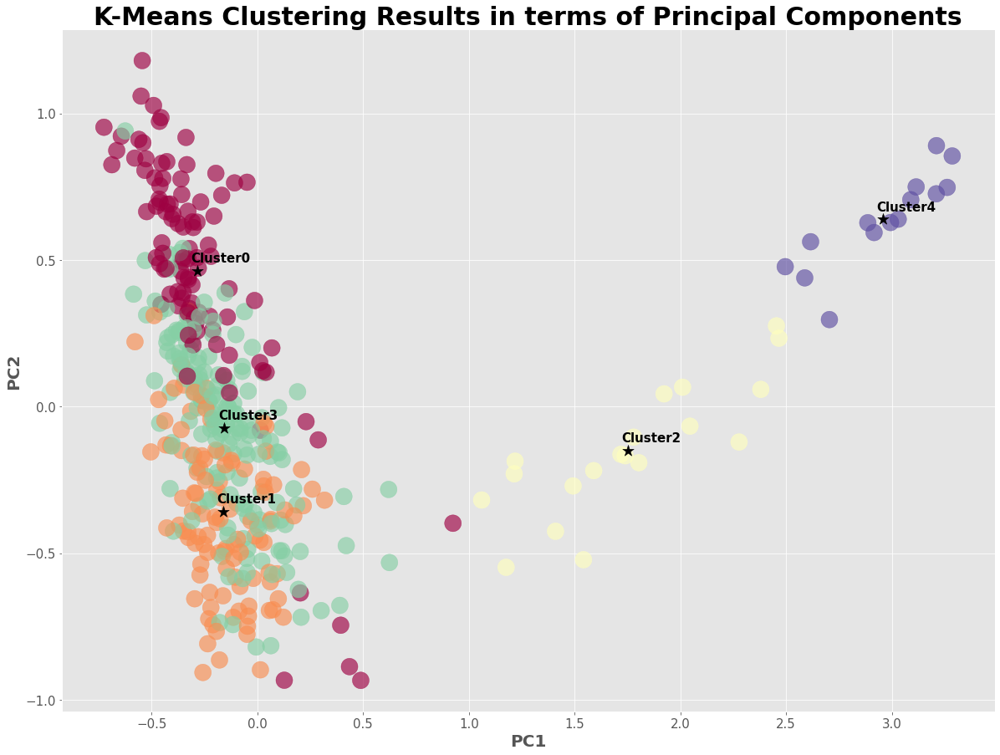

In [92]:
colorskmeans = plt.cm.Spectral(np.linspace(0, 1, len(set(ukkmeans.labels_))))
plt.figure(figsize = (20,15))
plt.title ("K-Means Clustering Results in terms of Principal Components", size = 30, fontweight = 'bold')
plt.xlabel('PC1', size = 20, fontweight = 'bold')
plt.ylabel('PC2', size = 20, fontweight = 'bold')
plt.xticks(size = 15)
plt.yticks(size = 15)
col = []
for i, j in enumerate(ukkmeans.labels_):
    color_Kmeans = colorskmeans[j]
    col.append(color_Kmeans)    
for i, j in enumerate(kpca.index):  
    label = j
    plt.annotate('Cluster' + str(label), xy = (np.array(kpca)[:,0][i]-0.03, np.array(kpca)[:,1][i]+ 0.03), color='black', size = 15, alpha = 1, fontweight = 'bold')
plt.scatter(np.array(clusterpca)[:, 0], np.array(clusterpca)[:, 1],s=400, c=col, marker=u'o', alpha=0.65)
plt.scatter(np.array(kpca)[:,0], np.array(kpca)[:,1], s=200, c='black', marker='*', alpha=1)

**In 3 dimensions: Principal components 1, 2, and 3.**

The same relationships can be seen in 3 dimensions but we can also see that three of the clusters have towns with high values of principal component 3. It is unclear what these principal components are but generally, clustering has produced well defined clusters. 

Text(0.5, 0, 'PC3')

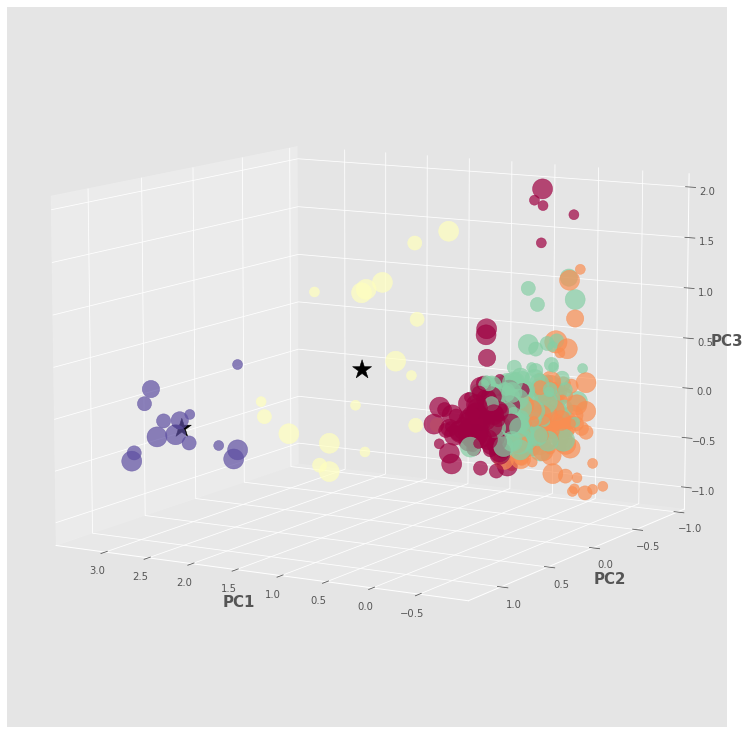

In [93]:
ukmeanscolors_array = plt.cm.Spectral(np.linspace(0, 1, len(set(ukkmeans.labels_))))
ukmeans = [colors2.rgb2hex(i) for i in ukmeanscolors_array]

ColorKMeans = []
for i, j in enumerate(ukkmeans.labels_):
    colorkmeans = ukmeans[j]
    ColorKMeans.append(colorkmeans)
fig = plt.figure(figsize = (16, 10))
from mpl_toolkits.mplot3d import Axes3D 
ax = Axes3D(fig, elev = 10, azim=120) 
ax.scatter(np.array(kpca)[:,0], np.array(kpca)[:,1], np.array(kpca)[:,2], s=400, c='black', marker='*', alpha=1)
ax.scatter(np.array(clusterpca)[:, 0], np.array(clusterpca)[:, 1], clusterpca.loc[:, 2], s=(clusterpca['K-Means Cluster Labels'].values + 1)*100  , marker =u'o',  c= ColorKMeans, alpha = 0.7)
ax.set_xlabel('PC1', fontsize = 15, fontweight = 'bold')
ax.set_ylabel('PC2', fontsize = 15, fontweight = 'bold')
ax.set_zlabel('PC3', fontsize = 15, fontweight = 'bold')

**Now lets visualize the towns color coded according to their clusters on a  map. The larger circles indicate the geographical cluster centers.**

In [94]:
ukmap_clusters = folium.Map(location=[uklat, uklong], zoom_start=7, tiles ='Stamen Toner')
clustercenters = ukdataset.groupby('Class').mean()
ukcolors_array = plt.cm.Spectral(np.linspace(0, 1, len(set(ukkmeans.labels_))))
ukrainbow = [colors2.rgb2hex(i) for i in ukcolors_array]
for lat, lon, poi, cluster, in zip(ukdataset['Latitude'], ukdataset['Longitude'], ukdataset.index, ukdataset['K-Means Cluster Labels']):
    label = folium.Popup(str(poi) + ' Cluster ' + str(cluster), parse_html=True)
    folium.CircleMarker(
        [lat, lon],
        radius=3,
        popup=label,
        color=ukrainbow[cluster], 
        fill=True,
        fill_color=ukrainbow[cluster], 
        fill_opacity=0.7).add_to(ukmap_clusters)
for clustercenter, clusterlat, clusterlong  in zip(clustercenters[clustercenters['Population']<190000]['K-Means Cluster Labels'], clustercenters[clustercenters['Population']<190000]['Latitude'], clustercenters[clustercenters['Population']<200000]['Longitude']):   
    label2 = folium.Popup('Cluster Center ' + str(clustercenter), parse_html=True)
    folium.CircleMarker(
    [clusterlat, clusterlong],
     radius=15,
     popup=label2,
     color=ukrainbow[clustercenter],
     fill=True,
     fill_color=ukrainbow[clustercenter], 
     fill_opacity=0.4).add_to(ukmap_clusters)
ukmap_clusters

For the most significant features in the dataset, these are the average values for the towns of each cluster. The values for the venue categories have been reverted back to **venue category density (number of venues in category/total number of venues in that town)** by inverse normalization and the normalized population, back to population by inverse normalization. They have also been multiplied by 100 to convert to percentage.

Looking at the **Pub** feature for the cluster of 263 towns scattered around England, **on average 19.17% or one fifth of the venues in these towns are Pubs**. This is the cluster with the highest pub density, and a feature which can distinguish this cluster from the other towns. **These are the towns you would like to live in if you like to drink!**

Looking at **Population**, we can see that the two cluster of towns in the London Metropolitan area have the highest average population of **~200,000** and **~260,000** respectively which makes sense as London is the most densely populated region in the UK. These two clusters account for a total population of ~8 million which is a very close match to the official live population of what is defined as London of ~9 million. London accounts for just over 13% of the total population in the UK.

**Each of the clusters have features which can help distinguish them from other clusters**

One cluster is comprised of 111 (+/- 1 depending on K-Means initial state) towns located primarily in England and a small cluster of towns near Glasgow, Scotland. Some of the most populous towns in this Cluster include, Birmingham, Liverpool which are two of the most populous towns in the UK, Nottingham, Wigan and Coventry. These towns have a high density of gastropubs, Indian Restaurants and Italian Restaurants. 

A second cluster comprises of 180 (+/- 1 depending on K-Means initial state) towns, scattered throughout England, primarily middle to southern England, and a few located in eastern Northern Ireland. Some of the most populous towns in this cluster are Leicester, Leeds, Hampshire, Sheffield and Cornwall. These towns are distinguishable by the high density of coffee shops and tea rooms.

A third cluster contains 15 (+/- 1 depending on K-Means initial state) towns in the urban areas of the London metropolitan are. Some of the most populous towns in this cluster are Camden, Hackney, Kensington & Chelsea and Hammersmith & Fulham. These towns are characterized by a high density of theaters, and parks.

A fourth cluster  consists of 101 (+/- 1 depending on K-Means initial state) towns, scattered throughout England and Scotland and western Northern Ireland. Some of the most populous towns in this cluster are Norfolk, Edinburgh, Exeter, York, Somerset and Aberdeen. Many coastal towns belong to this cluster. These towns are characterized by a high density of supermarkets, hotels and grocery stores. 

Finally, the remaining cluster consists of 18 (+/- 1 depending on K-Means initial state) towns in the suburbs of the London metropolitan area. Some of the most populous town in this cluster are Croydon, Enfield, Greenwich and Hounslow. The main distinguishing characteristic of these towns is a very high average population.

In [95]:
barset = ukdataset[['Italian Restaurant', 'Grocery Store', 'Gastropub', 'Pub', 'Supermarket', 'Hotel', 'Park', 'Coffee Shop', 'Restaurant', 'Scenic Lookout', 'Tea Room', 'Theater', 'Indian Restaurant', 'Movie Theater', 'History Museum', 'Population (normalized)', 'K-Means Cluster Labels']].astype(float).groupby('K-Means Cluster Labels').mean()
barset2 = barset[['Population (normalized)']]*ukdataset['Population'].max()
barset2.rename(columns = {'Population (normalized)': 'Average Population'}, inplace = True)
barset3 = barset.drop(columns = 'Population (normalized)')*ukonehotgrouped[['Italian Restaurant', 'Grocery Store', 'Gastropub', 'Pub', 'Supermarket', 'Hotel', 'Park', 'Coffee Shop', 'Restaurant', 'Scenic Lookout', 'Tea Room', 'Theater', 'Indian Restaurant', 'Movie Theater', 'History Museum']].max()*100
barset_denormalized = barset3.join(barset2)
barset_denormalized.round(4)

,Italian Restaurant,Grocery Store,Gastropub,Pub,Supermarket,Hotel,Park,Coffee Shop,Restaurant,Scenic Lookout,Tea Room,Theater,Indian Restaurant,Movie Theater,History Museum,Average Population
K-Means Cluster Labels,,,,,,,,,,,,,,,,
0.0,0.9414,5.4056,1.7384,11.7283,5.8965,8.5466,3.0432,8.8524,8.1827,0.6332,0.4391,0.6984,0.7544,0.5613,0.7776,117460.9307
1.0,2.6597,1.8338,3.7857,20.4722,2.6816,3.7099,6.3363,8.8560,10.9386,0.5459,0.5251,1.1674,2.7658,0.8785,0.7567,150265.6577
2.0,1.6342,1.5239,0.6571,9.1931,0.4696,4.2233,16.9975,6.3830,7.6722,1.1567,0.0173,2.4452,0.9229,0.9536,1.0857,267893.8947
3.0,1.7368,2.3736,3.1664,19.0840,3.1608,4.7680,4.5959,11.2552,11.2881,0.9249,0.8318,1.1019,1.3705,0.6421,0.9334,149300.5363
4.0,0.2510,1.5417,0.0000,8.5654,0.0000,7.4981,18.5387,4.6776,3.5238,1.1284,0.0000,4.3949,0.1441,0.8960,0.8431,199693.2857


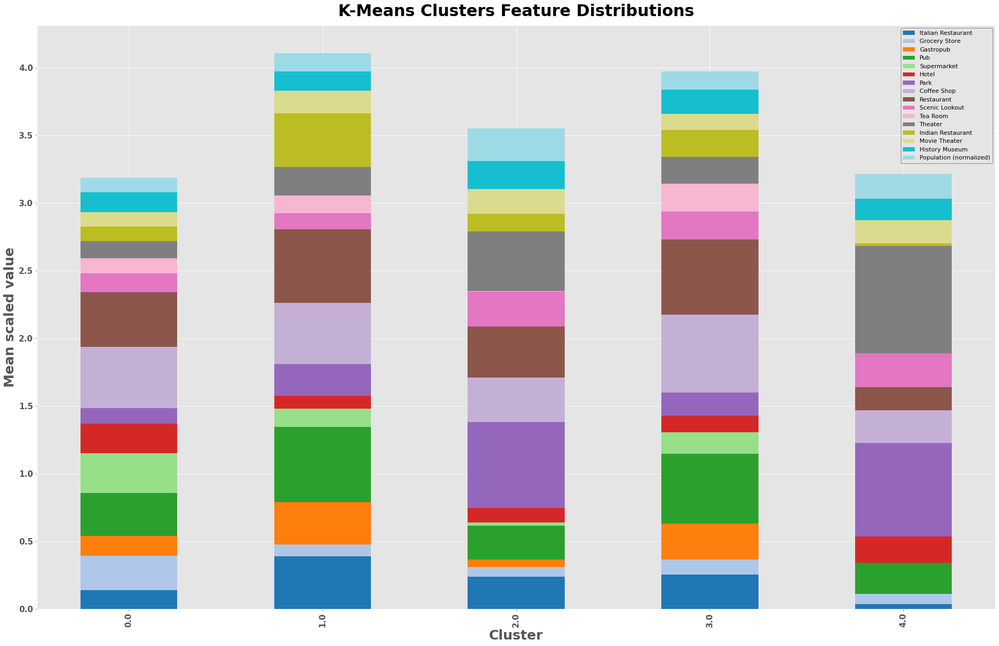

In [96]:
my_array = plt.cm.tab20(np.linspace(0, 1, len(['Italian Restaurant', 'Grocery Store', 'Gastropub', 'Pub', 'Supermarket', 'Hotel', 'Park', 'Coffee Shop', 'Restaurant', 'Scenic Lookout', 'Tea Room', 'Theater', 'Indian Restaurant', 'Movie Theater', 'History Museum', 'Population (normalized)'])))
my_colors = [colors2.rgb2hex(i) for i in my_array]

barset[['Italian Restaurant', 'Grocery Store', 'Gastropub', 'Pub', 'Supermarket', 'Hotel', 'Park', 'Coffee Shop', 'Restaurant', 'Scenic Lookout', 'Tea Room', 'Theater', 'Indian Restaurant', 'Movie Theater', 'History Museum', 'Population (normalized)']].plot(kind='bar', stacked=True, color = my_colors,
                            figsize=(32, 20),
                            legend = None)
plt.autoscale()
plt.xlabel('Cluster', size = 25, fontweight = 'bold')
plt.ylabel('Mean scaled value', size = 25, fontweight = 'bold')
plt.xticks(size = 15, fontweight = 'bold')
plt.yticks(size = 15, fontweight = 'bold')
plt.title('K-Means Clusters Feature Distributions', size = 30, fontweight = 'bold', y = 1.01) #y=1.12) 
plt.legend(loc= 'best', edgecolor = 'black', fontsize = 11) 
#plt.show()

Here's data for one of the clusters in terms of percentage venue category to all venues

In [97]:
ukdataset[ukdataset['K-Means Cluster Labels'] == 0].sort_values(by = 'Population', ascending =False)[['Italian Restaurant', 'Grocery Store', 'Gastropub', 'Pub', 'Supermarket', 'Hotel', 'Park', 'Coffee Shop', 'Restaurant', 'Scenic Lookout', 'Tea Room', 'Theater', 'Indian Restaurant', 'Movie Theater', 'History Museum']]*ukonehotgrouped[['Italian Restaurant', 'Grocery Store', 'Gastropub', 'Pub', 'Supermarket', 'Hotel', 'Park', 'Coffee Shop', 'Restaurant', 'Scenic Lookout', 'Tea Room', 'Theater', 'Indian Restaurant', 'Movie Theater', 'History Museum']].max()*100 #change the number to select a different cluster

,Italian Restaurant,Grocery Store,Gastropub,Pub,Supermarket,Hotel,Park,Coffee Shop,Restaurant,Scenic Lookout,Tea Room,Theater,Indian Restaurant,Movie Theater,History Museum
Town/Area,,,,,,,,,,,,,,,
Norfolk,0.250627,3.00752,4.01003,18.5464,8.27068,6.01504,2.00501,8.27068,7.26817,0.501253,1.00251,0.75188,0.501253,0.75188,0.250627
Edinburgh,0.840336,0.840336,2.52101,13.4454,0.840336,5.04202,8.40336,9.2437,9.2437,2.52101,1.68067,0.840336,0.840336,0.840336,0
Exeter,0.784314,5.68627,3.72549,16.6667,6.47059,7.45098,0.980392,10.7843,7.64706,0.392157,0.784314,0.980392,0,0.392157,0.392157
Doncaster,1.03896,8.05195,1.2987,13.2468,5.71429,4.15584,2.85714,9.87013,9.87013,0,0,1.55844,1.03896,1.03896,1.2987
East Riding of Yorkshire,2.07852,7.3903,1.38568,15.7044,4.84988,3.00231,2.07852,10.3926,8.08314,0.461894,0.461894,0.692841,0.692841,0.692841,0.461894
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
Buteshire,0,16.2162,0,13.5135,0,0,2.7027,10.8108,10.8108,0,0,0,0,0,2.7027
Ayrshire,2.08333,8.33333,0,14.5833,6.25,4.16667,6.25,12.5,8.33333,2.08333,0,0,0,0,2.08333
Archiestown,0,8.10811,0,8.10811,5.40541,13.5135,0,8.10811,10.8108,0,0,0,0,0,0


**Density Based Spatial Clustering of Applications with Noise (DBSCAN)**

DBSCAN is a density-based clustering algorithm which will cluster towns based on density i.e. each cluster has a specified number of points within a specified radius. It requires two parameters, the radius of the neighbourhood or **epsilon** and the **minimum number of neighbours** required to define a cluster. DBSCAN will also incorporate the latitude and longitude to determine whether the makeup of towns varies geographically. DBSCAN is effective for clustering with geospatial data as it can detect arbitrary shaped clusters and it uses density rather than similarity to define clusters. Additionally with DBSCAN outlier towns, or towns who are 'noise' can be detected. 

**In DBSCAN, the cluster labels generated for a particular model is fixed. There is one result, so no global optimum needs to be reached.**

Latitude and Longitude will be added to the clustering feature matrix. The Latitude and Longitude is standardized rather than normalized as DBSCAN doesn't perform using normalization.

In [98]:
Xdbscan_original=clusterset.copy()
Xdbscan_original['Population (normalized)'] = ukdataset['Population (normalized)']
Xdbscan_original['Latitude (standardized)'] = lat_stand
Xdbscan_original['Longitude (standardized)'] = long_stand  

Repeat the same processes as for K-Means

**Tuning**

Tuning for DBSCAN is more complicated as the minimum number of samples cannot be too high or too low. If it is too low, no clusters will form and if it is too high all the clusters will fall into one cluster. We'll generate Silhouette Coefficients for epsilon ranging from 0.3 to 0.9, number of features ranging from 3 to 9, and minimum samples ranging from 3 to 9. 

In [ ]:
from sklearn import datasets, cluster 
Epsilon = []
MIN_SAMPLE = []
DB_Silhouette = []
NUM_CLUSTERS = []
PERCENT_OUTLIERS = []
NUM_FEATURES = []
for i in np.arange(3,10,1):
    for j,k in enumerate(np.arange(3,10)):
        for l in np.arange(3,10):
            agglodbscan = cluster.FeatureAgglomeration(n_clusters=l)
            agglodbscan.fit(Xdbscan_original)
            DBscanreduc = agglodbscan.transform(Xdbscan_original)
            DBscan = DBSCAN(eps = i/10, min_samples=k).fit(DBscanreduc)
            silhouettedb = metrics.silhouette_score(DBscanreduc, DBscan.labels_, metric='euclidean')
            DB_Silhouette.append(silhouettedb)
            Epsilon.append(i/10)
            MIN_SAMPLE.append(k)
            labelframe = pd.DataFrame(DBscan.labels_)
            percent_outlier = (len(labelframe[labelframe[0]== -1])/len(labelframe))*100
            clusters = len(set(DBscan.labels_)) -1 
            PERCENT_OUTLIERS.append(percent_outlier)
            NUM_CLUSTERS.append(clusters)
            NUM_FEATURES.append(l)

In [ ]:
DB_Silhouette = pd.DataFrame(DB_Silhouette)
DB_Silhouette['Epsilon'] = Epsilon
DB_Silhouette['Min_Sample'] = MIN_SAMPLE
DB_Silhouette['Number of Clusters excluding outliers'] = NUM_CLUSTERS
DB_Silhouette['Percent Outliers'] = PERCENT_OUTLIERS
DB_Silhouette['Num_Features'] = NUM_FEATURES
DB_Silhouette.rename(columns = {0:'Silhouette Score'}, inplace =True)
DB_Silhouette.to_csv('DBSCAN_SilhouetteScores.csv')

We'll select one of the models with the highest Silhouette Coefficients, where the minimum number of neighbours is greater than 5, there are more than 3 clusters excluding the outliers, which uses more than 4 features and where less than 30% of the samples were outliers.

In [99]:
silhouette_dbscan = pd.read_csv('DBSCAN_SilhouetteScores.csv')
silhouette_dbscan.drop(columns = 'Unnamed: 0', inplace = True)
viewdbscan_silscore = silhouette_dbscan.sort_values(by = 'Silhouette Score', ascending = False)
viewdbscan_silscore.head(10)

,Silhouette Score,Epsilon,Min_Sample,Number of Clusters excluding outliers,Percent Outliers,Num_Features
322,0.561226,0.9,7,1,0.471698,3
336,0.561226,0.9,9,1,0.471698,3
308,0.561226,0.9,5,1,0.471698,3
315,0.561226,0.9,6,1,0.471698,3
329,0.561226,0.9,8,1,0.471698,3
294,0.561226,0.9,3,1,0.471698,3
301,0.561226,0.9,4,1,0.471698,3
337,0.561077,0.9,9,1,0.471698,4
330,0.561077,0.9,8,1,0.471698,4
316,0.561077,0.9,6,1,0.471698,4


In [100]:
silhouette_dbscan.sort_values(by = 'Silhouette Score', ascending = False)
silhouette_dbscan[silhouette_dbscan['Percent Outliers'] < 30][silhouette_dbscan['Silhouette Score'] > 0.20][silhouette_dbscan['Min_Sample'] > 5][silhouette_dbscan['Number of Clusters excluding outliers'] > 3][silhouette_dbscan['Num_Features']>4].sort_values(by = 'Silhouette Score', ascending = False).head(40)

,Silhouette Score,Epsilon,Min_Sample,Number of Clusters excluding outliers,Percent Outliers,Num_Features
39,0.343826,0.3,8,4,14.150943,7
40,0.343071,0.3,8,4,14.150943,8
23,0.283183,0.3,6,4,7.783019,5
30,0.278671,0.3,7,4,8.254717,5
37,0.265596,0.3,8,4,10.377358,5
24,0.262749,0.3,6,4,8.018868,6
31,0.258267,0.3,7,4,8.490566,6
25,0.243987,0.3,6,4,8.726415,7
26,0.243078,0.3,6,4,8.726415,8
27,0.202698,0.3,6,5,11.556604,9


Silhouette Coefficient increases with increasing Epsilon

Text(0, 0.5, 'Silhouette Score')

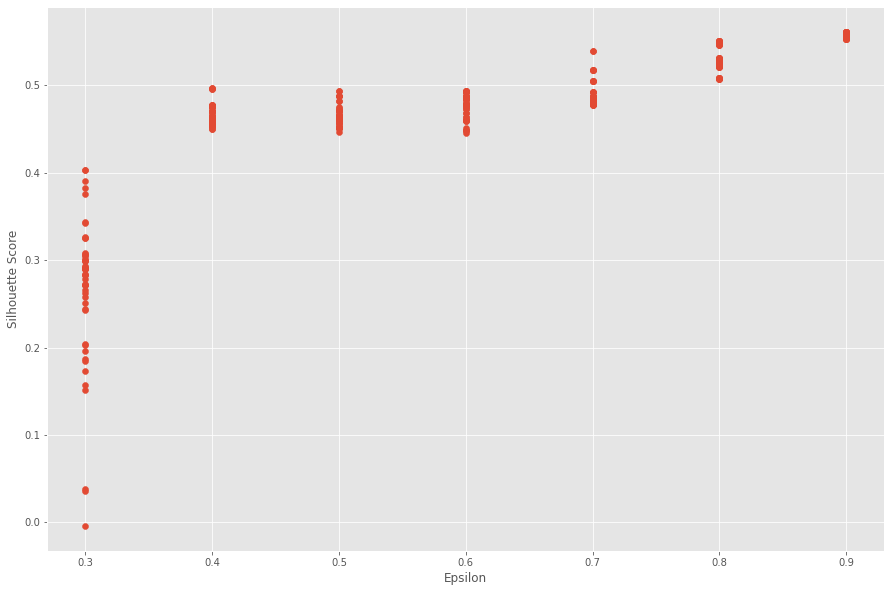

In [101]:
plt.figure (figsize = (15, 10))
plt.scatter(silhouette_dbscan['Epsilon'], silhouette_dbscan['Silhouette Score'])
plt.xlabel('Epsilon')
plt.ylabel('Silhouette Score')

However with increasing Epsilon, the number of clusters decreases

Text(0, 0.5, 'Number of clusters excluding outliers')

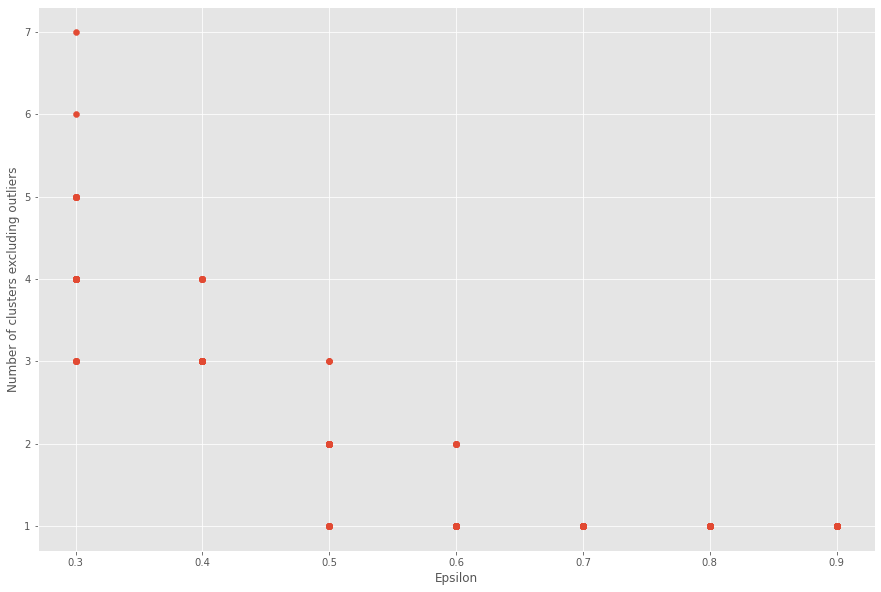

In [102]:
plt.figure (figsize = (15, 10))
plt.scatter(silhouette_dbscan['Epsilon'], silhouette_dbscan['Number of Clusters excluding outliers'])
plt.xlabel('Epsilon')
plt.ylabel('Number of clusters excluding outliers')

The chosen model has an epsilon of 0.3, 7 features and Minimum number of neighbours of 8.

In [103]:
from sklearn import datasets, cluster
from sklearn.cluster import FeatureAgglomeration
epsilon = 0.3 
minimumSamples = 8
dbscanfeatures = 7
featuresdbscan = cluster.FeatureAgglomeration(n_clusters = dbscanfeatures)
featuresdbscan.fit(Xdbscan_original)
Xdbscan = featuresdbscan.transform(Xdbscan_original)
db = DBSCAN(eps=epsilon, min_samples=minimumSamples).fit(Xdbscan)
dblabels = db.labels_
core_samples_mask = np.zeros_like(db.labels_, dtype=bool)
core_samples_mask[db.core_sample_indices_] = True

In [104]:
print('DBSCAN Model has a', dbscanfeatures,'-feature, feature set, wit 3 clusters, excluding the outlier, and a Silhouette Score of', metrics.silhouette_score(Xdbscan, db.labels_, metric='euclidean'))

DBSCAN Model has a 7 -feature, feature set, wit 3 clusters, excluding the outlier, and a Silhouette Score of 0.3438342968313655


Two of the features in the reduced feature set are Latitude , and Longitude

In [105]:
print('Reduced Feature Set (first 5 samples)', Xdbscan[0:5])
print('Latitude, Longitude (first 5 samples):', Xdbscan[:, [3,5]][0:5])

Reduced Feature Set (first 5 samples) [[ 0.02006638  0.11021606  0.06326145  2.59554196  0.41116357 -0.18457616
   0.17804073]
 [ 0.02566328  0.11263871  0.06203209  2.66489559  0.37211932 -0.34728097
   0.0776529 ]
 [ 0.02615965  0.11053186  0.0614234  -1.16079468  0.60254089  0.83031339
   0.26239328]
 [ 0.02096401  0.10686949  0.02611729  1.1129663   0.413212   -0.80930159
   0.05924731]
 [ 0.02075428  0.08765705  0.1047864   0.14822084  0.56296276  0.22570434
   0.33477231]]
Latitude, Longitude (first 5 samples): [[ 2.59554196 -0.18457616]
 [ 2.66489559 -0.34728097]
 [-1.16079468  0.83031339]
 [ 1.1129663  -0.80930159]
 [ 0.14822084  0.22570434]]


In [106]:
Xdbscan_original[['Latitude (standardized)', 'Longitude (standardized)']][0:10]

,Latitude (standardized),Longitude (standardized)
Town/Area,,
Aberdeen,2.595542,-0.184576
Aberdeenshire,2.664896,-0.347281
Adur,-1.160795,0.830313
Allerdale,1.112966,-0.809302
Amber Valley,0.148221,0.225704
Anglesey,0.298041,-1.296340
Angus,2.277701,-0.432941
Antrim,1.145070,-2.307196
Archiestown,2.765186,-0.775623


When the feature matrix is transformed into 3 principal components, two of the three principal components are similar to the latitude and longitude. PC1 generally corresponds to the latitude, and PC3, to the longitude. However these principal components contain other statistical information. PC3, is very high (>1) for 29 towns, and these towns are the towns in the London Metropolitan Area, which are very different from towns elsewhere. Despite these towns being different, DBSCAN is not able to separate them from the rest of the cluster. 

In [107]:
dbpca = PCA(n_components=3)
dbpca.fit(Xdbscan_original)

PCA(copy=True, iterated_power='auto', n_components=3, random_state=None,
  svd_solver='auto', tol=0.0, whiten=False)

In [108]:
dbclusterpca = dbpca.transform(Xdbscan_original)
dbclusterpca[:,0]
dbclusterpca = pd.DataFrame(dbclusterpca)
dbclusterpca['Cluster Labels'] = dblabels
dbclusterpca['Town/Area'] = ukdataset.index
dbclusterkpca = dbclusterpca.groupby('Cluster Labels').mean()
dbclusterkpca = dbclusterkpca.rename(index = {-1:'Outliers'})

In [109]:
dbclusterpca[dbclusterpca[2]>1].head(30)

,0,1,2,Cluster Labels,Town/Area
22,-1.638207,0.597681,1.271867,0,Barking and Dagenham
23,-1.576329,0.653763,2.097155,0,Barnet
50,-1.624996,0.702930,2.611975,0,Brent
68,-1.710225,0.789580,2.789209,0,Camden
89,-1.753722,0.875812,2.948443,0,City of London
105,-1.556302,0.263796,1.031812,0,Croydon
120,-1.441670,0.334285,1.496769,0,Ealing
139,-1.514744,0.543485,1.370613,0,Enfield
157,-1.771761,0.671662,1.914270,0,Greenwich
161,-1.628374,0.690232,2.146262,0,Hackney


**Here are the DBSCAN results in terms of the Principal Components**. The clusters are dense and well separated and a few outliers are visible. The 29 towns in the London Metropolitan Area with a high PC3 are clearly visible.

In [ ]:
import matplotlib.cm as cm
n_clusters = max(dblabels)+1
dblabels_2 = pd.DataFrame(dblabels)
dbcolorskmeans = plt.cm.Spectral(np.linspace(0, 1, len(set(dblabels_2[dblabels_2[0]!=-1].reset_index()[0]))))
dbcol = []
for i, j in enumerate(dblabels_2[dblabels_2[0]!=-1].reset_index()[0]):
    dbcolor_Kmeans = dbcolorskmeans[j]
    dbcol.append(dbcolor_Kmeans)    
#xy = kmeansset
cluster_labels = list(range(0, len(set(dblabels))))
plt.figure(figsize=(16,14))
for i, j in enumerate(dbclusterkpca.index):
    if j!= 'Outliers':
        label = j
        plt.annotate('Cluster' + str(label), xy = (np.array(dbclusterkpca)[:,0][i], np.array(dbclusterkpca)[:,2][i]), color='black', size = 10, alpha = 1, fontweight = 'bold')
    else: 
        plt.annotate('Outliers', xy = (np.array(dbclusterkpca)[:,0][i], np.array(dbclusterkpca)[:,2][i]), color='red', size = 15, alpha = 1) 
for k,l in enumerate(np.array(dbclusterpca['Cluster Labels'])):
    if l == -1:
        plt.scatter(np.array(dbclusterpca[dbclusterpca['Cluster Labels']== -1])[:, 0], np.array(dbclusterpca[dbclusterpca['Cluster Labels']== -1])[:, 2],s=50, c='black', marker=u'o', alpha=0.65)
    else:
        plt.scatter(np.array(dbclusterpca[dbclusterpca['Cluster Labels']!= -1])[:, 0], np.array(dbclusterpca[dbclusterpca['Cluster Labels']!= -1])[:, 2],s=200, c=dbcol, marker=u'o', alpha=0.65)
plt.scatter(np.array(dbclusterkpca)[:,0], np.array(dbclusterkpca)[:,2], s=200, c='black', marker='*', alpha=0.8)
plt.legend()
plt.title('DBSCAN Clustering Results in terms of Principal Components', size = 30, fontweight = 'bold')
plt.xlabel('PC1', size = 20, fontweight = 'bold')
plt.ylabel('PC3', size = 20, fontweight = 'bold')
plt.xticks(size = 15)
plt.yticks(size = 15)
plt.savefig('DBSCAN_Clusters.png')
plt.show()

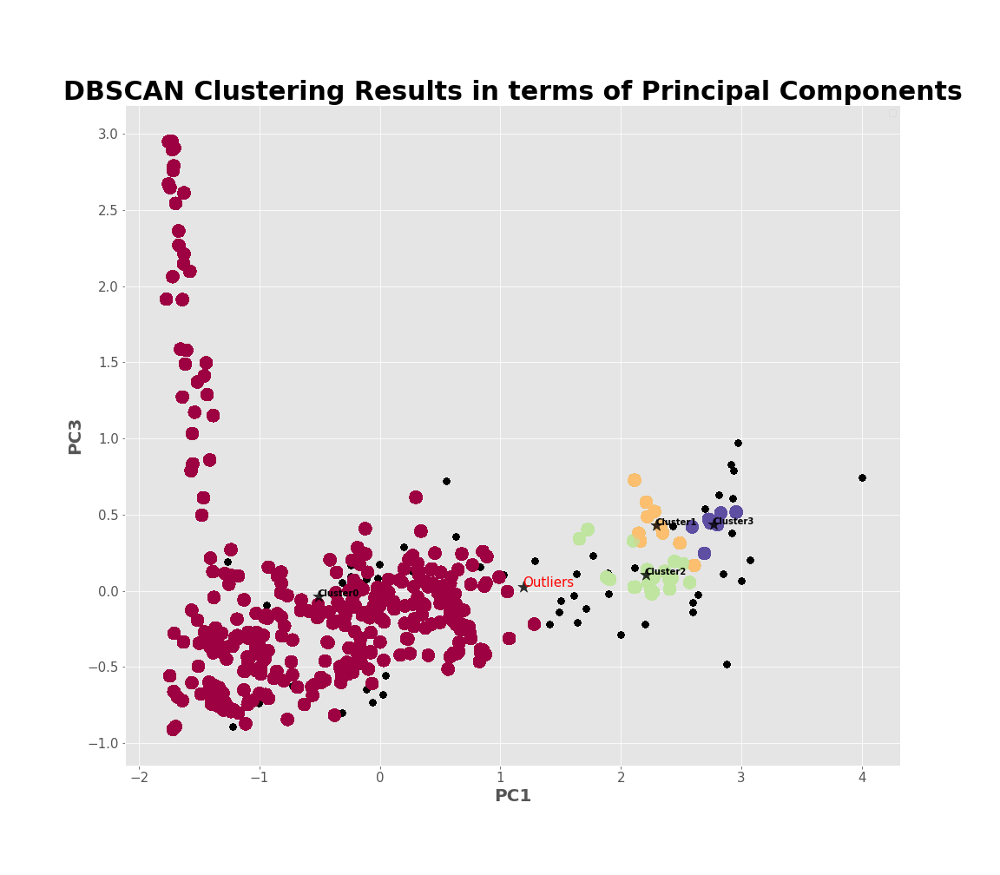

In [110]:
dbscanpca = IM.open('DBSCAN_Clusters.png')
dbscanpca

**We can compare this to the cluster plot in terms of Latitude and Longitude.** 

In [111]:
# Create colors for the clusters.
unique_labels = set(dblabels)
colors3 = plt.cm.Spectral(np.linspace(0, 1, len(unique_labels)))
ukdbdata = ukdataset.copy()
ukdbdata.insert(0, 'DBScan Labels', dblabels.astype(int))
ukdbdata['DB Class'] =  'DB Class' + '' + ukdbdata['DBScan Labels'].astype(str)
ukdbdata[ukdbdata['DBScan Labels'] == -1].shape
ukdbdata[['Latitude (standardized)', 'Longitude (standardized)']] = Xdbscan_original[['Latitude (standardized)', 'Longitude (standardized)']]
#ukdbdata.to_csv('DBSCAN_Clusters.csv') #save DBSCAN clustered data
dbclusters = ukdbdata.groupby('DBScan Labels').mean()[['Latitude', 'Longitude', 'Latitude (standardized)', 'Longitude (standardized)', 'Population (normalized)']]
dbclusters = dbclusters.rename(index = {-1:'Outliers'})
dbclusters

,Latitude,Longitude,Latitude (standardized),Longitude (standardized),Population (normalized)
DBScan Labels,,,,,
Outliers,53.926230,-3.486367,0.668447,-0.860928,0.102144
0,52.269461,-1.133998,-0.312283,0.368382,0.143428
1,54.570115,-5.946432,1.049597,-2.146518,0.081412
2,55.912012,-4.141391,1.843937,-1.203233,0.153566
3,54.910803,-6.566368,1.251268,-2.470487,0.043071


(array([-4., -3., -2., -1.,  0.,  1.,  2.,  3.]),
 [Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, '')])

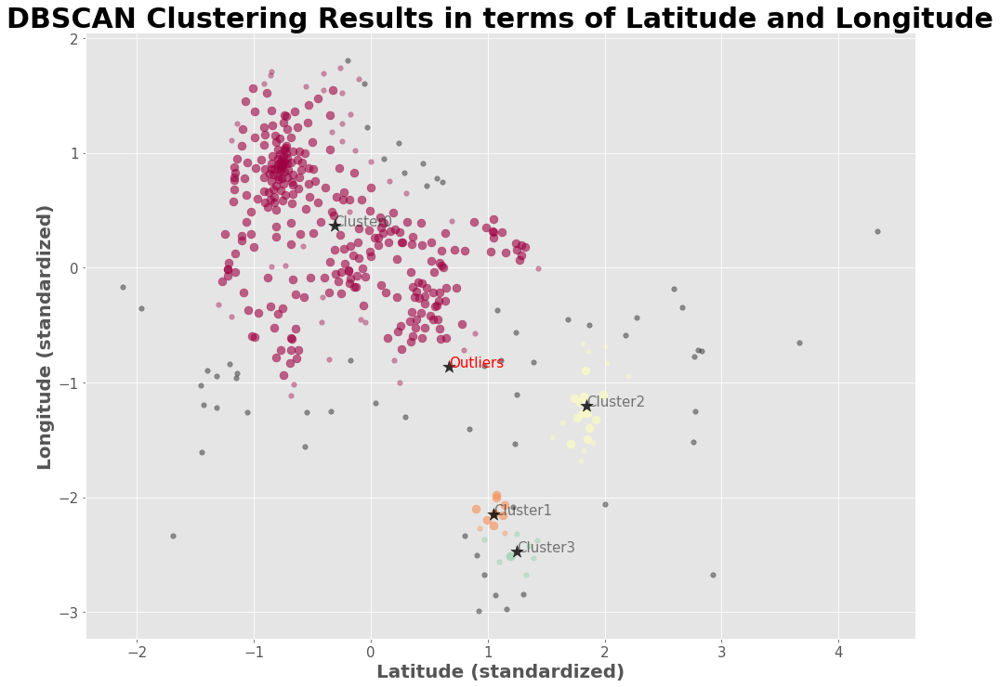

In [112]:
plt.figure(figsize = (16,12))
plt.title ("DBSCAN Clustering Results in terms of Latitude and Longitude", size = 30, fontweight = 'bold')
plt.xlabel('Latitude (standardized)',  size = 20, fontweight = 'bold')
plt.ylabel('Longitude (standardized)',  size = 20, fontweight = 'bold')
for k, col in zip(unique_labels, colors3):
    if k == -1:
        # Black used for noise.
        col = 'k'

    class_member_mask = (dblabels == k)

    # Plot the datapoints that are clustered
    xy = Xdbscan[class_member_mask & core_samples_mask]
    plt.scatter(xy[:, 3], xy[:, 5],s=80, c=[col], marker=u'o', alpha=0.6)

    # Plot the outliers
    xy = Xdbscan[class_member_mask & ~core_samples_mask]
    plt.scatter(xy[:, 3], xy[:, 5],s=30, c=[col], marker=u'o', alpha=0.4)
for i, j in enumerate(dbclusters.index):  
    label = j
    if j!= 'Outliers':
        plt.annotate('Cluster' + str(label), xy = (np.array(dbclusters)[:,2][i], np.array(dbclusters)[:,3][i]), color='black', size = 15, alpha = 0.5) 
    else: 
        plt.annotate('Outliers', xy = (np.array(dbclusters)[:,2][i], np.array(dbclusters)[:,3][i]), color='red', size = 15, alpha = 1) 
plt.scatter(np.array(dbclusters)[:,2], np.array(dbclusters)[:,3], s=200, c='black', marker='*', alpha=0.8)
plt.xticks(size = 15)
plt.yticks(size = 15)

**In 3D principal component space we can see the collection of towns in the London metropolitan area with high average values of the 3rd principal component.**

Text(0.5, 0, 'PC3')

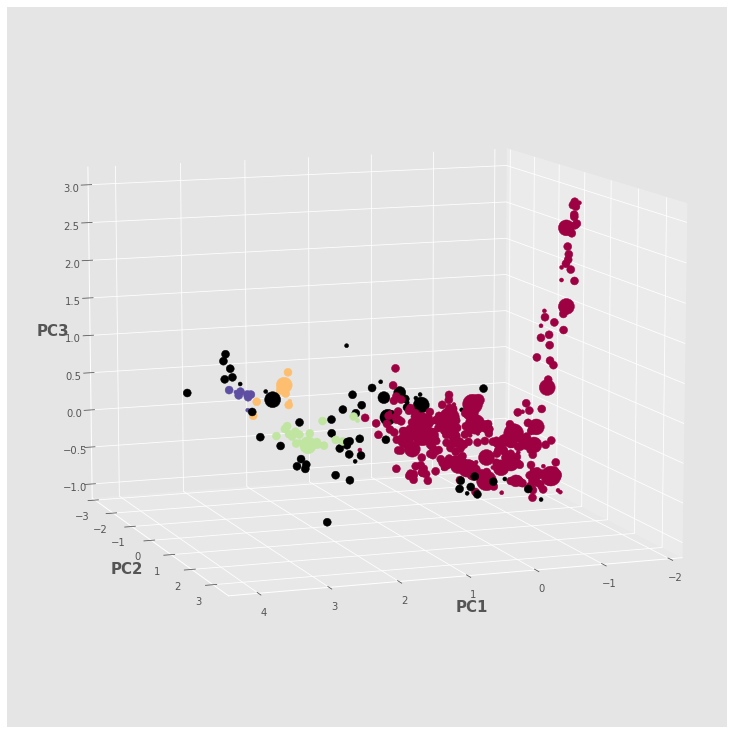

In [113]:
fig = plt.figure(figsize = (16, 10))
dbcolors_array = plt.cm.Spectral(np.linspace(0, 1, len(set(dblabels))-1))
dbukrain = [colors2.rgb2hex(i) for i in dbcolors_array]
dbukrainbow = ['#000000']    
for i, j in enumerate(dbukrain):
    dbukrainbowcolor = dbukrain[i]
    dbukrainbow.append(dbukrainbowcolor)
ColorDB = []
for i, j in enumerate(dblabels):
    colordb = dbukrainbow[j+1]
    ColorDB.append(colordb)
ax = Axes3D(fig, elev=10, azim=70)
ax.scatter(dbclusterpca.loc[:, 0], dbclusterpca.loc[:, 1], dbclusterpca.loc[:, 2], s=np.pi*(abs(dblabels + 2)**2)*5 , c=ColorDB  , alpha=1)
ax.set_xlabel('PC1', fontsize = 15, fontweight = 'bold')
ax.set_ylabel('PC2', fontsize = 15, fontweight = 'bold')
ax.set_zlabel('PC3', fontsize = 15, fontweight = 'bold')

In [114]:
ukdbdatamap_clusters = folium.Map(location=[uklat, uklong], zoom_start=7, tiles ='Stamen Toner')
dbclustercenters = ukdbdata.groupby('DBScan Labels').mean()
dbclustercenters['DBScan Labels'] = dbclustercenters.index
# set color scheme for the clusters
dbukcolors_array = plt.cm.Spectral(np.linspace(0, 1, len(set(dblabels))-1))
dbukrain = [colors2.rgb2hex(i) for i in dbukcolors_array]
dbukrainbow = ['#000000']    
#plot towns coloured according to DBSCAN clusters
for i, j in enumerate(dbukrain):
    dbukrainbowcolor = dbukrain[i]
    dbukrainbow.append(dbukrainbowcolor)
for lat, lon, poi, cluster, in zip(ukdbdata['Latitude'], ukdbdata['Longitude'], ukdbdata.index, ukdbdata['DBScan Labels']):   
    label = folium.Popup(str(poi) + ' Cluster ' + str(cluster), parse_html=True)
    folium.CircleMarker(
        [lat, lon],
        radius=4,
        popup=label,
        color=dbukrainbow[cluster+1],   
        fill=True,
        fill_color=dbukrainbow[cluster+1], 
        fill_opacity=1).add_to(ukdbdatamap_clusters )
#plot cluster centers
for clustercenter, clusterlat, clusterlong  in zip(dbclustercenters['DBScan Labels'], dbclustercenters['Latitude'], dbclustercenters['Longitude']):   
    label2 = folium.Popup('Cluster Center ' + str(clustercenter), parse_html=True)
    folium.CircleMarker(
        [clusterlat, clusterlong],
        radius2=8,
        popup=label2,
        color=dbukrainbow[clustercenter+1],   
        fill=True,
        fill_color=dbukrainbow[clustercenter+1], 
        fill_opacity=0.4).add_to(ukdbdatamap_clusters)
ukdbdatamap_clusters

Cluster -1 is the outlier cluster. There are 60 outlier towns scattered around Scotland, England and Northern Ireland and particularly in coastal areas and away from the major towns. However, three major towns, Norfolk, in southeast England and Cornwall and Exeter, in Southwest England, which are in the top 30 towns in the dataset by population, and Aberdeen, which is a major town in Scotland belong to this cluster. These towns are not characterized by any distinguishing feature.
 
Cluster 0 is comprised of 324 towns which are scattered around England and eastern Wales. These towns have a high density of pubs, gastropubs, Indian Restaurants and History Museums. 

Cluster 1 comprises of 10 towns located in southeastern Northern Ireland. These towns have a very high restaurant density. Similar to towns in England, they have a high density of parks and theaters. 

Cluster 2 is comprised of 22 towns located in central Scotland. There isn’t a feature which particularly differentiates these towns from other towns aside from location. 

Cluster 3 is comprised of 8 towns in northeastern Northern Ireland. These towns have a higher density of supermarkets and scenic lookouts to towns in other clusters. 
All five clusters have a similar relative number of coffee shops which indicates there is no regional variability in the amount of coffee shops and restaurants towns in the UK have. 

**For the most significant features in the dataset, these are the average values for the towns of each cluster. Values are shown as percentage of total venues**

In [115]:
barsetdbscan = ukdbdata[['Italian Restaurant', 'Grocery Store', 'Gastropub', 'Pub', 'Supermarket', 'Hotel', 'Park', 'Coffee Shop', 'Restaurant', 'Scenic Lookout', 'Tea Room', 'Theater', 'Indian Restaurant', 'Movie Theater', 'History Museum', 'Population (normalized)', 'DBScan Labels']].astype(float).groupby('DBScan Labels').mean()
barsetdbscan2 = barsetdbscan[['Population (normalized)']]*ukdataset['Population'].max()
barsetdbscan2.rename(columns = {'Population (normalized)': 'Average Population'}, inplace = True)
barsetdbscan3 = barsetdbscan.drop(columns = 'Population (normalized)')*ukonehotgrouped[['Italian Restaurant', 'Grocery Store', 'Gastropub', 'Pub', 'Supermarket', 'Hotel', 'Park', 'Coffee Shop', 'Restaurant', 'Scenic Lookout', 'Tea Room', 'Theater', 'Indian Restaurant', 'Movie Theater', 'History Museum']].max()*100
barsetdbscan_denormalized = barsetdbscan3.join(barsetdbscan2)
barsetdbscan_denormalized.round(4)

,Italian Restaurant,Grocery Store,Gastropub,Pub,Supermarket,Hotel,Park,Coffee Shop,Restaurant,Scenic Lookout,Tea Room,Theater,Indian Restaurant,Movie Theater,History Museum,Average Population
DBScan Labels,,,,,,,,,,,,,,,,
-1.0,0.8857,5.2123,1.4339,12.1185,5.8115,9.8006,1.6345,10.1569,8.9200,0.5819,0.4666,0.6967,0.5102,0.5027,0.5830,112900.5833
0.0,1.8948,2.3400,3.1946,18.8443,2.8049,4.4790,6.5643,9.3612,9.9031,0.8060,0.6422,1.3437,1.7920,0.7517,0.9566,158532.5772
1.0,1.4052,1.6329,1.6947,7.0660,4.5091,4.3493,6.7413,11.9698,16.8517,0.1266,0.0000,1.4634,1.2263,0.6659,0.3884,89985.8000
2.0,2.2503,5.1149,1.3889,9.9549,4.3137,7.6233,5.2456,9.6579,10.6334,0.8418,0.5881,0.4266,1.0876,0.6367,0.6022,169737.6818
3.0,0.6439,3.1496,0.8094,5.6572,8.8030,7.9070,1.0183,12.9921,13.7568,1.5047,0.3565,0.5201,0.0828,0.6770,0.0000,47606.3750


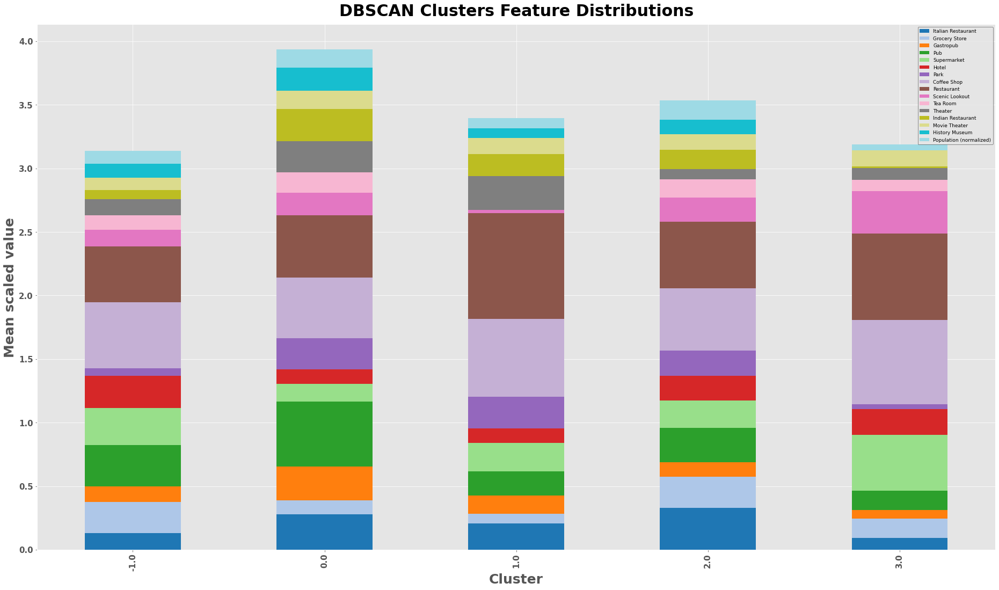

In [116]:
barsetdbscan[['Italian Restaurant', 'Grocery Store', 'Gastropub', 'Pub', 'Supermarket', 'Hotel', 'Park', 'Coffee Shop', 'Restaurant', 'Scenic Lookout', 'Tea Room', 'Theater', 'Indian Restaurant', 'Movie Theater', 'History Museum', 'Population (normalized)']].plot(kind='bar', stacked=True, color = my_colors,
                            figsize=(32, 18),
                            legend = None)
plt.xlabel('Cluster', size = 25, fontweight = 'bold')
plt.ylabel('Mean scaled value', size = 25, fontweight = 'bold')
plt.xticks(size = 15, fontweight = 'bold')
plt.yticks(size = 15, fontweight = 'bold')
plt.title('DBSCAN Clusters Feature Distributions', size = 30, fontweight = 'bold', y = 1.01) #y=1.12) 
plt.legend(loc='best', edgecolor = 'black', fontsize = 9) 
plt.show()

Here is information for each cluster

In [117]:
ukdbdata[ukdbdata['DBScan Labels'] == 0].sort_values(by = 'Population', ascending = False).shape

(324, 369)

### **Classification**

Classification of towns into pre-determined classes will be carried out using a series of machine learning algorithms on Dataset II. This is a supervised learning process as there is a ground truth for the classification. The ground truth is the class labels that were assigned to the towns previously. Classification will identify a relationship, if any, between the venue category densities of towns and the class they belong to. If there is a well defined relationship, classification should be accurate. The algorithms are trained with a dataset containing the features and the true labels, and then the classification algorithm predicts what these labels are on either a test set, another dataset with the same features, or the training set itself. Since these algorithms are intelligent and will be tuned, they will try and establish relationships which will optimize classification accuracy. Whether they represent intuitively realistic relationships may require further investigation.

**The three types of class labels which will be used are:**

    Population Bins
    K-Means Cluster Labels
    DBSCAN Labels
    
**The 4 classification algorithms which will be used are:**
    
    Support Vector Machines (SVM)
    K-Nearest Neighbors (KNN)
    Decision Trees (DT)
    Random Forest (RF)
    
**The accuracy of classification will be evaluated using:**

    Accuracy Score
    F1 Score
    Precision
    Recall


**Feature Selection**

The Features used for classification are the ones which were used for regression and a few of the other high frequency features in the dataset which weren't highly correlated with Population and also the normalized population

Here are the features:

In [118]:
classcol = ['Theater', 'Pub', 'Restaurant', 'Coffee Shop', 'Museum', 'Park', 'Indian Restaurant', 'Movie Theater', 'History Museum', 'Italian Restaurant', 'Grocery Store', 'Gastropub', 'Supermarket','Hotel', 'Scenic Lookout', 'Tea Room', 'Population (normalized)']
classcol

['Theater',
 'Pub',
 'Restaurant',
 'Coffee Shop',
 'Museum',
 'Park',
 'Indian Restaurant',
 'Movie Theater',
 'History Museum',
 'Italian Restaurant',
 'Grocery Store',
 'Gastropub',
 'Supermarket',
 'Hotel',
 'Scenic Lookout',
 'Tea Room',
 'Population (normalized)']

**Predictions**

For each machine learning algorithm and type of class label:

    We will determine the ideal model using a Grid Search. The parameters from the Grid Search are the ones which should be best for a range of train/test splits as they are the ones which result in the highest cross-validation accuracy. Some of these parameters will be used for the other models 

    We will determine the model that has the highest in-sample accuracy and predict on the:
        The Full Dataset 
    
    We will specify a train/test split and determine the model with highest out-of-sample accuracy for that train/test split and predict on the:
        The training set of the specified train/test split
        The test set of the specified train/test split  
    
    Using the ideal model predict on: 
        Range of test sets using cross-validation
        The full dataset
        
        
**The train/test split is chosen by calculating the recall score for a range of train/test splits for using the ideal model of each machine learning algorithm and selecting the rough average of the test sizes which produce the highest recall for each of the algorithms.**

**Using Population Bins as Labels**

First we will investigate the performance of classification using Population Bins as class labels. A test size of 20% produces best classification results overall.

In [119]:
classificationset = ukdataset.copy()
xdata = classificationset[classificationset.columns[:363]]
Xpop = xdata
Xpop.drop(columns = ['Latitude', 'Longitude', 'Easting', 'Northing', 'Postcodes', 'Active postcodes', 'Population', 'Households', 'Town/Area'], inplace = True)
#Select Only the Classification Features
Xpop = Xpop[classcol]
Ypop = pd.Series(np.array(classificationset['Pop-binned']))
Ypop.index = Xpop.index
#Create Training and Testing Set
X_trainpop, X_testpop, Y_trainpop, Y_testpop = train_test_split(Xpop, Ypop, test_size=0.14, random_state=0)

**SVM**

SVM requires three hyperparameters: 

    The Kernel: We'll choose between a Linear Kernel and an RBF Kernel
    The Cost (C): We'll choose a number from a range e.g. 1 to 99
    Gamma: We'll choose between 'scale', 'auto', 0.001 and 0.0001
    
We'll use a Grid Search to determine the best hyperparameters for out-of-sample accuracy.

In [ ]:

svmparam = tuned_parameters = [{'kernel': ['rbf'], 'gamma': ['scale', 'auto', 0.001, 0.0001],
                     'C': np.arange(1,100)},
                    {'kernel': ['linear'], 'C': np.arange(1,100)}]
SV=svm.SVC()
Gridsvm = GridSearchCV(SV, svmparam, cv=3)
Gridsvm.fit(Xpop, Ypop)
BestRRsvm=Gridsvm.best_params_
BestRRsvmestimate = Gridsvm.best_estimator_
BestRRsvm

**Grid Search Results**
     
     Kernel: Linear 
     Cost: 21
    
    

**Determine parameters for highest-in-sample accuracy**

In [120]:
inmaxsvmpop = 100
inmean_acc_svmpop = np.zeros((inmaxsvmpop-1))
instd_acc_svmpop = np.zeros((inmaxsvmpop-1))
inConfustionMxSVMpop = [];
for n in range(1,inmaxsvmpop):
    inSVMpopconf = svm.SVC(kernel='linear', C=n,  gamma = 'scale', random_state=1).fit(X_trainpop,Y_trainpop) #X_train, Y_train
    inyhat_svmpop=inSVMpopconf.predict(X_trainpop)
    inmean_acc_svmpop[n-1] = metrics.accuracy_score(Y_trainpop, inyhat_svmpop)
    instd_acc_svmpop[n-1]=np.std(inyhat_svmpop==Y_trainpop)/np.sqrt(inyhat_svmpop.shape[0])

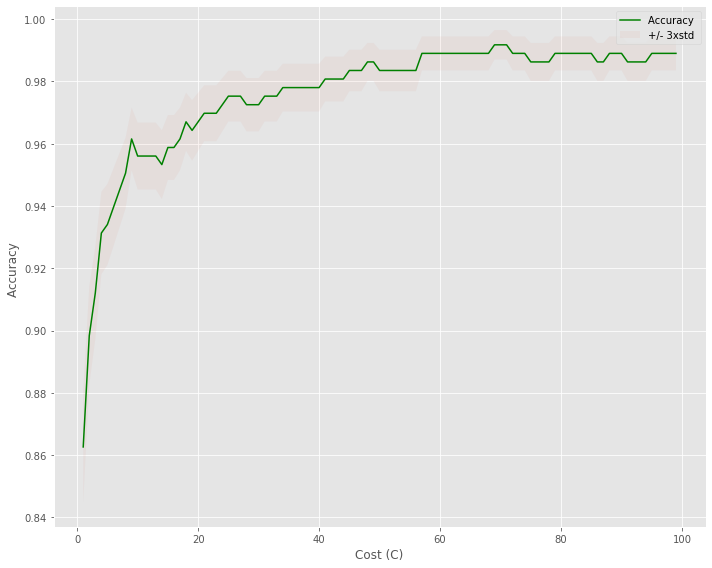

The best in-sample accuracy is 0.9917582417582418  reached when C= 69


In [121]:
plt.figure(figsize = (10,8))
plt.plot(range(1,inmaxsvmpop),inmean_acc_svmpop,'g')
plt.fill_between(range(1,inmaxsvmpop),inmean_acc_svmpop - 1 * instd_acc_svmpop,inmean_acc_svmpop + 1 * instd_acc_svmpop, alpha=0.05)
plt.legend(('Accuracy ', '+/- 3xstd'))
plt.ylabel('Accuracy ')
plt.xlabel('Cost (C)')
plt.tight_layout()
plt.show()
print( "The best in-sample accuracy is", inmean_acc_svmpop.max(), " reached when C=",  inmean_acc_svmpop.argmax()+1)

In [122]:
inSVMpopC = inmean_acc_svmpop.argmax()+1
inSVMpop = svm.SVC(kernel='linear', C=inSVMpopC,  gamma = 'scale', random_state=1)
inSVMpop.fit(Xpop,Ypop)
inyhatSVMpop = inSVMpop.predict(Xpop)

**Determine parameters for highest out-of-sample accuracy**

In [123]:
maxsvmpop = 100
mean_acc_svmpop = np.zeros((maxsvmpop-1))
std_acc_svmpop = np.zeros((maxsvmpop-1))
ConfustionMxSVMpop = [];
for n in range(1,maxsvmpop):
    SVMpopconf = svm.SVC(kernel='linear', C=n,  gamma = 'scale', random_state=1).fit(X_trainpop,Y_trainpop) #X_train, Y_train
    yhat_svmpop=SVMpopconf.predict(X_testpop)
    mean_acc_svmpop[n-1] = metrics.accuracy_score(Y_testpop, yhat_svmpop)
    std_acc_svmpop[n-1]=np.std(yhat_svmpop==Y_testpop)/np.sqrt(yhat_svmpop.shape[0])

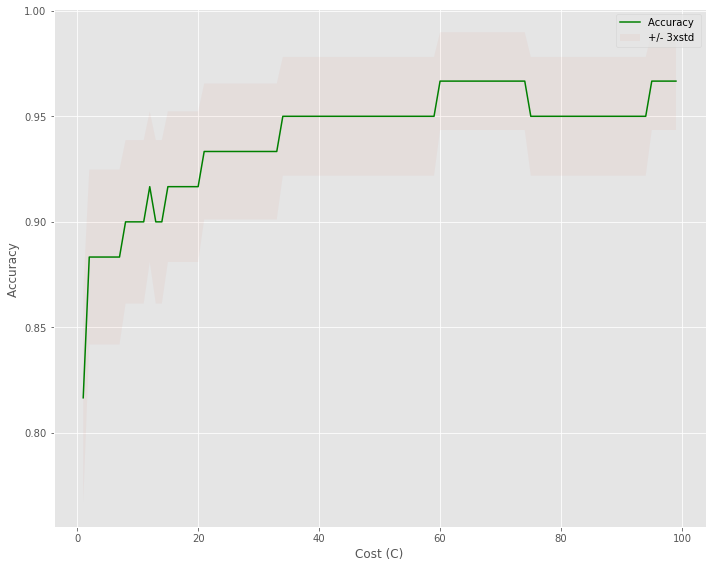

The best out of sample accuracy is 0.9666666666666667  reached when C= 60


In [124]:
plt.figure(figsize = (10,8))
plt.plot(range(1,maxsvmpop),mean_acc_svmpop,'g')
plt.fill_between(range(1,maxsvmpop),mean_acc_svmpop - 1 * std_acc_svmpop,mean_acc_svmpop + 1 * std_acc_svmpop, alpha=0.05)
plt.legend(('Accuracy ', '+/- 3xstd'))
plt.ylabel('Accuracy ')
plt.xlabel('Cost (C)')
plt.tight_layout()
plt.show()
print( "The best out of sample accuracy is", mean_acc_svmpop.max(), " reached when C=",  mean_acc_svmpop.argmax()+1)

In [125]:
SVMpopC = mean_acc_svmpop.argmax()+1
SVMpop = svm.SVC(kernel='linear', gamma = 'scale', C = SVMpopC, random_state=1)
# predict on training examples
SVMpop.fit(X_trainpop, Y_trainpop) 
yhatSVMpop = SVMpop.predict(X_testpop)

**Plot the Confusion Matrix**

In [126]:
from sklearn.metrics import classification_report, confusion_matrix
import itertools

def plot_confusion_matrix(cm, classes,
                          normalize=False,
                          title='Confusion matrix',
                          cmap=plt.cm.Oranges):
    """
    This function prints and plots the confusion matrix.
    Normalization can be applied by setting `normalize=True`.
    """
    if normalize:
        cm = cm.astype('float') / cm.sum(axis=1)[:, np.newaxis]
        print("Normalized confusion matrix")
    else:
        print('Confusion matrix, without normalization')

    #print(cm)

    plt.imshow(cm, interpolation='nearest', cmap=cmap)
    plt.title(title, y = 1.12, fontweight = 'bold', size = 30)
    plt.colorbar().ax.tick_params(labelsize=20)
    tick_marks = np.arange(len(classes))
    plt.xticks(tick_marks, classes, rotation=45, size=15, fontweight = 'bold')
    plt.yticks(tick_marks, classes, size = 15, fontweight = 'bold')

    fmt = '.2f' if normalize else 'd'
    thresh = cm.max() / 2.
    for i, j in itertools.product(range(cm.shape[0]), range(cm.shape[1])):
        plt.text(j, i, format(cm[i, j], fmt),
            horizontalalignment="center",
            color= "black", size = 20)#"white" if cm[i, j] > thresh else "black")

    plt.tight_layout()
    plt.ylabel('True label', size = 20, fontweight = 'bold')
    plt.xlabel('Predicted label', size = 20, fontweight = 'bold')

                     precision    recall  f1-score   support

     Bin1(0-184218)       0.98      1.00      0.99        42
Bin2(184218-368436)       0.93      0.93      0.93        15
Bin3(368436-552655)       1.00      0.50      0.67         2
Bin4(552655-736873)       1.00      1.00      1.00         1

          micro avg       0.97      0.97      0.97        60
          macro avg       0.98      0.86      0.90        60
       weighted avg       0.97      0.97      0.96        60

Normalized confusion matrix


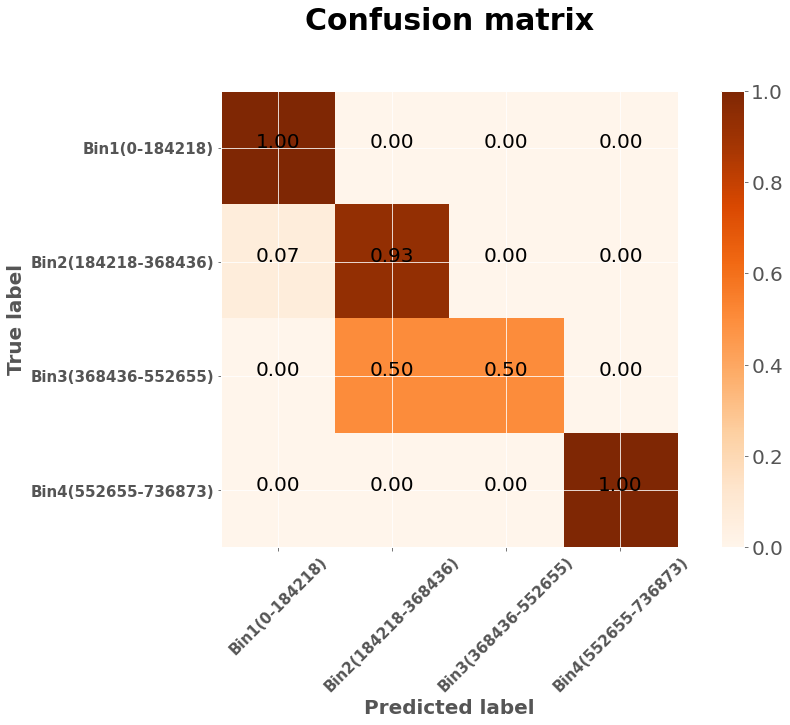

In [127]:
SVMpopmatrix = confusion_matrix(Y_testpop, yhatSVMpop, labels=np.array(list((set(Y_testpop.values)))))
np.set_printoptions(precision=2)
print (classification_report(Y_testpop, yhatSVMpop))
#Plot non-normalized confusion matrix
plt.figure(figsize = [14,10])
plot_confusion_matrix(SVMpopmatrix, classes=np.array(list((set(Y_testpop.values)))),normalize= True,  title='Confusion matrix')
from sklearn.metrics import recall_score
from sklearn.metrics import precision_score

**View Recall for different test sizes**

In [128]:
svmPrecision = []
svmRecall = []
svmTest = []
for i in np.arange(10, 70):
    svmX_trainpopprecall, svmX_testpopprecall, svmY_trainpopprecall, svmY_testpopprecall = train_test_split(Xpop, Ypop, test_size=i/100)
    svmprecision =svm.SVC(kernel='linear', gamma = 'scale', C = 21, random_state=1)
    svmprecision.fit(svmX_trainpopprecall, svmY_trainpopprecall)
    svmPscore = precision_score(svmY_testpopprecall, svmprecision.predict(svmX_testpopprecall), average = 'weighted')
    svmRc = recall_score(svmY_testpopprecall, svmprecision.predict(svmX_testpopprecall), average = 'weighted')
    svmPrecision.append(svmPscore)
    svmRecall.append(svmRc)
    svmTest.append(i/100)

In [129]:
svmPrecision = pd.DataFrame(svmPrecision).rename(columns = {0:'Precision'})
svmRecall = pd.DataFrame(svmRecall).rename(columns = {0:'Recall'})
svmPCcurve = svmPrecision.join(svmRecall)
svmPCcurve['Test Size'] = svmTest
svmPCcurve.sort_values(by = 'Recall', ascending = False).head(5)
testsizemin = svmPCcurve[svmPCcurve['Recall']==min(svmPCcurve['Recall'])]['Test Size'].values[0]
recallmin = svmPCcurve[svmPCcurve['Recall']==min(svmPCcurve['Recall'])]['Recall'].values[0]
recallmin = round(recallmin, 3)
svmPCcurve.head()

,Precision,Recall,Test Size
0,0.837482,0.860465,0.10
1,0.947384,0.957447,0.11
2,0.962293,0.960784,0.12
3,0.946506,0.946429,0.13
4,0.871237,0.900000,0.14


Precision is approximately equal to Recall for all test sizes 

Text(0.5, 0, 'Precision')

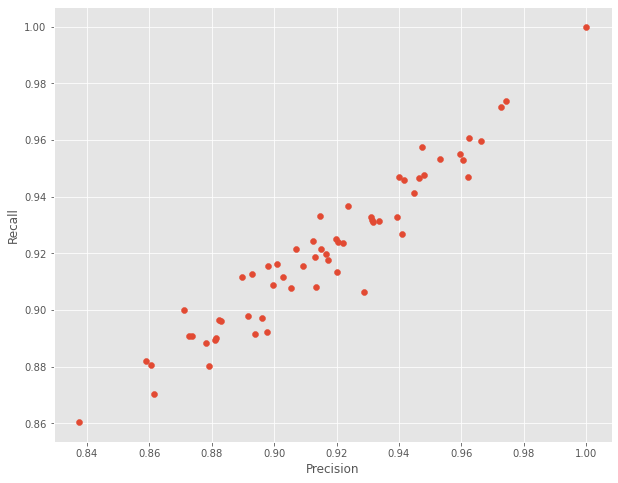

In [130]:
plt.figure(figsize = (10,8))
plt.scatter(svmPCcurve['Precision'], svmPCcurve['Recall'])
plt.ylabel('Recall')
plt.xlabel('Precision')

But Recall/Precision varies with test size. We want to find the test size that produces the most accurate results although with the ideal model, performance should be good for all train/test splits. Recall is generally worst with the largest test sizes and best with the lowest test size. 

In [131]:
print('The lowest recall is {} for a test size of {} ({}% of the dataset).'.format(recallmin, testsizemin, str(round(testsizemin*100, 0))))

The lowest recall is 0.86 for a test size of 0.1 (10.0% of the dataset).


Text(0.5, 0, 'Test Size')

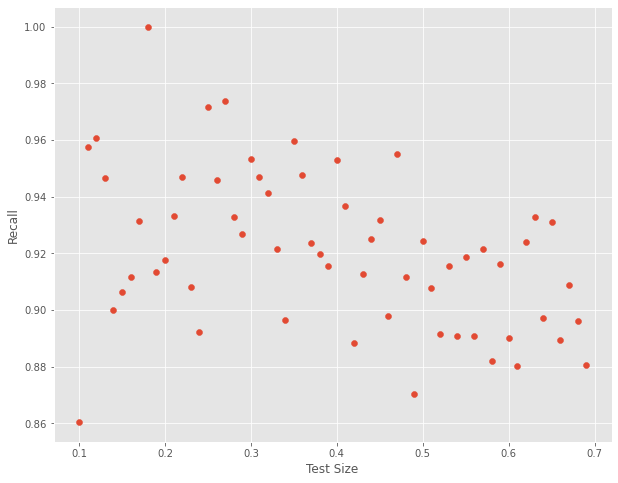

In [132]:
plt.figure(figsize = (10,8))
plt.scatter(svmPCcurve['Test Size'], svmPCcurve['Recall'])
plt.ylabel('Recall')
plt.xlabel('Test Size')

**K-Nearest Neighbor**

We repeat the processes for the KNN Model

KNN requires the following hyperparameters:

    Number of Neighbours: Select from a range of numbers e.g. 1-29
    Algorithm: Select from 'Auto', 'Ball_tree', 'Kd_tree' or 'brute'
    Weights: Select from 'Uniform or 'Distance'


In [ ]:

knnparampop = [{'n_neighbors': np.arange(1,30), 'algorithm': ['auto', 'ball_tree', 'kd_tree', 'brute'],
                    'weights': ['uniform', 'distance']}]
KNNpopmodel= KNeighborsClassifier()
GridKNNpop = GridSearchCV(KNNpopmodel, knnparampop, cv=4)
GridKNNpop.fit(Xpop, Ypop)
BestRRKNNpop=GridKNNpop.best_params_
BestRRKNNpop

**Grid Search Results:**

    N_neigbors: 4
    Weights: Distance
    Algorithm: Auto

In [133]:
inKspop = 30
inmean_accpop = np.zeros((inKspop-1))
instd_accpop = np.zeros((inKspop-1))
inConfustionMx = [];
for n in range(1,inKspop):
    #Train Model and Predict  
    inneighpopconf = KNeighborsClassifier(n_neighbors = n, algorithm = 'auto', weights = 'distance').fit(X_trainpop,Y_trainpop) #X_train, Y_train
    inyhatknnpopconf=inneighpopconf.predict(X_trainpop)
    inmean_accpop[n-1] = metrics.accuracy_score(Y_trainpop, inyhatknnpopconf)
    instd_accpop[n-1]=np.std(inyhatknnpopconf==Y_trainpop)/np.sqrt(inyhatknnpopconf.shape[0])

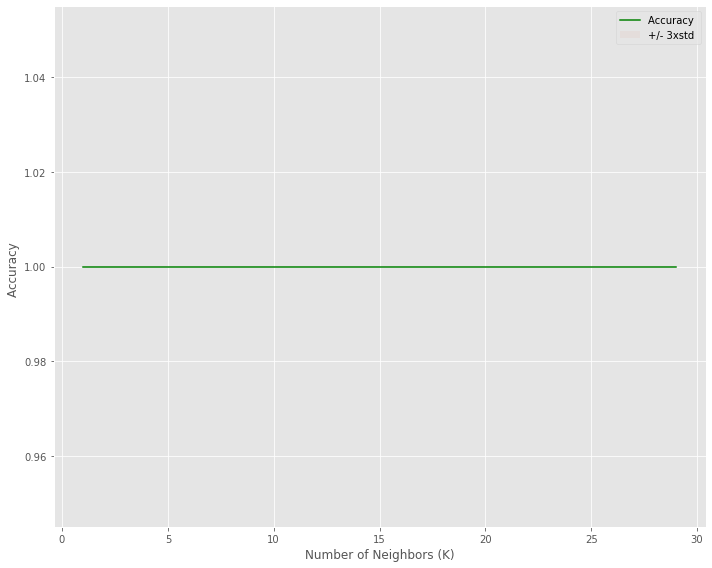

The best in-sample accuracy is 1.0 reached when k= 1


In [134]:
plt.figure(figsize = (10,8))
plt.plot(range(1,inKspop),inmean_accpop,'g')
plt.fill_between(range(1,inKspop),inmean_accpop - 1 * instd_accpop,inmean_accpop + 1 * instd_accpop, alpha=0.05)
plt.legend(('Accuracy ', '+/- 3xstd'))
plt.ylabel('Accuracy ')
plt.xlabel('Number of Neighbors (K)')
plt.tight_layout()
plt.show()
print( "The best in-sample accuracy is", inmean_accpop.max(), "reached when k=", inmean_accpop.argmax()+1) 

In [135]:
inkpop = inmean_accpop.argmax()+1
inneighpop = KNeighborsClassifier(n_neighbors = inkpop, algorithm = 'auto', weights = 'distance')
inneighpop.fit(Xpop,Ypop)
inyhatknnpop = inneighpop.predict(Xpop)

In [136]:
Kspop = 30
mean_accpop = np.zeros((Kspop-1))
std_accpop = np.zeros((Kspop-1))
ConfustionMx = [];
for n in range(1,Kspop):
    
    #Train Model and Predict  
    neighpopconf = KNeighborsClassifier(n_neighbors = n, algorithm = 'auto', weights = 'distance').fit(X_trainpop,Y_trainpop) #X_train, Y_train
    yhatknnpopconf=neighpopconf.predict(X_testpop)
    mean_accpop[n-1] = metrics.accuracy_score(Y_testpop, yhatknnpopconf)
    std_accpop[n-1]=np.std(yhatknnpopconf==Y_testpop)/np.sqrt(yhatknnpopconf.shape[0])

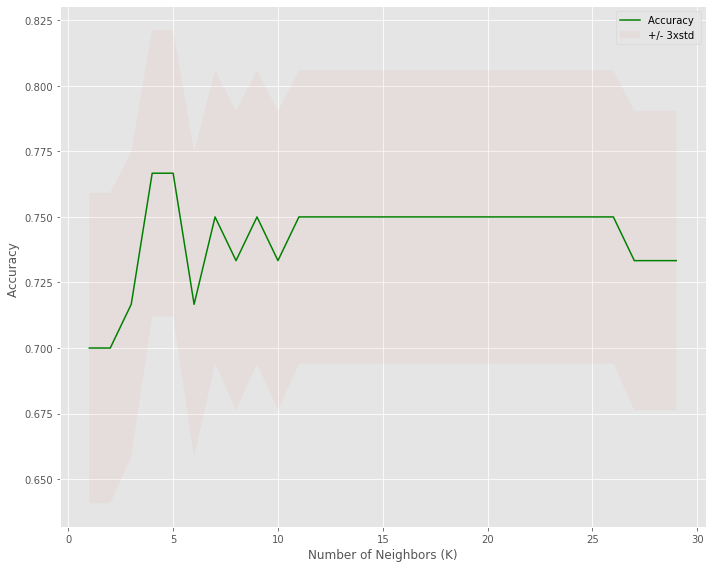

The best out of sample accuracy is 0.7666666666666667 reached when k= 4


In [137]:
plt.figure (figsize = (10,8))
plt.plot(range(1,Kspop),mean_accpop,'g')
plt.fill_between(range(1,Kspop),mean_accpop - 1 * std_accpop,mean_accpop + 1 * std_accpop, alpha=0.05)
plt.legend(('Accuracy ', '+/- 3xstd'))
plt.ylabel('Accuracy ')
plt.xlabel('Number of Neighbors (K)')
plt.tight_layout()
plt.show()
print( "The best out of sample accuracy is", mean_accpop.max(), "reached when k=", mean_accpop.argmax()+1) 

In [138]:
kpop = mean_accpop.argmax()+1
neighpop = KNeighborsClassifier(n_neighbors = kpop, algorithm = 'auto', weights = 'distance')
neighpop.fit(X_trainpop,Y_trainpop)
yhatknnpop = neighpop.predict(X_testpop)

                     precision    recall  f1-score   support

     Bin1(0-184218)       0.83      0.90      0.86        42
Bin2(184218-368436)       0.58      0.47      0.52        15
Bin3(368436-552655)       0.50      0.50      0.50         2
Bin4(552655-736873)       0.00      0.00      0.00         1

          micro avg       0.77      0.77      0.77        60
          macro avg       0.48      0.47      0.47        60
       weighted avg       0.74      0.77      0.75        60

Normalized confusion matrix


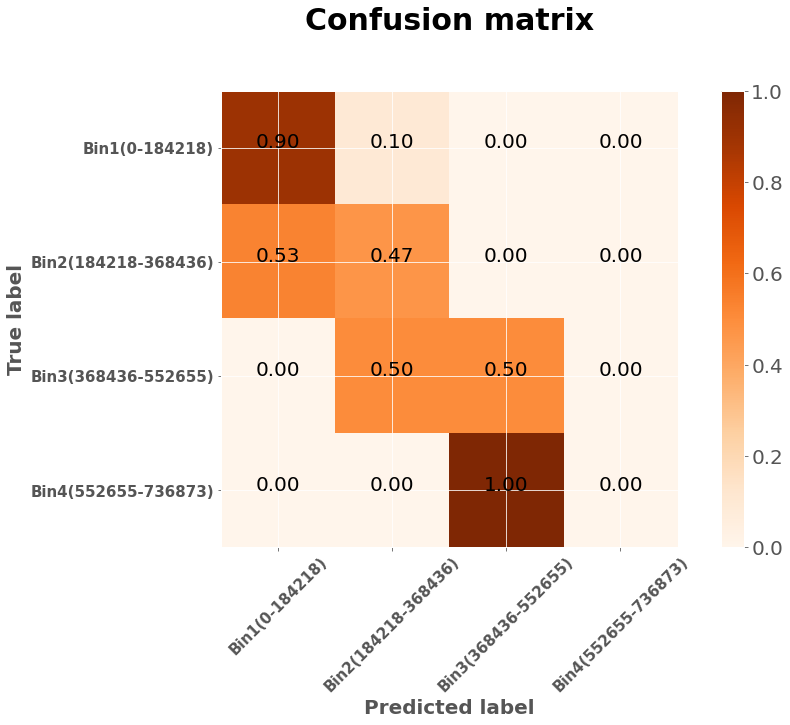

In [139]:
knnmatrixpop = confusion_matrix(Y_testpop, yhatknnpop, labels = np.array(list((set(Y_testpop.values)))))
np.set_printoptions(precision=2)
print (classification_report(Y_testpop, yhatknnpop))
# Plot non-normalized confusion matrix
plt.figure(figsize = [14,10])
plot_confusion_matrix(knnmatrixpop, classes=np.array(list((set(Y_testpop.values)))),normalize=True,  title='Confusion matrix')

In [140]:
KNNPrecision = []
KNNRecall = []
TestSize = []
Neighbors = []
for i in np.arange(10, 70):
    X_trainpopprecall, X_testpopprecall, Y_trainpopprecall, Y_testpopprecall = train_test_split(Xpop, Ypop, test_size=i/100)
    knnprecision = KNeighborsClassifier(n_neighbors = 4, weights = 'distance')
    knnprecision.fit(X_trainpopprecall, Y_trainpopprecall)
    KNNPscore = precision_score(Y_testpopprecall, knnprecision.predict(X_testpopprecall), average = 'weighted')
    KNNRc = recall_score(Y_testpopprecall, knnprecision.predict(X_testpopprecall), average = 'weighted')
    KNNPrecision.append(KNNPscore)
    KNNRecall.append(KNNRc)
    TestSize.append(i/100)

In [141]:
KNNPrecision = pd.DataFrame(KNNPrecision).rename(columns = {0:'Precision'})
KNNRecall = pd.DataFrame(KNNRecall).rename(columns = {0:'Recall'})
KNNPCcurve = KNNPrecision.join(KNNRecall)
KNNPCcurve['Test Size'] = TestSize
KNNPCcurve.sort_values(by = 'Recall', ascending = False).head(5)

,Precision,Recall,Test Size
4,0.847101,0.850000,0.14
21,0.829191,0.825758,0.31
6,0.814177,0.823529,0.16
15,0.795725,0.820755,0.25
10,0.798099,0.811765,0.20


**Decision Tree**

We repeat the processes for the DT Model

DT requires the following hyperparameters:

    Criterion: Select from 'Gini' and 'Entropy'
    Max_depth: Select from a range 

In [ ]:
dtparampop = [{'criterion': ['gini'], 'max_depth': np.arange(1,100)},
                    {'criterion': ['entropy'], 'max_depth': np.arange(1,100)}]
DTpopmodel= DecisionTreeClassifier()
GridDTpop = GridSearchCV(DTpopmodel, dtparampop, cv=4)
GridDTpop.fit(Xpop, Ypop)
BestRRDTpop=GridDTpop.best_params_
BestRRDTpop

**Grid Search Results**

Criterion: Gini
Max_Depth: 28 (Max Depth changes with each run)

In [143]:
inmaxdspop = 100
inmean_acc_dtpop = np.zeros((inmaxdspop-1))
instd_acc_dtpop = np.zeros((inmaxdspop-1))
inConfustionMxDTpop = [];
for n in range(1,inmaxdspop):
    inukTreepopconf = DecisionTreeClassifier(criterion="gini", max_depth = n).fit(X_trainpop,Y_trainpop) 
    inyhat_dtpop=inukTreepopconf.predict(X_trainpop)
    inmean_acc_dtpop[n-1] = metrics.accuracy_score(Y_trainpop, inyhat_dtpop)
    instd_acc_dtpop[n-1]=np.std(inyhat_dtpop==Y_trainpop)/np.sqrt(inyhat_dtpop.shape[0])

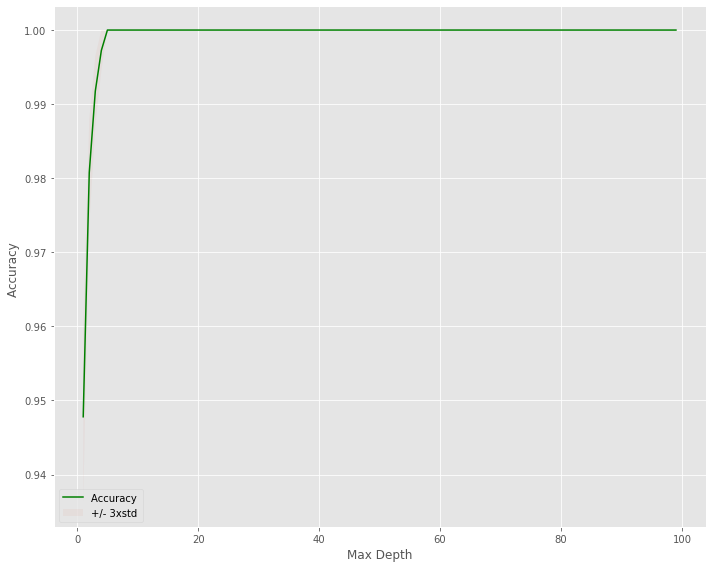

The best in-sample accuracy is 1.0  reached when max depth 5


In [144]:
plt.figure(figsize = (10,8))
plt.plot(range(1,inmaxdspop),inmean_acc_dtpop,'g')
plt.fill_between(range(1,inmaxdspop),inmean_acc_dtpop - 1 * instd_acc_dtpop,inmean_acc_dtpop + 1 * instd_acc_dtpop, alpha=0.05)
plt.legend(('Accuracy ', '+/- 3xstd'))
plt.ylabel('Accuracy ')
plt.xlabel('Max Depth')
plt.tight_layout()
plt.show()
print( "The best in-sample accuracy is", inmean_acc_dtpop.max(), " reached when max depth",  inmean_acc_dtpop.argmax()+1)

In [145]:
inkpopdt = inmean_acc_dtpop.argmax()+1
inukTreepop = DecisionTreeClassifier(criterion="gini", max_depth = inkpopdt)
inukTreepop.fit(Xpop,Ypop)
inyhatDTpop = inukTreepop.predict(Xpop)

In [146]:
maxdspop = 100
mean_acc_dtpop = np.zeros((maxdspop-1))
std_acc_dtpop = np.zeros((maxdspop-1))
ConfustionMxDTpop = [];
for n in range(1,maxdspop):
    ukTreepopconf = DecisionTreeClassifier(criterion="gini", max_depth = n).fit(X_trainpop,Y_trainpop) #X_train, Y_train
    yhat_dtpop=ukTreepopconf.predict(X_testpop)
    mean_acc_dtpop[n-1] = metrics.accuracy_score(Y_testpop, yhat_dtpop)
    std_acc_dtpop[n-1]=np.std(yhat_dtpop==Y_testpop)/np.sqrt(yhat_dtpop.shape[0])

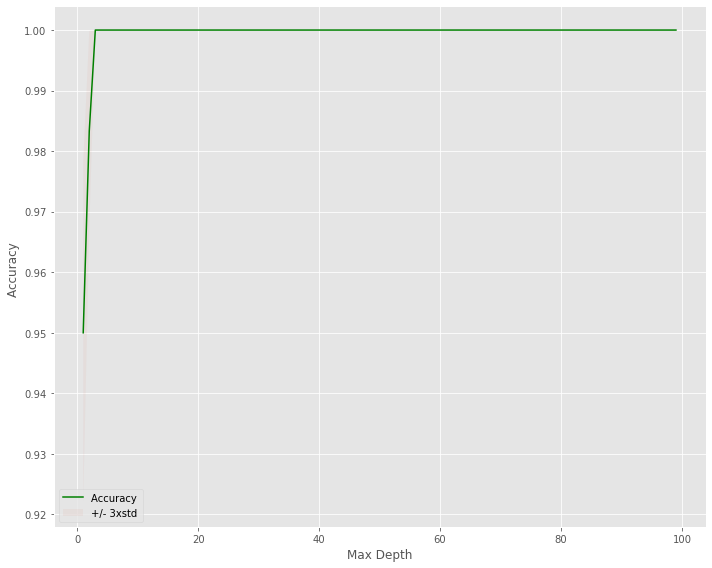

The best out of sample accuracy is 1.0 reached when max depth 3


In [147]:
plt.figure(figsize = (10,8))
plt.plot(range(1,maxdspop),mean_acc_dtpop,'g')
plt.fill_between(range(1,maxdspop),mean_acc_dtpop - 1 * std_acc_dtpop,mean_acc_dtpop + 1 * std_acc_dtpop, alpha=0.05)
plt.legend(('Accuracy ', '+/- 3xstd'))
plt.ylabel('Accuracy ')
plt.xlabel('Max Depth')
plt.tight_layout()
plt.show()
print( "The best out of sample accuracy is", mean_acc_dtpop.max(), "reached when max depth",  mean_acc_dtpop.argmax()+1)

In [148]:
kpopdt = mean_acc_dtpop.argmax()+1
ukTreepop = DecisionTreeClassifier(criterion="gini", max_depth = kpopdt)
ukTreepop.fit(X_trainpop,Y_trainpop)
yhatDTpop = ukTreepop.predict(X_testpop)

**Plot Decision Tree**

Below is the decision tree for the training model: **Test size = 14%**

As we can see, the splitting feature is solely population. The decision criterion is quite accurate. E.g. for the root node, the decision criterion is whether the normalized population is <0.166

If we inverse-normalize **0.166** by multiplying by the maximum population **1105310**, we get **183481.46**

**So all towns with a Population less than 183482 will be assigned to Bin 1. Bin 1 is populations between 0 and 184218 so this is a really good fit.**

For the next node, all towns with a Population less than 368,068 will be assigned to Bin 2 and so it follows for each node. This model is very accurate for the training set, however there is a problem because **there is no criteria to classify towns into Bins 5 and 6.** One of the leaf nodes has an entropy of 1.459, i.e. it is impure. 6 samples, 3 of which are not in Bin 4 are assigned to Bin 4 according to the model. **Therefore, when predicting on the test data, if there are towns which are supposed to be in Bins 5 and 6, class assignment will fail as they will be assigned to Bin 4**

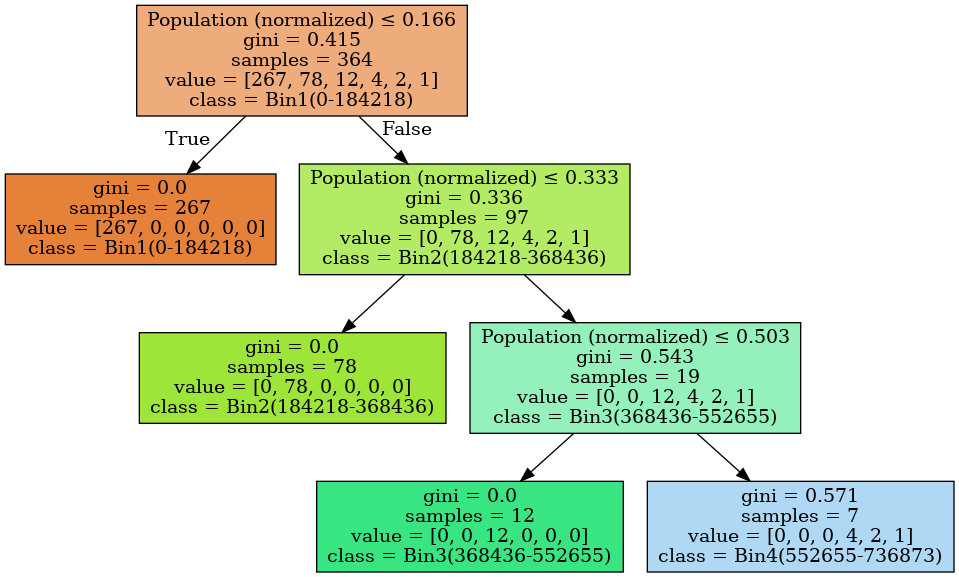

In [149]:
dot_datapop = StringIO()
featureNamespop = Xpop.columns[0:18]
outpop=tree.export_graphviz(ukTreepop,feature_names=featureNamespop, out_file=dot_datapop, class_names= np.unique(Y_trainpop.astype(str)).tolist(), filled=True,  special_characters=True,rotate=False)  
graphpop = pydotplus.graph_from_dot_data(dot_datapop.getvalue())  
Image(graphpop.create_png(), retina = True)

**This is the decision tree for the Ideal Model**

The ideal Model identifies a splitting feature for Bins 5 and 6 which looks spurious as it has nothing to do with population. It appears the algorithm lacks the ability to learn this relationship because they are too few samples for it to rely soley on the population feature to make the class determination. However, this feature may still achieve accurate prediction

In [ ]:
dot_dataGridpop = StringIO()
featureNamesGridpop = Xpop.columns #[0:18]
outGridcluster=tree.export_graphviz(GridDTpop.best_estimator_,feature_names=featureNamesGridpop, out_file=dot_dataGridpop, class_names= np.unique(Ypop.astype(str)).tolist(), filled=True,  special_characters=True,rotate=False)  
graphGridpop = pydotplus.graph_from_dot_data(dot_dataGridpop.getvalue())  
Image(graphGridpop.create_png(), retina = True)

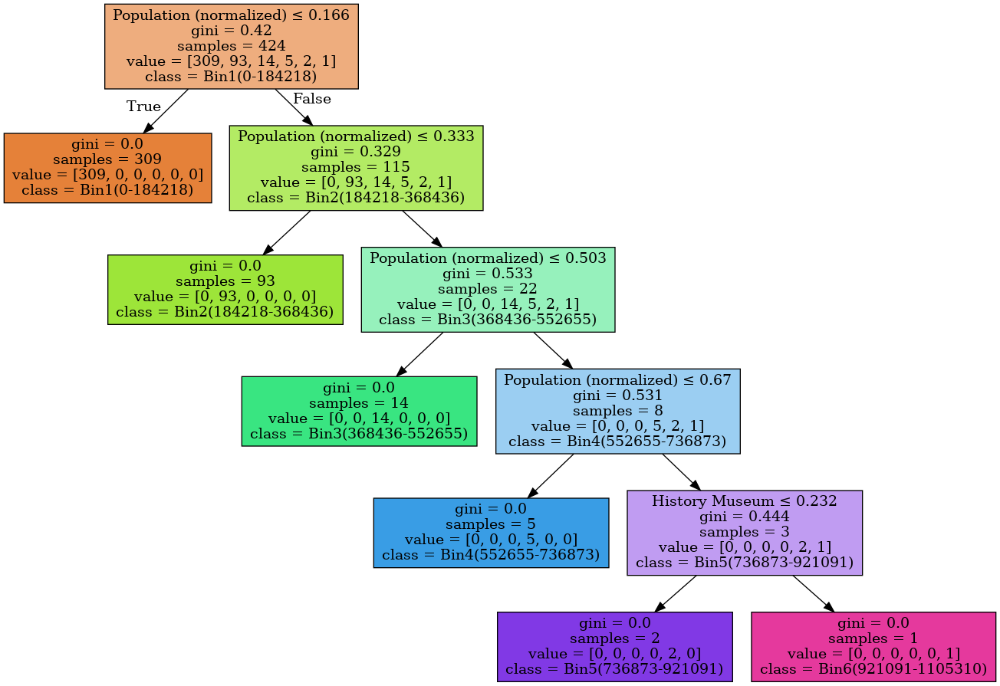

In [150]:
IM.open('IdealDT_Pop.png')

**Confusion Matrix**

                     precision    recall  f1-score   support

     Bin1(0-184218)       1.00      1.00      1.00        42
Bin2(184218-368436)       1.00      1.00      1.00        15
Bin3(368436-552655)       1.00      1.00      1.00         2
Bin4(552655-736873)       1.00      1.00      1.00         1

          micro avg       1.00      1.00      1.00        60
          macro avg       1.00      1.00      1.00        60
       weighted avg       1.00      1.00      1.00        60

Normalized confusion matrix


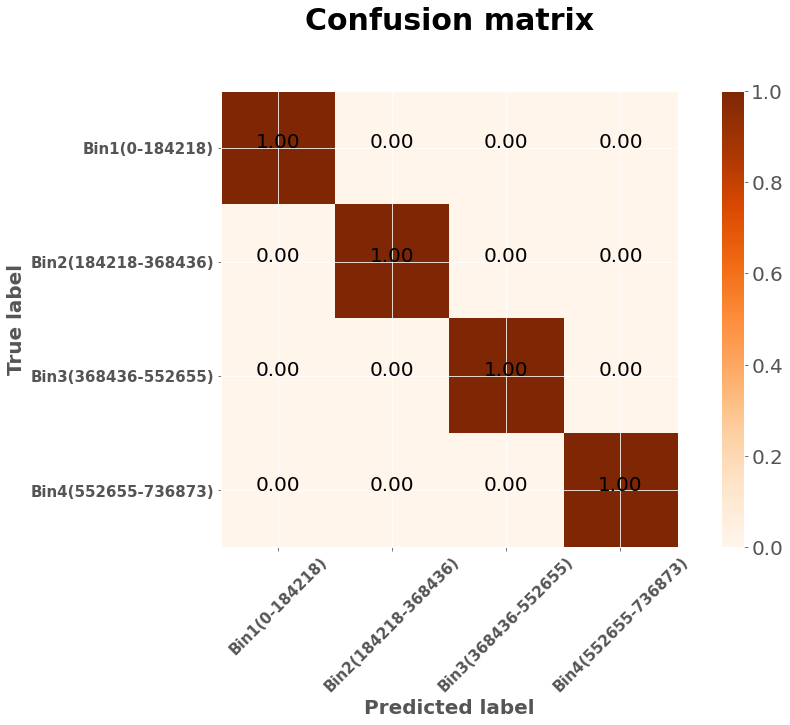

In [151]:
DTmatrixpop = confusion_matrix(Y_testpop, yhatDTpop, labels=np.array(list((set(Y_testpop.values)))))
np.set_printoptions(precision=2)
print (classification_report(Y_testpop, yhatDTpop))
# Plot non-normalized confusion matrix
plt.figure(figsize = [14,10])
plot_confusion_matrix(DTmatrixpop, classes=np.array(list((set(Y_testpop.values)))),normalize= True,  title='Confusion matrix')

In [152]:
DTPrecision = []
DTRecall = []
DTTestSize = []
for i in np.arange(10, 70):
    DTX_trainpopprecall, DTX_testpopprecall, DTY_trainpopprecall, DTY_testpopprecall = train_test_split(Xpop, Ypop, test_size=i/100)
    DTprecision = DecisionTreeClassifier(criterion="gini", max_depth = 22)
    DTprecision.fit(DTX_trainpopprecall, DTY_trainpopprecall)
    DTPscore = precision_score(DTY_testpopprecall, DTprecision.predict(DTX_testpopprecall), average = 'weighted')
    DTRc = recall_score(DTY_testpopprecall, DTprecision.predict(DTX_testpopprecall), average = 'weighted')
    DTPrecision.append(DTPscore)
    DTRecall.append(DTRc)
    DTTestSize.append(i/100)

In [153]:
DTPrecision = pd.DataFrame(DTPrecision).rename(columns = {0:'Precision'})
DTRecall = pd.DataFrame(DTRecall).rename(columns = {0:'Recall'})
DTPCcurve = DTPrecision.join(DTRecall)
DTPCcurve['Test Size'] = DTTestSize
DTPCcurve.sort_values(by = 'Recall', ascending = False).head(5)

,Precision,Recall,Test Size
10,1.000000,1.000000,0.20
4,1.000000,1.000000,0.14
6,1.000000,1.000000,0.16
21,1.000000,1.000000,0.31
42,0.995569,0.995475,0.52


**Random Forest** 

We repeat the processes for the RF Model

DT requires the following hyperparameters:

    Criterion: Select from 'Gini' and 'Entropy'
    N_estimators: Select from a range e.g. 1 to 19
    Max_Depth: Select from a range e.g. 1 to 14
    Max_Features: Select from 'auto', 'sqrt', 'log2'


In [ ]:

rfparampop = [{'criterion': ['gini', 'entropy'], 'n_estimators': np.arange(1,20), 'max_depth': np.arange(1, 15), 'max_features': ['auto', 'sqrt', 'log2']},
                    {'criterion': ['entropy'], 'n_estimators': np.arange(1,20), 'max_depth': np.arange(1,15), 'max_features': ['auto', 'sqrt', 'log2']}]
RFpopmodel= RandomForestClassifier()
GridRFpop = GridSearchCV(RFpopmodel, rfparampop, cv=4)
GridRFpop.fit(Xpop, Ypop)
BestRRRFpop=GridRFpop.best_params_
BestRRRFpop

**Grid Search Results**

    The parameters change a bit each time its run. One instance gives the following parameters:
    
        Criterion: Gini
        Max Depth: 9
        Max Features: sqrt
        N_Estimators: 11

In [154]:
inmaxestimatorpop  = 50
inmean_acc_rfpop = np.zeros((inmaxestimatorpop-1))
instd_acc_rfpop = np.zeros((inmaxestimatorpop-1))
inConfustionMxRFpop = [];
for n in range(1,inmaxestimatorpop):
    inukRFpopconf = RandomForestClassifier(n_estimators=n, criterion = 'gini', max_depth = 11, max_features = 'sqrt', random_state = 1).fit(X_trainpop,Y_trainpop) #X_train, Y_train
    inyhat_rfpop=inukRFpopconf.predict(X_trainpop)
    inmean_acc_rfpop[n-1] = metrics.accuracy_score(Y_trainpop, inyhat_rfpop)
    instd_acc_rfpop[n-1]=np.std(inyhat_rfpop==Y_trainpop)/np.sqrt(inyhat_rfpop.shape[0])

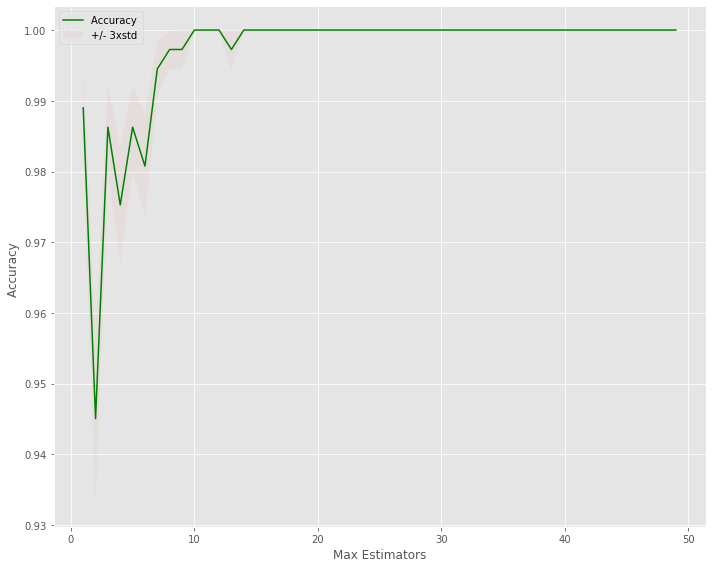

The best in-sample accuracy is 1.0 reached when # of estimators 10


In [155]:
plt.figure(figsize = (10,8))
plt.plot(range(1,inmaxestimatorpop),inmean_acc_rfpop,'g')
plt.fill_between(range(1,inmaxestimatorpop),inmean_acc_rfpop - 1 * instd_acc_rfpop,inmean_acc_rfpop + 1 * instd_acc_rfpop, alpha=0.05)
plt.legend(('Accuracy ', '+/- 3xstd'))
plt.ylabel('Accuracy ')
plt.xlabel('Max Estimators')
plt.tight_layout()
plt.show()
print( "The best in-sample accuracy is", inmean_acc_rfpop.max(), "reached when # of estimators",  inmean_acc_rfpop.argmax()+1)

In [156]:
inRFpopestimators =  inmean_acc_rfpop.argmax()+1
inRFpop =RandomForestClassifier( n_estimators= inRFpopestimators, criterion = 'gini', max_depth = 11, max_features = 'sqrt', random_state = 1)
inRFpop.fit(Xpop, Ypop)
inyhatRFpop = inRFpop.predict(Xpop)

In [157]:
maxestimatorpop  = 20
mean_acc_rfpop = np.zeros((maxestimatorpop-1))
std_acc_rfpop = np.zeros((maxestimatorpop-1))
ConfustionMxRFpop = [];
for n in range(1,maxestimatorpop):
    ukRFpopconf = RandomForestClassifier(n_estimators=n, criterion = 'gini', max_depth = 11, max_features = 'sqrt', random_state = 1).fit(X_trainpop,Y_trainpop) #X_train, Y_train
    yhat_rfpop=ukRFpopconf.predict(X_testpop)
    mean_acc_rfpop[n-1] = metrics.accuracy_score(Y_testpop, yhat_rfpop)
    std_acc_rfpop[n-1]=np.std(yhat_rfpop==Y_testpop)/np.sqrt(yhat_rfpop.shape[0])

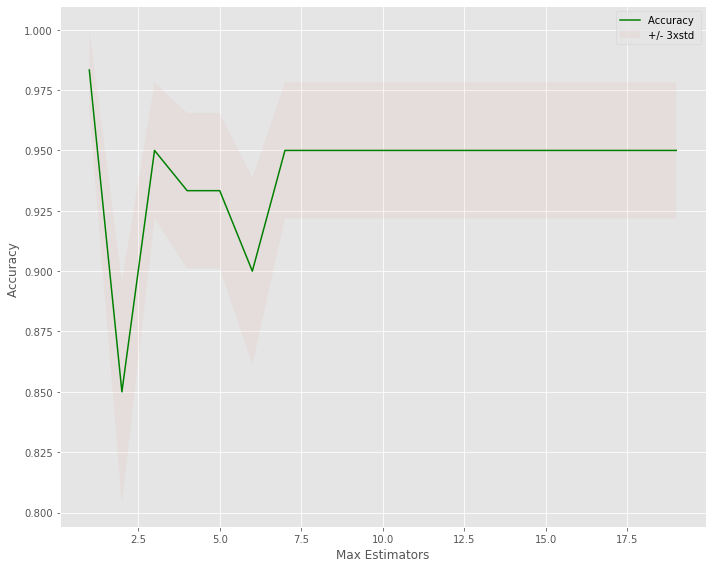

The best out-of sample accuracy is 0.9833333333333333 reached when # of estimators 1


In [158]:
plt.figure(figsize = (10,8))
plt.plot(range(1,maxestimatorpop),mean_acc_rfpop,'g')
plt.fill_between(range(1,maxestimatorpop),mean_acc_rfpop - 1 * std_acc_rfpop,mean_acc_rfpop + 1 * std_acc_rfpop, alpha=0.05)
plt.legend(('Accuracy ', '+/- 3xstd'))
plt.ylabel('Accuracy ')
plt.xlabel('Max Estimators')
plt.tight_layout()
plt.show()
print( "The best out-of sample accuracy is", mean_acc_rfpop.max(), "reached when # of estimators",  mean_acc_rfpop.argmax()+1)

In [159]:
RFpopestimators = mean_acc_rfpop.argmax()+1
RFpop =RandomForestClassifier(n_estimators=RFpopestimators, criterion = 'gini', max_depth = 11, max_features = 'sqrt', random_state = 6)
RFpop.fit(X_trainpop, Y_trainpop)
yhatRFpop = RFpop.predict(X_testpop)

**Confusion Matrix**

                     precision    recall  f1-score   support

     Bin1(0-184218)       1.00      1.00      1.00        42
Bin2(184218-368436)       0.92      0.80      0.86        15
Bin3(368436-552655)       0.25      0.50      0.33         2
Bin4(552655-736873)       0.00      0.00      0.00         1

          micro avg       0.92      0.92      0.92        60
          macro avg       0.54      0.57      0.55        60
       weighted avg       0.94      0.92      0.93        60

Normalized confusion matrix


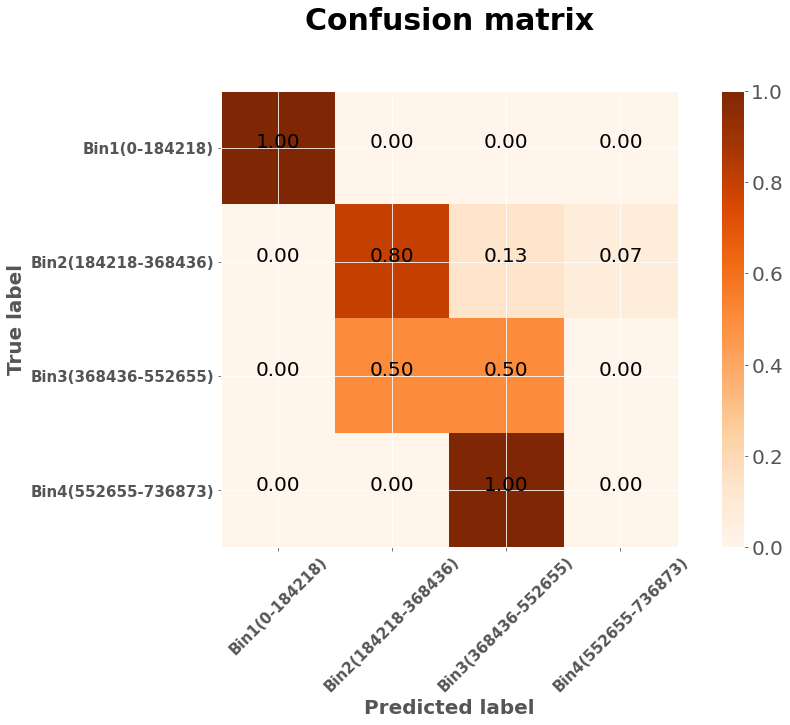

In [160]:
rfmatrixpop= confusion_matrix(Y_testpop, yhatRFpop, labels=np.array(list((set(Y_testpop.values)))))
np.set_printoptions(precision=2)
print (classification_report(Y_testpop, yhatRFpop))
# Plot non-normalized confusion matrix
plt.figure(figsize = [14,10])
plot_confusion_matrix(rfmatrixpop, classes=np.array(list((set(Y_testpop.values)))),normalize= True,  title='Confusion matrix')

In [161]:
RFPrecision = []
RFRecall = []
RFTestSize = []
for i in np.arange(10, 70):
    RFX_trainpopprecall, RFX_testpopprecall, RFY_trainpopprecall, RFY_testpopprecall = train_test_split(Xpop, Ypop, test_size=i/100, random_state=0)
    RFprecision = RandomForestClassifier(n_estimators=18, criterion = 'gini', max_depth = 11, max_features = 'sqrt', random_state = 1)
    RFprecision.fit(RFX_trainpopprecall, RFY_trainpopprecall)
    RFPscore = precision_score(RFY_testpopprecall, RFprecision.predict(RFX_testpopprecall), average = 'weighted')
    RFRc = recall_score(RFY_testpopprecall, RFprecision.predict(RFX_testpopprecall), average = 'weighted')
    RFPrecision.append(RFPscore)
    RFRecall.append(RFRc)
    RFTestSize.append(i/100)

In [162]:
RFPrecision = pd.DataFrame(RFPrecision).rename(columns = {0:'Precision'})
RFRecall = pd.DataFrame(RFRecall).rename(columns = {0:'Recall'})
RFPCcurve = RFPrecision.join(RFRecall)
RFPCcurve['Test Size'] = RFTestSize
RFPCcurve.sort_values(by = 'Recall', ascending = False).head(5)

,Precision,Recall,Test Size
3,0.973214,0.982143,0.13
1,0.968085,0.978723,0.11
14,0.952549,0.970588,0.24
12,0.957595,0.968085,0.22
11,0.946561,0.966667,0.21


**Evaluation**

Predictions are made according to the various scenarios mentioned earlier.

In [ ]:
EV = ['Full Dataset (Pop)',
      'Training Set  (Pop)', 
      'Test Set  (Pop)', 
      'Cross Evaluation (Pop)',
        'Ideal Model from Grid Search (Pop)']
crossvalsvmpop = Gridsvm.best_estimator_
crossvalneighpop = GridKNNpop.best_estimator_
crossvaldtpop = GridDTpop.best_estimator_
crossvalrfpop = GridRFpop.best_estimator_

KNN = [metrics.accuracy_score(Ypop, inneighpop.predict(Xpop)),
metrics.accuracy_score(Y_trainpop, neighpop.predict(X_trainpop)),
metrics.accuracy_score(Y_testpop, yhatknnpop),
cross_val_score(crossvalneighpop, Xpop, Ypop, cv=4).mean(),
GridKNNpop.best_estimator_.score(Xpop, Ypop)]


KNNF1 = [f1_score(Ypop, inneighpop.predict(Xpop), average = 'weighted'),
f1_score(Y_trainpop, neighpop.predict(X_trainpop), average = 'weighted'),
f1_score(Y_testpop, yhatknnpop, average = 'weighted')]

KNNRC = [recall_score(Ypop, inneighpop.predict(Xpop), average = 'weighted'),
recall_score(Y_trainpop, neighpop.predict(X_trainpop), average = 'weighted'),
recall_score(Y_testpop, yhatknnpop, average = 'weighted')]

KNNPS = [precision_score(Ypop, inneighpop.predict(Xpop), average = 'weighted'),
precision_score(Y_trainpop, neighpop.predict(X_trainpop), average = 'weighted'),
precision_score(Y_testpop, yhatknnpop, average = 'weighted')]

SVM = [metrics.accuracy_score(Ypop, SVMpop.fit(Xpop, Ypop).predict(Xpop)),
metrics.accuracy_score(Y_trainpop, SVMpop.predict(X_trainpop)),
metrics.accuracy_score(Y_testpop, yhatSVMpop),
cross_val_score(crossvalsvmpop, Xpop, Ypop, cv=4).mean(),
Gridsvm.best_estimator_.score(Xpop, Ypop)]


SVMF1 = [f1_score(Ypop, SVMpop.fit(Xpop, Ypop).predict(Xpop), average = 'weighted'),
f1_score(Y_trainpop, SVMpop.predict(X_trainpop), average = 'weighted'),
f1_score(Y_testpop, yhatSVMpop, average = 'weighted')]

SVMRC = [recall_score(Ypop, SVMpop.fit(Xpop, Ypop).predict(Xpop), average = 'weighted'),
recall_score(Y_trainpop, SVMpop.predict(X_trainpop), average = 'weighted'),
recall_score(Y_testpop, yhatSVMpop, average = 'weighted')]

SVMPS = [precision_score(Ypop, SVMpop.fit(Xpop, Ypop).predict(Xpop), average = 'weighted'),
precision_score(Y_trainpop, SVMpop.predict(X_trainpop), average = 'weighted'),
precision_score(Y_testpop, yhatSVMpop, average = 'weighted')]

DT = [metrics.accuracy_score(Ypop, inukTreepop.predict(Xpop)),
metrics.accuracy_score(Y_trainpop, ukTreepop.predict(X_trainpop)),
metrics.accuracy_score(Y_testpop, yhatDTpop),
cross_val_score(crossvaldtpop, Xpop, Ypop, cv=4).mean(),
GridDTpop.best_estimator_.score(Xpop, Ypop)]

DTF1 = [f1_score(Ypop, inukTreepop.predict(Xpop), average = 'weighted'),
f1_score(Y_trainpop, ukTreepop.predict(X_trainpop), average = 'weighted'),
f1_score(Y_testpop, yhatDTpop, average = 'weighted')
]

DTRC = [recall_score(Ypop, inukTreepop.predict(Xpop), average = 'weighted'),
recall_score(Y_trainpop, ukTreepop.predict(X_trainpop), average = 'weighted'),
recall_score(Y_testpop, yhatDTpop, average = 'weighted')
]

DTPS = [precision_score(Ypop, inukTreepop.predict(Xpop), average = 'weighted'),
precision_score(Y_trainpop, ukTreepop.predict(X_trainpop), average = 'weighted'),
precision_score(Y_testpop, yhatDTpop, average = 'weighted')
]

RF = [metrics.accuracy_score(Ypop, inRFpop.predict(Xpop)),
metrics.accuracy_score(Y_trainpop, RFpop.predict(X_trainpop)),
metrics.accuracy_score(Y_testpop, yhatRFpop),
cross_val_score(crossvalrfpop, Xpop, Ypop, cv=4).mean(),
GridRFpop.best_estimator_.score(Xpop, Ypop)]

RFF1 = [f1_score(Ypop, inRFpop.predict(Xpop), average = 'weighted'),
f1_score(Y_trainpop, RFpop.predict(X_trainpop), average = 'weighted'),
f1_score(Y_testpop, yhatRFpop, average = 'weighted')
]

RFRC = [recall_score(Ypop, inRFpop.predict(Xpop), average = 'weighted'),
recall_score(Y_trainpop, RFpop.predict(X_trainpop), average = 'weighted'),
recall_score(Y_testpop, yhatRFpop, average = 'weighted')
]

RFPS = [precision_score(Ypop, inRFpop.predict(Xpop), average = 'weighted'),
precision_score(Y_trainpop, RFpop.predict(X_trainpop), average = 'weighted'),
precision_score(Y_testpop, yhatRFpop, average = 'weighted')
]

In [ ]:
evaluation_classification  = pd.DataFrame()
for i in np.arange(0,len(KNN)):
    ev, k, sv, dt, rf = EV[i], KNN[i],  SVM[i], DT[i], RF[i]
    evaluation_classification.loc[i, 'Population Bins Metric'] = ev
    evaluation_classification.loc[i, 'KNN Accuracy Score'] = k
    evaluation_classification.loc[i, 'SVM Accuracy Score'] = sv
    evaluation_classification.loc[i, 'DT Accuracy Score'] = dt
    evaluation_classification.loc[i, 'RF Accuracy Score'] = rf
for j in np.arange(0, len(KNNF1)):
    kf1, svf1, dtf1, rff1 = KNNF1[j], SVMF1[j], DTF1[j], RFF1[j]
    evaluation_classification.loc[j, 'KNN_F1 Score'] = kf1
    evaluation_classification.loc[j, 'SVM_F1 Score'] = svf1
    evaluation_classification.loc[j, 'DT_F1 Score'] = dtf1
    evaluation_classification.loc[j, 'RF_F1 Score'] = rff1
for k in np.arange(0, len(KNNRC)):
    krc, svrc, dtrc, rfrc = KNNRC[k], SVMRC[k], DTRC[k], RFRC[k]
    evaluation_classification.loc[k, 'KNN_Recall'] = krc
    evaluation_classification.loc[k, 'SVM_Recall'] = svrc
    evaluation_classification.loc[k, 'DT_Recall'] = dtrc
    evaluation_classification.loc[k, 'RF_Recall'] = rfrc
for l in np.arange(0, len(KNNRC)):
    kps, svps, dtps, rfps = KNNPS[l], SVMPS[l], DTPS[l], RFPS[l]
    evaluation_classification.loc[l, 'KNN_Precision'] = kps
    evaluation_classification.loc[l, 'SVM_Precision'] = svps
    evaluation_classification.loc[l, 'DT_Precision'] = dtps
    evaluation_classification.loc[l, 'RF_Precision'] = rfps
    
evaluation_classification = evaluation_classification.set_index('Population Bins Metric')
evaluation_scores = ['KNN Accuracy Score', 'KNN_F1 Score', 'KNN_Recall', 'KNN_Precision','SVM Accuracy Score', 'SVM_F1 Score', 'SVM_Recall', 'SVM_Precision', 'DT Accuracy Score', 'DT_F1 Score', 'DT_Recall', 'DT_Precision', 'RF Accuracy Score', 'RF_F1 Score', 'RF_Recall', 'RF_Precision']
evaluation_classification[evaluation_scores].round(5)
evaluation_classification.to_csv('Evaluation_Popclasses.csv')

In [163]:
evaluation_classification = pd.read_csv('Evaluation_Popclasses.csv')
evaluation_classification.set_index('Population Bins Metric', inplace = True)
evaluation_scores = ['KNN Accuracy Score', 'KNN_F1 Score', 'KNN_Recall', 'KNN_Precision','SVM Accuracy Score', 'SVM_F1 Score', 'SVM_Recall', 'SVM_Precision', 'DT Accuracy Score', 'DT_F1 Score', 'DT_Recall', 'DT_Precision', 'RF Accuracy Score', 'RF_F1 Score', 'RF_Recall', 'RF_Precision']
evaluation_classification[evaluation_scores].round(5)

,KNN Accuracy Score,KNN_F1 Score,KNN_Recall,KNN_Precision,SVM Accuracy Score,SVM_F1 Score,SVM_Recall,SVM_Precision,DT Accuracy Score,DT_F1 Score,DT_Recall,DT_Precision,RF Accuracy Score,RF_F1 Score,RF_Recall,RF_Precision
Population Bins Metric,,,,,,,,,,,,,,,,
Full Dataset (Pop),1.00000,1.00000,1.00000,1.00000,0.99057,0.99049,0.99057,0.99058,1.00000,1.00000,1.00000,1.00000,0.99764,0.99760,0.99764,0.99767
Training Set (Pop),1.00000,1.00000,1.00000,1.00000,0.98901,0.98890,0.98901,0.98903,0.99176,0.98876,0.99176,0.98705,0.97802,0.97885,0.97802,0.98397
Test Set (Pop),0.76667,0.75084,0.76667,0.74076,0.96667,0.96399,0.96667,0.96705,1.00000,1.00000,1.00000,1.00000,0.91667,0.92540,0.91667,0.93910
Cross Evaluation (Pop),0.79532,NaN,NaN,NaN,0.92951,NaN,NaN,NaN,0.98846,NaN,NaN,NaN,0.94865,NaN,NaN,NaN
Ideal Model from Grid Search (Pop),1.00000,NaN,NaN,NaN,0.98113,NaN,NaN,NaN,1.00000,NaN,NaN,NaN,1.00000,NaN,NaN,NaN


All the models have excellent in-sample and out-of-sample performance except KNN, which has good but not excellent out-of-sample performance. KNN just selects the optimum number of classified points within the neighborhood of an unclassified point that will generate the correct prediction while the other algorithms, determine the relationship between features and classes and this may be why it has weaker performance

**Classification with K-Means Cluster Labels**

All the processes for Population Bin Labels are repeated for K-Means

#### 

In [164]:
#Load Clustered Data
clusteredset = pd.read_csv('K-Means_ClusteredData.csv')  #load K-Means clustered data 
clusteredset = clusteredset.set_index('Town/Area')

In [165]:
Xcluster = clusteredset.copy()
Xcluster.drop(columns = ['Latitude', 'Longitude', 'Easting', 'Northing', 'Postcodes', 'Active postcodes', 'Population', 'Households', 'Households(normalized)', 'K-Means Cluster Labels', 'Town/Area.1', 'Pop-binned', 'Class'], inplace = True)
Xcluster = Xcluster[['Theater', 'Pub', 'Restaurant', 'Coffee Shop', 'Museum', 'Park', 'Indian Restaurant', 'Movie Theater', 'History Museum', 'Italian Restaurant', 'Grocery Store', 'Gastropub', 'Supermarket','Hotel', 'Scenic Lookout', 'Tea Room', 'Population (normalized)']]
Ycluster = pd.Series(np.array(clusteredset['K-Means Cluster Labels']))
Ycluster.index = Xcluster.index
X_traincluster, X_testcluster, Y_traincluster, Y_testcluster = train_test_split(Xcluster, Ycluster, test_size=0.25, random_state=0)

**SVM**

In [ ]:

svmparamcluster = tuned_parameters = [{'kernel': ['rbf'], 'gamma': [0.001, 0.0001, 'scale', 'auto'],
                    'C': np.arange(1,200)},
                    {'kernel': ['linear'], 'C': np.arange(1,200)}]
SVcluster=svm.SVC()
Gridsvmcluster = GridSearchCV(SVcluster, svmparamcluster, cv=4)
Gridsvmcluster.fit(Xcluster, Ycluster)
BestRRsvmcluster=Gridsvmcluster.best_params_
BestRRsvmcluster

**Grid Search Results:**
     
     C:62
     gamma: scale
     kernel: rbf

In [166]:
inmaxsvmcluster = 100
inmean_acc_svmcluster = np.zeros((inmaxsvmcluster-1))
instd_acc_svmcluster = np.zeros((inmaxsvmcluster-1))
inConfustionMxSVMcluster = [];
for n in range(1,inmaxsvmcluster):
    inSVMclusterconf = svm.SVC(kernel='rbf', C=n,  gamma = 'scale', random_state=1).fit(X_traincluster,Y_traincluster) #X_train, Y_train
    inyhat_svmcluster=inSVMclusterconf.predict(X_traincluster)
    inmean_acc_svmcluster[n-1] = metrics.accuracy_score(Y_traincluster, inyhat_svmcluster)
    instd_acc_svmcluster[n-1]=np.std(inyhat_svmcluster==Y_traincluster)/np.sqrt(inyhat_svmcluster.shape[0])

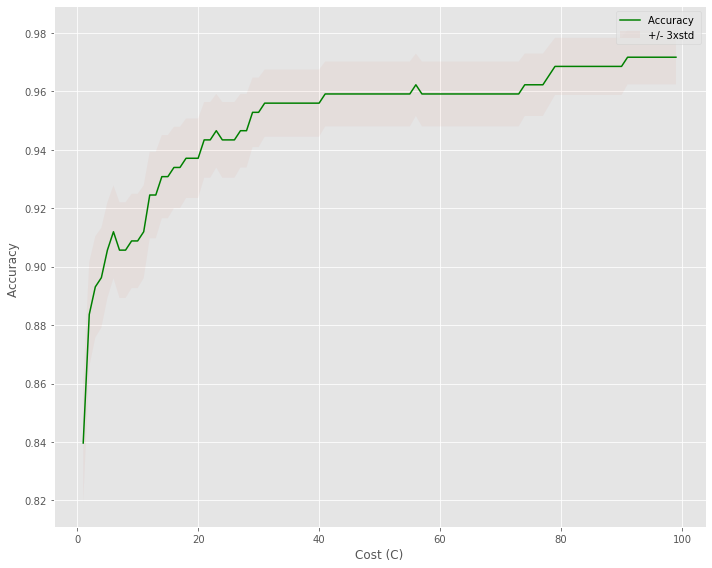

The best in-sample accuracy is 0.9716981132075472  with C = 91


In [167]:
plt.figure(figsize = (10,8))
plt.plot(range(1,inmaxsvmcluster),inmean_acc_svmcluster,'g')
plt.fill_between(range(1,inmaxsvmcluster),inmean_acc_svmcluster - 1 * instd_acc_svmcluster,inmean_acc_svmcluster + 1 * instd_acc_svmcluster, alpha=0.05)
plt.legend(('Accuracy ', '+/- 3xstd'))
plt.ylabel('Accuracy ')
plt.xlabel('Cost (C)')
plt.tight_layout()
plt.show()
print( "The best in-sample accuracy is", inmean_acc_svmcluster.max(), " with C =",  inmean_acc_svmcluster.argmax()+1)

In [168]:
inSVMcluster = inmean_acc_svmcluster.argmax()+1
inSVM = svm.SVC(kernel='rbf', C=inSVMcluster,  gamma = 'scale', random_state=1)
inSVM.fit(Xcluster,Ycluster)
inyhatSVM = inSVM.predict(Xcluster)

In [169]:
maxsvmcluster = 100
mean_acc_svmcluster = np.zeros((maxsvmcluster-1))
std_acc_svmcluster = np.zeros((maxsvmcluster-1))
ConfustionMxSVMcluster = [];
for n in range(1,maxsvmcluster):
    SVMclusterconf = svm.SVC(kernel='rbf', C=n,  gamma = 'scale', random_state=1).fit(X_traincluster,Y_traincluster) #X_train, Y_train
    yhat_svmcluster=SVMclusterconf.predict(X_testcluster)
    mean_acc_svmcluster[n-1] = metrics.accuracy_score(Y_testcluster, yhat_svmcluster)
    std_acc_svmcluster[n-1]=np.std(yhat_svmcluster==Y_testcluster)/np.sqrt(yhat_svmcluster.shape[0])

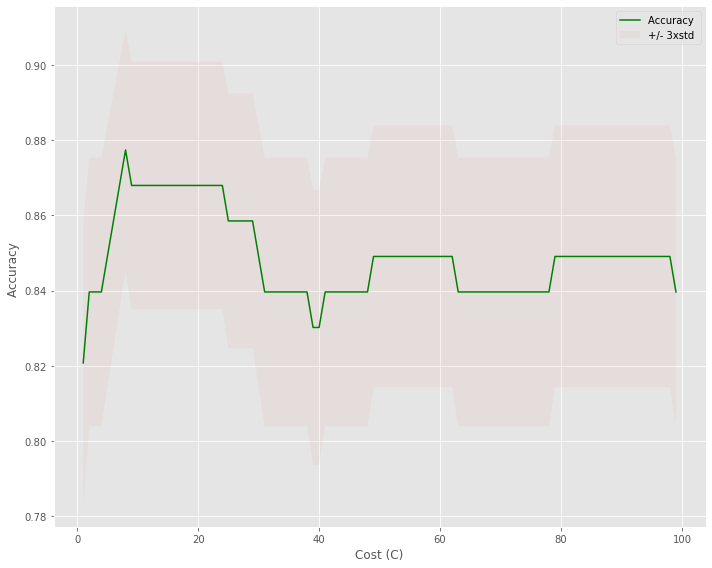

The best out-of-sample accuracy is 0.8773584905660378  with C =  8


In [170]:
plt.figure(figsize = (10,8))
plt.plot(range(1,maxsvmcluster),mean_acc_svmcluster,'g')
plt.fill_between(range(1,maxsvmcluster),mean_acc_svmcluster - 1 * std_acc_svmcluster,mean_acc_svmcluster + 1 * std_acc_svmcluster, alpha=0.05)
plt.legend(('Accuracy ', '+/- 3xstd'))
plt.ylabel('Accuracy ')
plt.xlabel('Cost (C)')
plt.tight_layout()
plt.show()
print( "The best out-of-sample accuracy is", mean_acc_svmcluster.max(), " with C = ",  mean_acc_svmcluster.argmax()+1)

In [171]:
SVMcluster = mean_acc_svmcluster.argmax()+1
SVM = svm.SVC(kernel='rbf', C=SVMcluster,  gamma = 'scale', random_state=1)
SVM.fit(X_traincluster, Y_traincluster)
# predict on training examples
yhatSVM = SVM.predict(X_testcluster)

**Confusion Matrix**

              precision    recall  f1-score   support

           0       0.75      0.78      0.77        23
           1       0.89      0.86      0.88        49
           2       1.00      1.00      1.00         5
           3       0.92      0.96      0.94        24
           4       1.00      1.00      1.00         5

   micro avg       0.88      0.88      0.88       106
   macro avg       0.91      0.92      0.92       106
weighted avg       0.88      0.88      0.88       106

Normalized confusion matrix


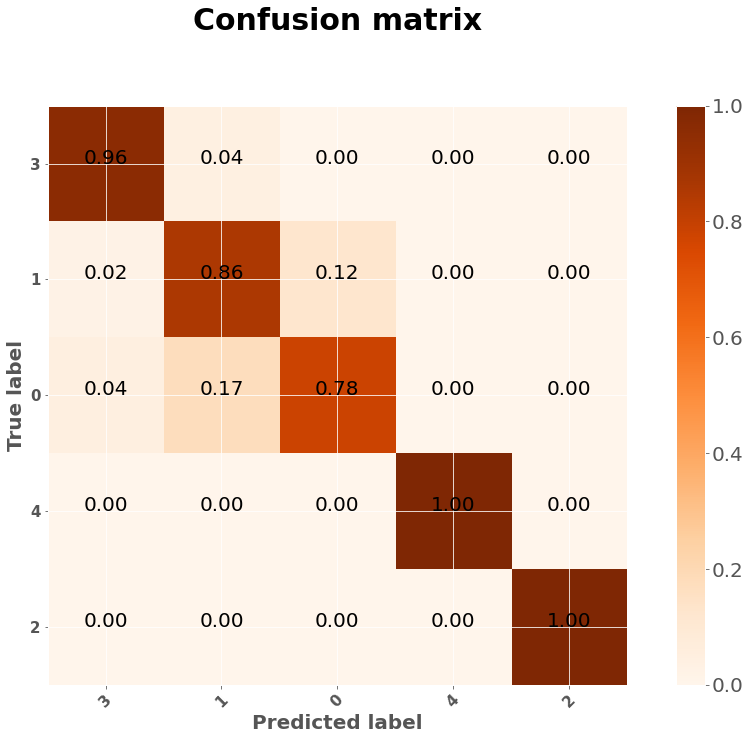

In [172]:
SVMmatrix = confusion_matrix(Y_testcluster, yhatSVM, labels=Ycluster.unique().astype(list))
np.set_printoptions(precision=2)
print (classification_report(Y_testcluster, yhatSVM))
# Plot non-normalized confusion matrix
plt.figure(figsize = [14,10])
plot_confusion_matrix(SVMmatrix, classes=Ycluster.unique().astype(list),normalize= True,  title='Confusion matrix')

In [173]:
svmclusterPrecision = []
svmclusterRecall = []
svmclusterTestsize = []
for i in np.arange(10, 70):
    svmX_trainclusterprecall, svmX_testclusterprecall, svmY_trainclusterprecall, svmY_testclusterprecall = train_test_split(Xcluster, Ycluster, test_size=i/100, random_state=0)
    svmclusterprecision =svm.SVC(kernel='rbf', C=62,  gamma = 'scale', random_state=1)
    svmclusterprecision.fit(svmX_trainclusterprecall, svmY_trainclusterprecall)
    svmclusterPscore = precision_score(svmY_testclusterprecall, svmclusterprecision.predict(svmX_testclusterprecall), average = 'weighted')
    svmclusterRc = recall_score(svmY_testclusterprecall, svmclusterprecision.predict(svmX_testclusterprecall), average = 'weighted')
    svmclusterPrecision.append(svmclusterPscore)
    svmclusterRecall.append(svmclusterRc)
    svmclusterTestsize.append(i/100)

In [174]:
svmclusterPrecision = pd.DataFrame(svmclusterPrecision).rename(columns = {0:'Precision'})
svmclusterRecall = pd.DataFrame(svmclusterRecall).rename(columns = {0:'Recall'})
svmclusterPCcurve = svmclusterPrecision.join(svmclusterRecall)
svmclusterPCcurve['Test Size'] = svmclusterTestsize
svmclusterPCcurve.sort_values(by = 'Recall', ascending = False).head()

,Precision,Recall,Test Size
19,0.872939,0.869919,0.29
23,0.863000,0.857143,0.33
21,0.866527,0.856061,0.31
22,0.858523,0.852941,0.32
15,0.850189,0.849057,0.25


**K-Nearest Neighbor** 

In [ ]:
knnparamcluster = [{'n_neighbors': np.arange(1,30), 'algorithm': ['auto', 'ball_tree', 'kd_tree', 'brute'],
                    'weights': ['uniform', 'distance']}]
KNNclustermodel=KNeighborsClassifier()
GridKNNcluster = GridSearchCV(KNNclustermodel, knnparamcluster, cv=4)
GridKNNcluster.fit(Xcluster, Ycluster)
BestRRKNNcluster=GridKNNcluster.best_params_
BestRRKNNcluster

**Grid Search Results**
    
    Algorithm: Auto
    N_neighbors: 20
    Weights: Distance

In [175]:
inKscluster = 20
inmean_acccluster = np.zeros((inKscluster-1))
instd_acccluster = np.zeros((inKscluster-1))
inConfustionMxcluster = [];
for n in range(1,inKscluster):
    
    #Train Model and Predict  
    inneighclusterconf = KNeighborsClassifier(n_neighbors = n, weights = 'distance').fit(X_traincluster,Y_traincluster) #X_train, Y_train
    inyhatknnclusterconf=inneighclusterconf.predict(X_traincluster)
    inmean_acccluster[n-1] = metrics.accuracy_score(Y_traincluster, inyhatknnclusterconf)

    
    instd_acccluster[n-1]=np.std(inyhatknnclusterconf==Y_traincluster)/np.sqrt(inyhatknnclusterconf.shape[0])

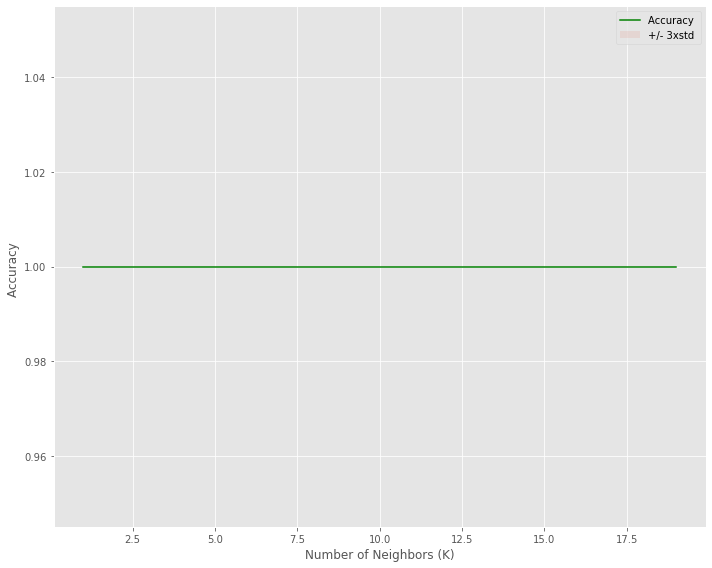

The best in sample accuracy is 1.0 with k= 1


In [176]:
plt.figure(figsize = (10,8))
plt.plot(range(1,inKscluster),inmean_acccluster,'g')
plt.fill_between(range(1,inKscluster),inmean_acccluster - 1 * instd_acccluster,inmean_acccluster + 1 * instd_acccluster, alpha=0.10)
plt.legend(('Accuracy ', '+/- 3xstd'))
plt.ylabel('Accuracy ')
plt.xlabel('Number of Neighbors (K)')
plt.tight_layout()
plt.show()
print( "The best in sample accuracy is", inmean_acccluster.max(), "with k=", inmean_acccluster.argmax()+1) 

In [177]:
inkneighborscluster = inmean_acccluster.argmax()+1
inneighcluster = KNeighborsClassifier(n_neighbors = inkneighborscluster, weights = 'distance').fit(Xcluster,Ycluster)
inyhatknncluster = inneighcluster.predict(Xcluster)

In [178]:
Kscluster = 20
mean_acccluster = np.zeros((Kscluster-1))
std_acccluster = np.zeros((Kscluster-1))
ConfustionMxcluster = [];
for n in range(1,Kscluster):
    #Train Model and Predict  
    neighclusterconf = KNeighborsClassifier(n_neighbors = n, weights = 'distance').fit(X_traincluster,Y_traincluster) #X_train, Y_train
    yhatknnclusterconf=neighclusterconf.predict(X_testcluster)
    mean_acccluster[n-1] = metrics.accuracy_score(Y_testcluster, yhatknnclusterconf)
    std_acccluster[n-1]=np.std(yhatknnclusterconf==Y_testcluster)/np.sqrt(yhatknnclusterconf.shape[0])

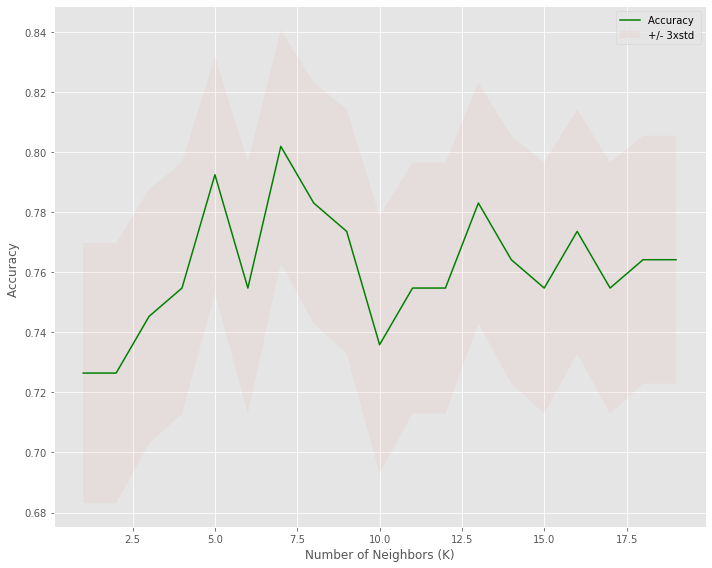

The best out of sample accuracy is 0.8018867924528302 with k= 7


In [179]:
plt.figure(figsize = (10,8))
plt.plot(range(1,Kscluster),mean_acccluster,'g')
plt.fill_between(range(1,Kscluster),mean_acccluster - 1 * std_acccluster,mean_acccluster + 1 * std_acccluster, alpha=0.05)
plt.legend(('Accuracy ', '+/- 3xstd'))
plt.ylabel('Accuracy ')
plt.xlabel('Number of Neighbors (K)')
plt.tight_layout()
plt.show()
print( "The best out of sample accuracy is", mean_acccluster.max(), "with k=", mean_acccluster.argmax()+1) 

In [180]:
kneighborscluster = mean_acccluster.argmax()+1
neighcluster = KNeighborsClassifier(n_neighbors = kneighborscluster, weights = 'distance').fit(X_traincluster,Y_traincluster)
yhatknncluster = neighcluster.predict(X_testcluster)

**Confusion Matrix**

              precision    recall  f1-score   support

           0       0.65      0.74      0.69        23
           1       0.83      0.78      0.80        49
           2       1.00      1.00      1.00         5
           3       0.87      0.83      0.85        24
           4       0.83      1.00      0.91         5

   micro avg       0.80      0.80      0.80       106
   macro avg       0.84      0.87      0.85       106
weighted avg       0.81      0.80      0.80       106

Normalized confusion matrix


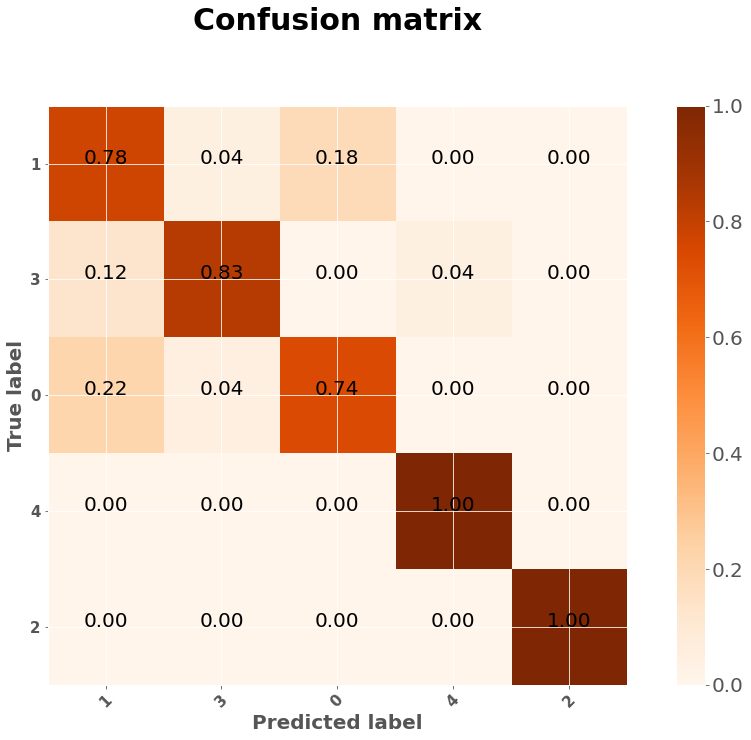

In [181]:
knnmatrixcluster = confusion_matrix(Y_testcluster, yhatknncluster, labels=pd.DataFrame(Y_testcluster)[0].unique().astype(list))
np.set_printoptions(precision=2)
print (classification_report(Y_testcluster, yhatknncluster))
# Plot non-normalized confusion matrix
plt.figure(figsize = [14,10])
plot_confusion_matrix(knnmatrixcluster, classes=pd.DataFrame(Y_testcluster)[0].unique().astype(list),normalize= True,  title='Confusion matrix')

In [182]:
KNNPrecisioncluster = []
KNNRecallcluster = []
KNNTestSizecluster = []
for i in np.arange(10, 70):
    X_trainclusterprecall, X_testclusterprecall, Y_trainclusterprecall, Y_testclusterprecall = train_test_split(Xcluster, Ycluster, test_size=i/100, random_state=0)
    knnclusterprecision = KNeighborsClassifier(n_neighbors = 20, weights = 'distance')
    knnclusterprecision.fit(X_trainclusterprecall, Y_trainclusterprecall)
    KNNclusterPscore = precision_score(Y_testclusterprecall, knnclusterprecision.predict(X_testclusterprecall), average = 'weighted')
    KNNclusterRc = recall_score(Y_testclusterprecall, knnclusterprecision.predict(X_testclusterprecall), average = 'weighted')
    KNNPrecisioncluster.append(KNNclusterPscore)
    KNNRecallcluster.append(KNNclusterRc)
    KNNTestSizecluster.append(i/100)

In [183]:
KNNPrecisioncluster = pd.DataFrame(KNNPrecisioncluster).rename(columns = {0:'Precision'})
KNNRecallcluster = pd.DataFrame(KNNRecallcluster).rename(columns = {0:'Recall'})
KNNPCclustercurve = KNNPrecisioncluster.join(KNNRecallcluster)
KNNPCclustercurve['Test Size'] = KNNTestSizecluster
KNNPCclustercurve.sort_values(by = 'Recall', ascending = False).head(5)

,Precision,Recall,Test Size
27,0.819895,0.815287,0.37
26,0.815655,0.810458,0.36
25,0.812296,0.805369,0.35
16,0.808784,0.801802,0.26
22,0.810262,0.801471,0.32


**Decision Tree**

In [ ]:

dtparamcluster = [{'criterion': ['gini'], 'max_depth': np.arange(1,100)},
                    {'criterion': ['entropy'], 'max_depth': np.arange(1,100)}]
DTclustermodel= DecisionTreeClassifier()
GridDTcluster = GridSearchCV(DTclustermodel, dtparamcluster, cv=4)
GridDTcluster.fit(Xcluster, Ycluster)
BestRRDTcluster=GridDTcluster.best_params_
BestRRDTcluster

**Grid Search Results:**

These parameters fluctuate each time the Grid Search is run

    criterion: entropy
    max_depth: 24 

In [184]:
inmaxdscluster = 50
inmean_acc_dtcluster = np.zeros((inmaxdscluster-1))
instd_acc_dtcluster = np.zeros((inmaxdscluster-1))
inConfustionMxDTcluster = [];
for n in range(1,inmaxdscluster):
    inukTreeclusterconf = DecisionTreeClassifier(criterion="entropy", max_depth = n).fit(X_traincluster,Y_traincluster) #X_train, Y_train
    inyhat_dtcluster=inukTreeclusterconf.predict(X_traincluster)
    inmean_acc_dtcluster[n-1] = metrics.accuracy_score(Y_traincluster, inyhat_dtcluster)
    instd_acc_dtcluster[n-1]=np.std(inyhat_dtcluster==Y_traincluster)/np.sqrt(inyhat_dtcluster.shape[0])

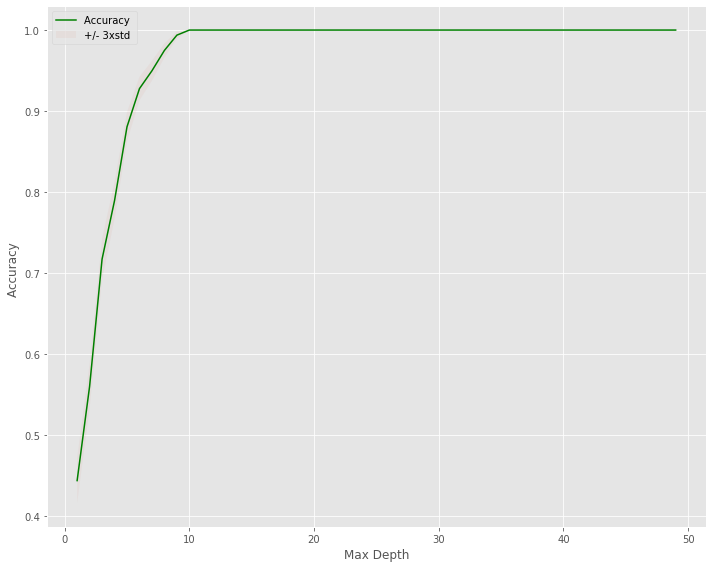

The best in-sample accuracy is 1.0  with max depth = 10


In [185]:
plt.figure(figsize = (10,8))
plt.plot(range(1,inmaxdscluster),inmean_acc_dtcluster,'g')
plt.fill_between(range(1,inmaxdscluster),inmean_acc_dtcluster - 1 * instd_acc_dtcluster,inmean_acc_dtcluster + 1 * instd_acc_dtcluster, alpha=0.05)
plt.legend(('Accuracy ', '+/- 3xstd'))
plt.ylabel('Accuracy ')
plt.xlabel('Max Depth')
plt.tight_layout()
plt.show()
print( "The best in-sample accuracy is", inmean_acc_dtcluster.max(), " with max depth =",  inmean_acc_dtcluster.argmax()+1)

In [186]:
inkdtcluster = inmean_acc_dtcluster.argmax()+1
inukTreecluster = DecisionTreeClassifier(criterion="entropy", max_depth = inkdtcluster)
inukTreecluster.fit(Xcluster,Ycluster)
inyhatDTcluster = inukTreecluster.predict(Xcluster)

In [187]:
maxdscluster = 50
mean_acc_dtcluster = np.zeros((maxdscluster-1))
std_acc_dtcluster = np.zeros((maxdscluster-1))
ConfustionMxDTcluster = [];
for n in range(1,maxdscluster):
    ukTreeclusterconf = DecisionTreeClassifier(criterion="entropy", max_depth = n).fit(X_traincluster,Y_traincluster) #X_train, Y_train
    yhat_dtcluster=ukTreeclusterconf.predict(X_testcluster)
    mean_acc_dtcluster[n-1] = metrics.accuracy_score(Y_testcluster, yhat_dtcluster)
    std_acc_dtcluster[n-1]=np.std(yhat_dtcluster==Y_testcluster)/np.sqrt(yhat_dtcluster.shape[0])

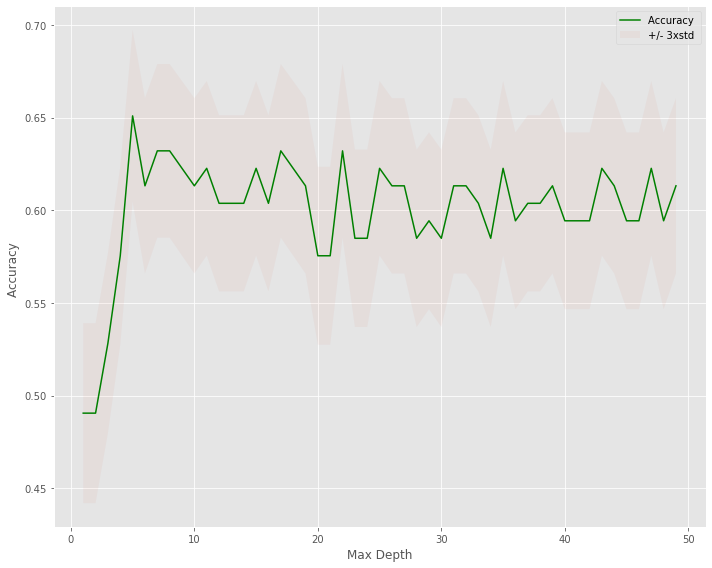

The best out of sample accuracy is 0.6509433962264151 with max depth =  5


In [188]:
plt.figure(figsize = (10,8))
plt.plot(range(1,maxdscluster),mean_acc_dtcluster,'g')
plt.fill_between(range(1,maxdscluster),mean_acc_dtcluster - 1 * std_acc_dtcluster,mean_acc_dtcluster + 1 * std_acc_dtcluster, alpha =0.05)
plt.legend(('Accuracy ', '+/- 3xstd'))
plt.ylabel('Accuracy ')
plt.xlabel('Max Depth')
plt.tight_layout()
plt.show()
print( "The best out of sample accuracy is", mean_acc_dtcluster.max(), "with max depth = ",  mean_acc_dtcluster.argmax()+1)

In [189]:
kdtcluster = mean_acc_dtcluster.argmax()+1
ukTreecluster = DecisionTreeClassifier(criterion="entropy", max_depth = kdtcluster)
ukTreecluster.fit(X_traincluster,Y_traincluster)
yhatDTcluster = ukTreecluster.predict(X_testcluster)

**Confusion Matrix**

              precision    recall  f1-score   support

           0       0.48      0.61      0.54        23
           1       0.73      0.61      0.67        49
           2       0.83      1.00      0.91         5
           3       0.75      0.75      0.75        24
           4       0.50      0.60      0.55         5

   micro avg       0.66      0.66      0.66       106
   macro avg       0.66      0.71      0.68       106
weighted avg       0.68      0.66      0.66       106

Normalized confusion matrix


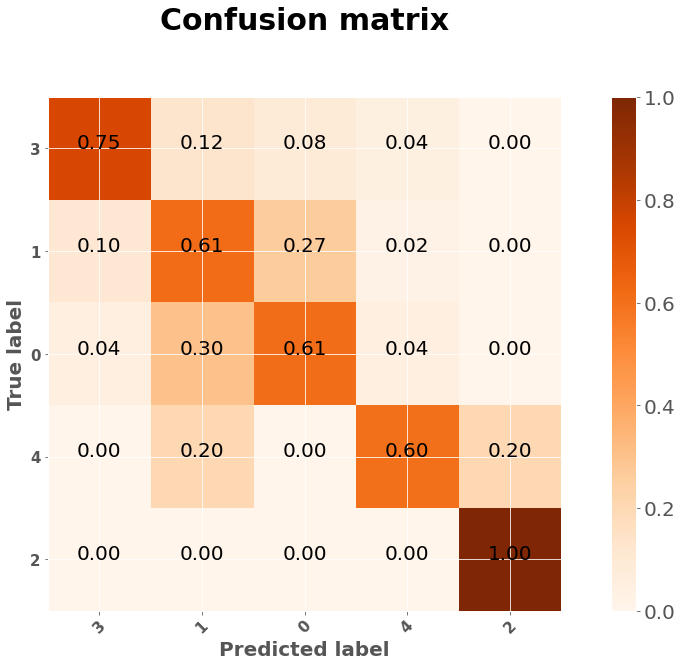

In [190]:
DTmatrixcluster = confusion_matrix(Y_testcluster, yhatDTcluster, labels=pd.DataFrame(Ycluster)[0].unique().astype(list))
np.set_printoptions(precision=2)
print (classification_report(Y_testcluster, yhatDTcluster))
# Plot non-normalized confusion matrix
plt.figure(figsize = [14,9])
plot_confusion_matrix(DTmatrixcluster, classes=pd.DataFrame(Ycluster)[0].unique().astype(list),normalize= True,  title='Confusion matrix')

**Visualize Decision Tree**

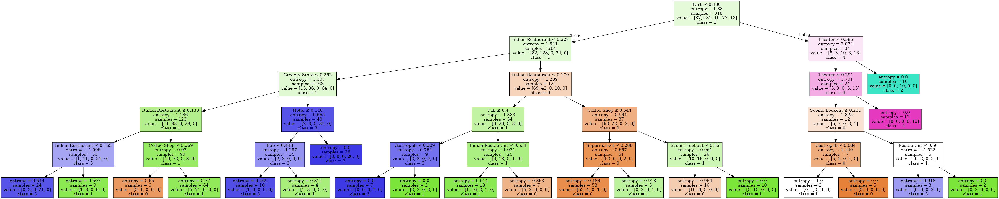

In [191]:
dot_datacluster = StringIO()
featureNamescluster = Xcluster.columns#[0:18]
targetNamescluster = clusteredset['K-Means Cluster Labels'].astype(str).unique().tolist()
outcluster=tree.export_graphviz(ukTreecluster,feature_names=featureNamescluster, out_file=dot_datacluster, class_names= np.unique(Y_traincluster.astype(str)).tolist(), filled=True,  special_characters=True,rotate=False)  
graphcluster = pydotplus.graph_from_dot_data(dot_datacluster.getvalue())  
Image(graphcluster.create_png(), retina = True)

In [ ]:
dot_dataGridcluster = StringIO()
featureNamesGridcluster = Xcluster.columns #[0:18]
outGridcluster=tree.export_graphviz(GridDTcluster.best_estimator_,feature_names=featureNamesGridcluster, out_file=dot_dataGridcluster, class_names= np.unique(Ycluster.astype(str)).tolist(), filled=True,  special_characters=True,rotate=False)  
graphGridcluster = pydotplus.graph_from_dot_data(dot_dataGridcluster.getvalue())  
Image(graphGridcluster.create_png(), retina = True)
graphGridcluster.write_png('IdealDT_KMeans.png')

**Here is the ideal model**

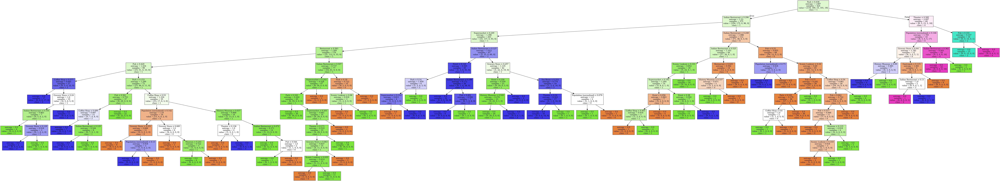

In [192]:
IM.open('IdealDT_KMeans.png')

In [193]:
DTclusterPrecision = []
DTclusterRecall = []
DTclusterTestsize = []
for i in np.arange(10, 70):
    DTX_trainclusterprecall, DTX_testclusterprecall, DTY_trainclusterprecall, DTY_testclusterprecall = train_test_split(Xcluster, Ycluster, test_size=i/100)
    DTclusterprecision = DecisionTreeClassifier(criterion="entropy", max_depth = 24)
    DTclusterprecision.fit(DTX_trainclusterprecall, DTY_trainclusterprecall)
    DTclusterPscore = precision_score(DTY_testclusterprecall, DTclusterprecision.predict(DTX_testclusterprecall), average = 'weighted')
    DTclusterRc = recall_score(DTY_testclusterprecall, DTclusterprecision.predict(DTX_testclusterprecall), average = 'weighted')
    DTclusterPrecision.append(DTclusterPscore)
    DTclusterRecall.append(DTclusterRc)
    DTclusterTestsize.append(i/100)

In [194]:
DTclusterPrecision = pd.DataFrame(DTclusterPrecision).rename(columns = {0:'Precision'})
DTclusterRecall = pd.DataFrame(DTclusterRecall).rename(columns = {0:'Recall'})
DTclusterPCcurve = DTclusterPrecision.join(DTclusterRecall)
DTclusterPCcurve['Test Size'] = DTclusterTestsize
DTclusterPCcurve.sort_values(by = 'Recall', ascending = False).head()

,Precision,Recall,Test Size
6,0.725950,0.705882,0.16
0,0.713953,0.697674,0.10
31,0.701279,0.689655,0.41
2,0.697168,0.686275,0.12
7,0.697202,0.684932,0.17


**Random Forest** 

In [ ]:

rfparamcluster = [{'criterion': ['gini', 'entropy'], 'n_estimators': np.arange(1,10), 'max_depth': np.arange(1, 10), 'max_features': ['auto', 'sqrt', 'log2']},  #(1,20) #(1,15)
                    {'criterion': ['entropy'], 'n_estimators': np.arange(1,10), 'max_depth': np.arange(1,10), 'max_features': ['auto', 'sqrt', 'log2']}]
RFclustermodel= RandomForestClassifier()
GridRFcluster = GridSearchCV(RFclustermodel, rfparamcluster, cv=4)
GridRFcluster.fit(Xcluster, Ycluster)
BestRRRFcluster=GridRFcluster.best_params_
BestRRRFcluster

**Grid Search Results**

Parameters vary each time this search is run. For one instance the parameters are:
    
    Criterion: entropy
    Max_Depth: 8
    Max_Features: sqrt
    N_estimators: 9

In [195]:
inmaxestimator  = 100
inmean_acc_rfcluster = np.zeros((inmaxestimator-1))
instd_acc_rfcluster = np.zeros((inmaxestimator-1))
inConfustionMxRFcluster = [];
for n in range(1,inmaxestimator):
    inukRFclusterconf = RandomForestClassifier(n_estimators=n, criterion = 'entropy', max_depth = 8, max_features = 'sqrt', random_state = 1).fit(X_traincluster,Y_traincluster) #X_train, Y_train
    inyhat_rfcluster=inukRFclusterconf.predict(X_traincluster)
    inmean_acc_rfcluster[n-1] = metrics.accuracy_score(Y_traincluster, inyhat_rfcluster)
    instd_acc_rfcluster[n-1]=np.std(inyhat_rfcluster==Y_traincluster)/np.sqrt(inyhat_rfcluster.shape[0])

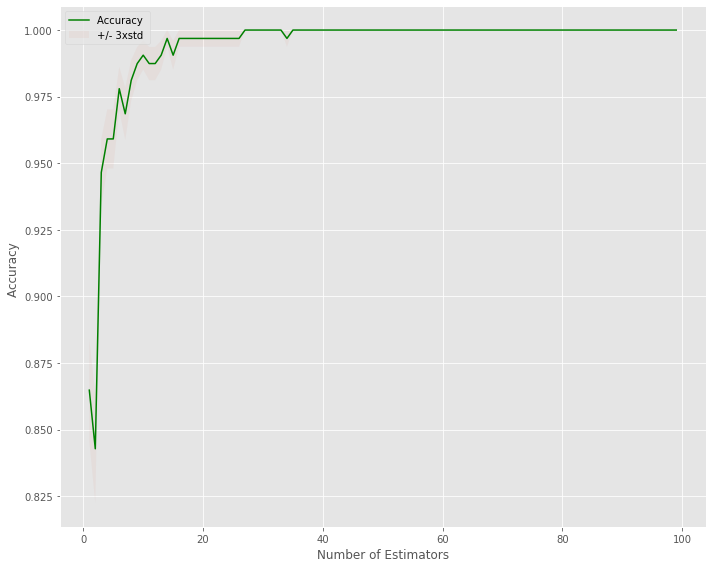

The best in-sample accuracy is 1.0 with # of estimators 27


In [196]:
plt.figure(figsize = (10,8))
plt.plot(range(1,inmaxestimator),inmean_acc_rfcluster,'g')
plt.fill_between(range(1,inmaxestimator),inmean_acc_rfcluster - 1 * instd_acc_rfcluster,inmean_acc_rfcluster + 1 * instd_acc_rfcluster, alpha = 0.05)
plt.legend(('Accuracy ', '+/- 3xstd'))
plt.ylabel('Accuracy ')
plt.xlabel('Number of Estimators')
plt.tight_layout()
plt.show()
print( "The best in-sample accuracy is", inmean_acc_rfcluster.max(), "with # of estimators",  inmean_acc_rfcluster.argmax()+1)

In [197]:
inrfclusterestimators = inmean_acc_rfcluster.argmax()+1
inRFcluster =RandomForestClassifier(n_estimators=inrfclusterestimators, criterion = 'entropy', max_depth = 8, max_features = 'sqrt', random_state = 6)
inRFcluster.fit(Xcluster, Ycluster)
inyhatRFcluster = inRFcluster.predict(Xcluster)

In [198]:
maxestimator  = 100
mean_acc_rfcluster = np.zeros((maxestimator-1))
std_acc_rfcluster = np.zeros((maxestimator-1))
ConfustionMxRFcluster = [];
for n in range(1,maxestimator):
    ukRFclusterconf = RandomForestClassifier(n_estimators=n, criterion = 'entropy', max_depth = 8, max_features = 'sqrt', random_state = 6).fit(X_traincluster,Y_traincluster) #X_train, Y_train
    yhat_rfcluster=ukRFclusterconf.predict(X_testcluster)
    mean_acc_rfcluster[n-1] = metrics.accuracy_score(Y_testcluster, yhat_rfcluster)
    std_acc_rfcluster[n-1]=np.std(yhat_rfcluster==Y_testcluster)/np.sqrt(yhat_rfcluster.shape[0])

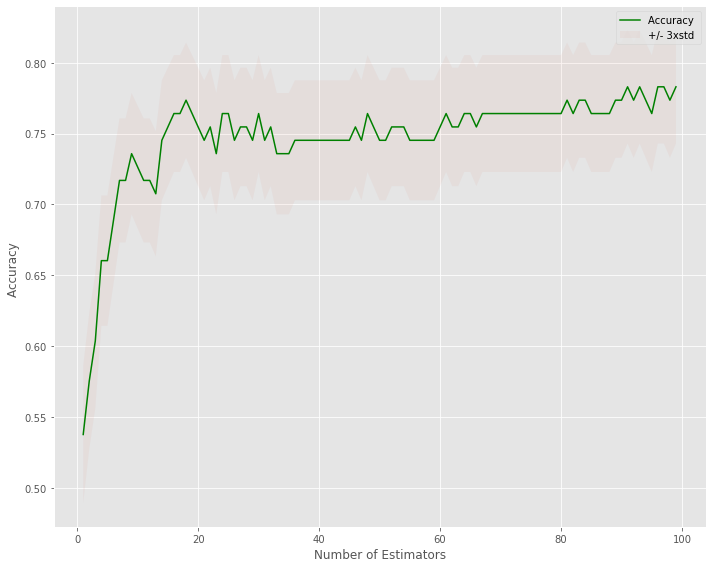

The best out of sample accuracy is 0.7830188679245284 with # of estimators 91


In [199]:
plt.figure(figsize = (10,8))
plt.plot(range(1,maxestimator),mean_acc_rfcluster,'g')
plt.fill_between(range(1,maxestimator),mean_acc_rfcluster - 1 * std_acc_rfcluster,mean_acc_rfcluster + 1 * std_acc_rfcluster, alpha=0.05)
plt.legend(('Accuracy ', '+/- 3xstd'))
plt.ylabel('Accuracy ')
plt.xlabel('Number of Estimators')
plt.tight_layout()
plt.show()
print( "The best out of sample accuracy is", mean_acc_rfcluster.max(), "with # of estimators",  mean_acc_rfcluster.argmax()+1)

In [200]:
RFcluster =RandomForestClassifier(n_estimators=mean_acc_rfcluster.argmax()+1,  criterion = 'entropy', max_depth = 8, max_features = 'sqrt', random_state = 6)
RFcluster.fit(X_traincluster, Y_traincluster)
yhatRFcluster = RFcluster.predict(X_testcluster)

**Confusion Matrix**

              precision    recall  f1-score   support

           0       0.67      0.70      0.68        23
           1       0.84      0.73      0.78        49
           2       1.00      1.00      1.00         5
           3       0.75      0.88      0.81        24
           4       0.83      1.00      0.91         5

   micro avg       0.78      0.78      0.78       106
   macro avg       0.82      0.86      0.84       106
weighted avg       0.79      0.78      0.78       106

Normalized confusion matrix


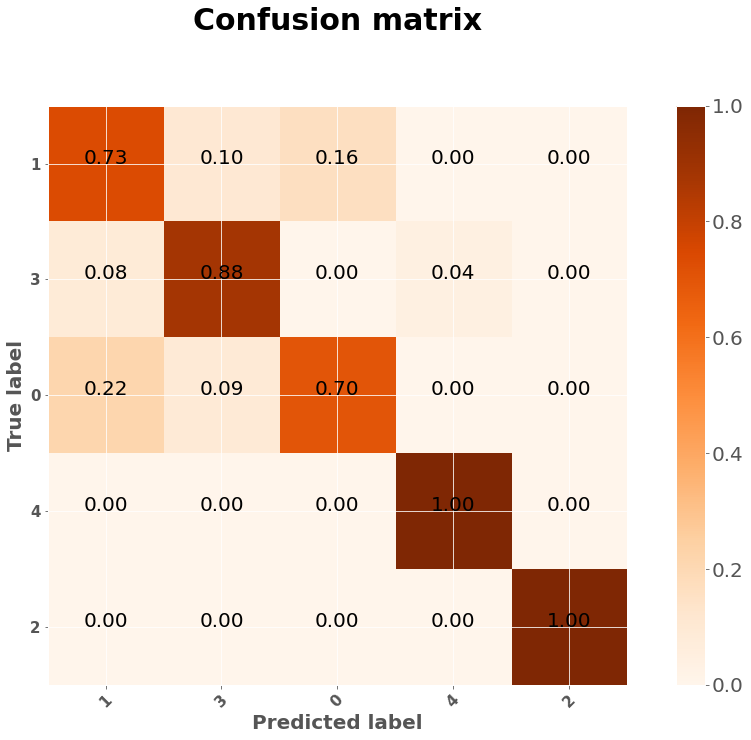

In [201]:
rfmatrixcluster = confusion_matrix(Y_testcluster, yhatRFcluster, labels=pd.DataFrame(Y_testcluster)[0].unique().astype(list))
np.set_printoptions(precision=2)
print (classification_report(Y_testcluster, yhatRFcluster))
# Plot non-normalized confusion matrix
plt.figure(figsize = [14,10])
plot_confusion_matrix(rfmatrixcluster, classes=pd.DataFrame(Y_testcluster)[0].unique().astype(list),normalize= True,  title='Confusion matrix')

In [202]:
RFclusterPrecision = []
RFclusterRecall = []
RFClusterTestsize = []
for i in np.arange(10, 70):
    RFX_trainclusterprecall, RFX_testclusterprecall, RFY_trainclusterprecall, RFY_testclusterprecall = train_test_split(Xcluster, Ycluster, test_size=i/100)
    RFclusterprecision = RandomForestClassifier(n_estimators=9, criterion = 'entropy', max_depth = 8, max_features = 'sqrt', random_state = 1)
    RFclusterprecision.fit(RFX_trainclusterprecall, RFY_trainclusterprecall)
    RFclusterPscore = precision_score(RFY_testclusterprecall, RFclusterprecision.predict(RFX_testclusterprecall), average = 'weighted')
    RFclusterRc = recall_score(RFY_testclusterprecall, RFclusterprecision.predict(RFX_testclusterprecall), average = 'weighted')
    RFClusterTestsize.append(i/100)
    RFclusterPrecision.append(RFclusterPscore)
    RFclusterRecall.append(RFclusterRc)

In [203]:
RFclusterPrecision = pd.DataFrame(RFclusterPrecision).rename(columns = {0:'Precision'})
RFclusterRecall = pd.DataFrame(RFclusterRecall).rename(columns = {0:'Recall'})
RFclusterPCcurve = RFclusterPrecision.join(RFclusterRecall)
RFclusterPCcurve['Test Size'] = RFClusterTestsize
RFclusterPCcurve.sort_values(by = 'Recall', ascending = False).head()

,Precision,Recall,Test Size
0,0.827115,0.813953,0.10
6,0.798555,0.794118,0.16
11,0.805185,0.788889,0.21
15,0.807659,0.783019,0.25
20,0.800747,0.781250,0.30


**DBSCAN Clustering Classes**

All the processes for K-Means and Population Bin classes are repeated for DBSCAN classes.

In [204]:
clustereddbscan = pd.read_csv('DBSCAN_Clusters.csv')
clustereddbscan = clustereddbscan.set_index('Town/Area')
clustereddbscan.head()

,DBScan Labels,K-Means Cluster Labels,Latitude,Longitude,Easting,Northing,Postcodes,Active postcodes,Population,Households,...,Yoga Studio,Zoo,Zoo Exhibit,Population (normalized),Households(normalized),Pop-binned,Class,DB Class,Latitude (standardized),Longitude (standardized)
Town/Area,,,,,,,,,,,,,,,,,,,,,
Aberdeen,-1,3,57.181716,-2.192122,388492.263158,810126.210526,1235.842105,360.789474,245387.0,112158.0,...,0.0,0.000000,0.0,0.222007,0.264462,Bin2(184218-368436),Class3,DB Class-1,2.595542,-0.184576
Aberdeenshire,-1,3,57.298876,-2.503469,369716.588235,823302.470588,779.705882,524.411765,223979.0,93341.0,...,0.0,0.000000,0.0,0.202639,0.220092,Bin2(184218-368436),Class3,DB Class-1,2.664896,-0.347281
Adur,0,1,50.836050,-0.250062,523320.500000,105516.500000,527.500000,369.500000,32639.0,14269.0,...,0.0,0.000000,0.0,0.029529,0.033645,Bin1(0-184218),Class1,DB Class0,-1.160795,0.830313
Allerdale,-1,3,54.677167,-3.387577,310623.166667,532240.333333,802.166667,687.833333,98058.0,43111.0,...,0.0,0.154839,0.0,0.088715,0.101653,Bin1(0-184218),Class3,DB Class-1,1.112966,-0.809302
Amber Valley,0,0,53.047400,-1.407023,439849.000000,350180.250000,1201.250000,726.000000,131664.0,56522.0,...,0.0,0.000000,0.0,0.119120,0.133275,Bin1(0-184218),Class0,DB Class0,0.148221,0.225704


In [205]:
Xclusterdbscan = clustereddbscan .copy()
Xclusterdbscan .drop(columns = ['Latitude', 'Longitude', 'Population', 'Households'], inplace = True)
Xclusterdbscan  = Xclusterdbscan [['Theater', 'Pub', 'Restaurant', 'Coffee Shop', 'Museum', 'Park', 'Indian Restaurant', 'Movie Theater', 'History Museum', 'Italian Restaurant', 'Grocery Store', 'Gastropub', 'Supermarket','Hotel', 'Scenic Lookout', 'Tea Room', 'Population (normalized)']]
Yclusterdbscan  = pd.Series(np.array(clustereddbscan ['DBScan Labels']))
Yclusterdbscan .index = Xclusterdbscan .index
X_trainclusterdbscan , X_testclusterdbscan , Y_trainclusterdbscan , Y_testclusterdbscan  = train_test_split(Xclusterdbscan , Yclusterdbscan , test_size=0.16, random_state=0)

**SVM**

In [ ]:
svmparamclusterdbscan = tuned_parametersdbscan = [{'kernel': ['rbf'], 'gamma': [0.001, 0.0001, 'scale', 'auto'],
                     'C': np.arange(1,200)},
                    {'kernel': ['linear'], 'C': np.arange(1,200)}]
SVclusterdbscan=svm.SVC()
Gridsvmclusterdbscan = GridSearchCV(SVclusterdbscan, svmparamclusterdbscan, cv=4)
Gridsvmclusterdbscan.fit(Xclusterdbscan, Yclusterdbscan)
BestRRsvmclusterdbscan=Gridsvmclusterdbscan.best_params_
BestRRsvmclusterdbscan

**Grid Search Results:**

    C:14
    gamma: scale
    kernel: rbf
    
    

In [206]:
inmaxsvmclusterdbscan = 100
inmean_acc_svmclusterdbscan = np.zeros((inmaxsvmclusterdbscan-1))
instd_acc_svmclusterdbscan = np.zeros((inmaxsvmclusterdbscan-1))
inConfustionMxSVMclusterdbscan = [];
for n in range(1,inmaxsvmclusterdbscan):
    inSVMclusterdbscanconf = svm.SVC(kernel='rbf', C=n,  gamma = 'scale', random_state=1).fit(X_trainclusterdbscan,Y_trainclusterdbscan) #X_train, Y_train
    inyhat_svmclusterdbscan=inSVMclusterdbscanconf.predict(X_trainclusterdbscan)
    inmean_acc_svmclusterdbscan[n-1] = metrics.accuracy_score(Y_trainclusterdbscan, inyhat_svmclusterdbscan)
    instd_acc_svmclusterdbscan[n-1]=np.std(inyhat_svmclusterdbscan==Y_trainclusterdbscan)/np.sqrt(inyhat_svmclusterdbscan.shape[0])

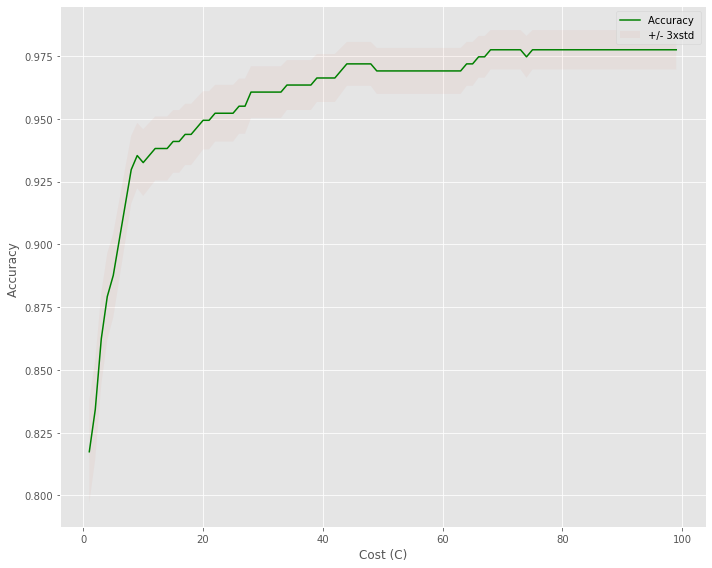

The best in-sample accuracy is 0.9775280898876404  with C = 68


In [207]:
plt.figure(figsize = (10,8))
plt.plot(range(1,inmaxsvmclusterdbscan),inmean_acc_svmclusterdbscan,'g')
plt.fill_between(range(1,inmaxsvmclusterdbscan),inmean_acc_svmclusterdbscan - 1 * instd_acc_svmclusterdbscan,inmean_acc_svmclusterdbscan + 1 * instd_acc_svmclusterdbscan, alpha=0.05)
plt.legend(('Accuracy ', '+/- 3xstd'))
plt.ylabel('Accuracy ')
plt.xlabel('Cost (C)')
plt.tight_layout()
plt.show()
print( "The best in-sample accuracy is", inmean_acc_svmclusterdbscan.max(), " with C =",  inmean_acc_svmclusterdbscan.argmax()+1)

In [208]:
inSVMclusterdbscan = inmean_acc_svmclusterdbscan.argmax()+1
inSVMdbscan = svm.SVC(kernel='rbf', C=inSVMclusterdbscan,  gamma = 'scale', random_state=1)
inSVMdbscan.fit(Xclusterdbscan,Yclusterdbscan)
inyhatSVMdbscan = inSVMdbscan.predict(Xclusterdbscan)

In [209]:
maxsvmclusterdbscan = 100
mean_acc_svmclusterdbscan = np.zeros((maxsvmclusterdbscan-1))
std_acc_svmclusterdbscan = np.zeros((maxsvmclusterdbscan-1))
ConfustionMxSVMclusterdbscan = [];
for n in range(1,maxsvmclusterdbscan):
    SVMclusterdbscanconf = svm.SVC(kernel='rbf', C=n,  gamma = 'scale', random_state=1).fit(X_trainclusterdbscan,Y_trainclusterdbscan) #X_train, Y_train
    yhat_svmclusterdbscan=SVMclusterdbscanconf.predict(X_testclusterdbscan)
    mean_acc_svmclusterdbscan[n-1] = metrics.accuracy_score(Y_testclusterdbscan, yhat_svmclusterdbscan)
    std_acc_svmclusterdbscan[n-1]=np.std(yhat_svmclusterdbscan==Y_testclusterdbscan)/np.sqrt(yhat_svmclusterdbscan.shape[0])

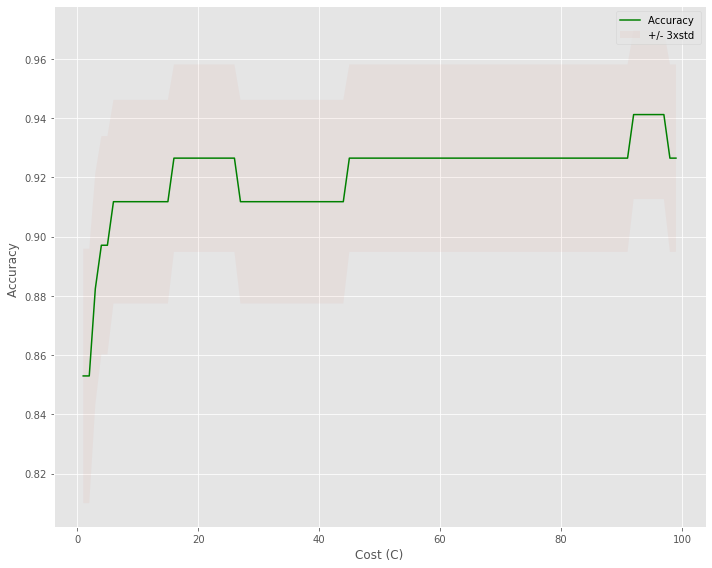

The out of-sample accuracy is 0.9411764705882353  with C = 92


In [210]:
plt.figure(figsize = (10,8))
plt.plot(range(1,maxsvmclusterdbscan),mean_acc_svmclusterdbscan,'g')
plt.fill_between(range(1,maxsvmclusterdbscan),mean_acc_svmclusterdbscan - 1 * std_acc_svmclusterdbscan,mean_acc_svmclusterdbscan + 1 * std_acc_svmclusterdbscan, alpha=0.05)
plt.legend(('Accuracy ', '+/- 3xstd'))
plt.ylabel('Accuracy ')
plt.xlabel('Cost (C)')
plt.tight_layout()
plt.show()
print( "The out of-sample accuracy is", mean_acc_svmclusterdbscan.max(), " with C =",  mean_acc_svmclusterdbscan.argmax()+1)

In [211]:
SVMclusterdbscan = mean_acc_svmclusterdbscan.argmax()+1
SVMdbscan = svm.SVC(kernel='rbf', C = 8, gamma = 'scale', random_state=4)
SVMdbscan.fit(X_trainclusterdbscan, Y_trainclusterdbscan)
# predict on training examples
yhatSVMdbscan = SVMdbscan.predict(X_testclusterdbscan)

**Confusion Matrix**

              precision    recall  f1-score   support

          -1       0.88      0.64      0.74        11
           0       0.94      1.00      0.97        51
           1       1.00      0.50      0.67         2
           2       1.00      0.67      0.80         3
           3       0.33      1.00      0.50         1

   micro avg       0.91      0.91      0.91        68
   macro avg       0.83      0.76      0.73        68
weighted avg       0.93      0.91      0.91        68

Normalized confusion matrix


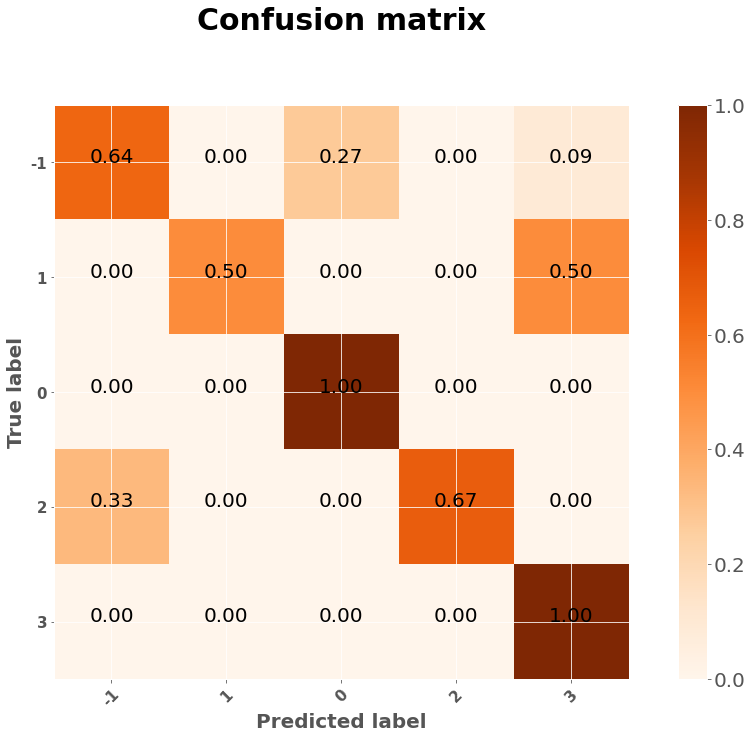

In [212]:
SVMmatrixdbscan = confusion_matrix(Y_testclusterdbscan, yhatSVMdbscan, labels=Y_testclusterdbscan.unique().astype(list))
np.set_printoptions(precision=2)
print (classification_report(Y_testclusterdbscan, yhatSVMdbscan))
#Plot non-normalized confusion matrix
plt.figure(figsize = [14,10])
plot_confusion_matrix(SVMmatrixdbscan, classes=Y_testclusterdbscan.unique().astype(list),normalize= True,  title='Confusion matrix')

In [213]:
svmdbclusterPrecision = []
svmdbclusterRecall = []
svmdbclusterTestsize = []
for i in np.arange(10, 70):
    svmX_traindbclusterprecall, svmX_testdbclusterprecall, svmY_traindbclusterprecall, svmY_testdbclusterprecall = train_test_split(Xclusterdbscan, Yclusterdbscan, test_size=i/100, random_state=0)
    svmdbclusterprecision =svm.SVC(kernel='rbf', C=14,  gamma = 'scale', random_state=1)
    svmdbclusterprecision.fit(svmX_traindbclusterprecall, svmY_traindbclusterprecall)
    svmdbclusterPscore = precision_score(svmY_testdbclusterprecall, svmdbclusterprecision.predict(svmX_testdbclusterprecall), average = 'weighted')
    svmdbclusterRc = recall_score(svmY_testdbclusterprecall, svmdbclusterprecision.predict(svmX_testdbclusterprecall), average = 'weighted')
    svmdbclusterPrecision.append(svmdbclusterPscore)
    svmdbclusterRecall.append(svmdbclusterRc)
    svmdbclusterTestsize.append(i/100)

In [214]:
svmdbclusterPrecision = pd.DataFrame(svmdbclusterPrecision).rename(columns = {0:'Precision'})
svmdbclusterRecall = pd.DataFrame(svmdbclusterRecall).rename(columns = {0:'Recall'})
svmdbclusterPCcurve = svmdbclusterPrecision.join(svmdbclusterRecall)
svmdbclusterPCcurve['Test Size'] = svmdbclusterTestsize
svmdbclusterPCcurve.sort_values(by = 'Recall', ascending = False).head()

,Precision,Recall,Test Size
9,0.940419,0.925926,0.19
8,0.937414,0.922078,0.18
10,0.930232,0.917647,0.20
4,0.934694,0.916667,0.14
6,0.928309,0.911765,0.16


**KNN**

In [ ]:
knnparamclusterdbscan = [{'n_neighbors': np.arange(1,30), 'algorithm': ['auto', 'ball_tree', 'kd_tree', 'brute'],
                    'weights': ['uniform', 'distance']}]
KNNclusterdbscanmodel=KNeighborsClassifier()
GridKNNclusterdbscan = GridSearchCV(KNNclusterdbscanmodel, knnparamclusterdbscan, cv=4)
GridKNNclusterdbscan.fit(Xclusterdbscan, Yclusterdbscan)
BestRRKNNclusterdbscan=GridKNNclusterdbscan.best_params_
BestRRKNNclusterdbscan

**Grid Search Results**

    N_neigbors: 3
    Algorithm: Auto
    Weights: Distance

In [215]:
inKsclusterdbscan = 20
inmean_accclusterdbscan = np.zeros((inKsclusterdbscan-1))
instd_accclusterdbscan = np.zeros((inKsclusterdbscan-1))
inConfustionMxclusterdbscan = [];
for n in range(1,inKsclusterdbscan):
    #Train Model and Predict  
    inneighclusterdbscanconf = KNeighborsClassifier(n_neighbors = n, weights = 'distance').fit(X_trainclusterdbscan,Y_trainclusterdbscan) #X_train, Y_train
    inyhatknnclusterdbscanconf=inneighclusterdbscanconf.predict(X_trainclusterdbscan)
    inmean_accclusterdbscan[n-1] = metrics.accuracy_score(Y_trainclusterdbscan, inyhatknnclusterdbscanconf)
    instd_accclusterdbscan[n-1]=np.std(inyhatknnclusterdbscanconf==Y_trainclusterdbscan)/np.sqrt(inyhatknnclusterdbscanconf.shape[0])

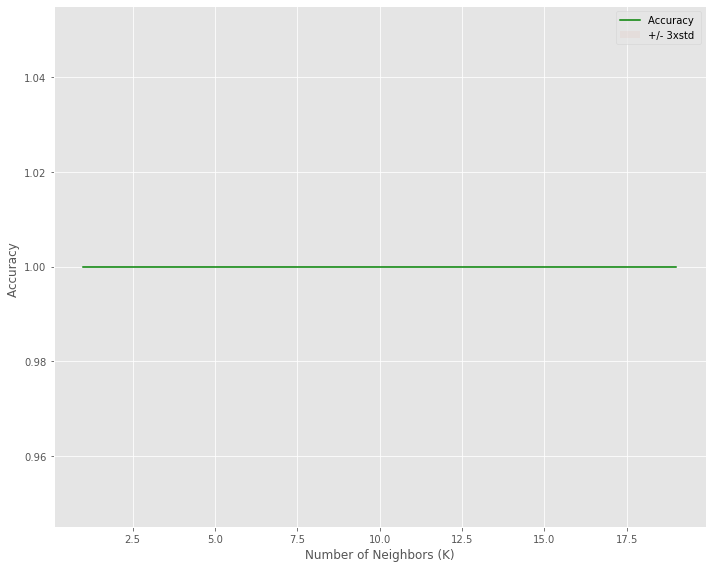

The best in sample accuracy is 1.0 with k= 1


In [216]:
plt.figure(figsize = (10,8))
plt.plot(range(1,inKsclusterdbscan),inmean_accclusterdbscan,'g')
plt.fill_between(range(1,inKsclusterdbscan),inmean_accclusterdbscan - 1 * instd_accclusterdbscan,inmean_accclusterdbscan + 1 * instd_accclusterdbscan, alpha=0.05)
plt.legend(('Accuracy ', '+/- 3xstd'))
plt.ylabel('Accuracy ')
plt.xlabel('Number of Neighbors (K)')
plt.tight_layout()
plt.show()
print( "The best in sample accuracy is", inmean_accclusterdbscan.max(), "with k=", inmean_accclusterdbscan.argmax()+1) 

In [217]:
inkneighborsclusterdbscan = inmean_accclusterdbscan.argmax()+1
inneighclusterdbscan = KNeighborsClassifier(n_neighbors = inkneighborsclusterdbscan, weights = 'distance').fit(Xclusterdbscan,Yclusterdbscan)
inyhatknnclusterdbscan = inneighclusterdbscan.predict(Xclusterdbscan)

In [218]:
Ksclusterdbscan = 20
mean_accclusterdbscan = np.zeros((Ksclusterdbscan-1))
std_accclusterdbscan= np.zeros((Ksclusterdbscan-1))
ConfustionMxclusterdbscan = [];
for n in range(1,Ksclusterdbscan):
    #Train Model and Predict  
    neighclusterdbscanconf = KNeighborsClassifier(n_neighbors = n, weights = 'distance').fit(X_trainclusterdbscan,Y_trainclusterdbscan) #X_train, Y_train
    yhatknnclusterdbscanconf=neighclusterdbscanconf.predict(X_testclusterdbscan)
    mean_accclusterdbscan[n-1] = metrics.accuracy_score(Y_testclusterdbscan, yhatknnclusterdbscanconf)
    std_accclusterdbscan[n-1]=np.std(yhatknnclusterdbscanconf==Y_testclusterdbscan)/np.sqrt(yhatknnclusterdbscanconf.shape[0])

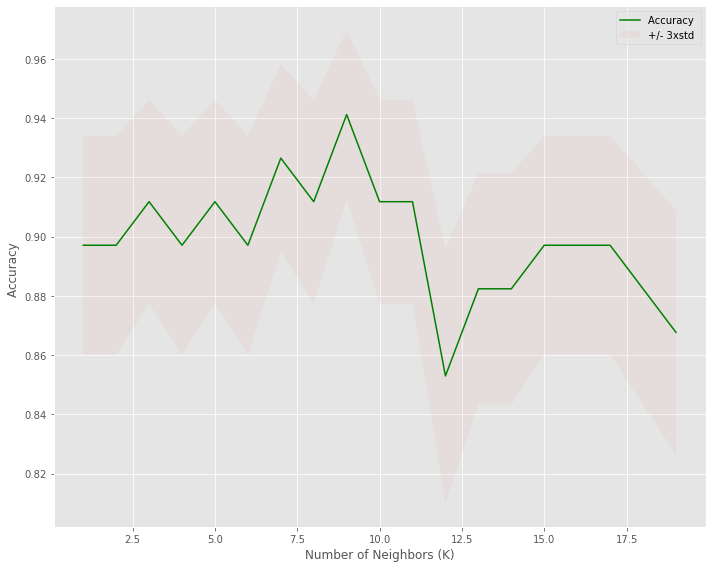

The best out of sample accuracy is 0.9411764705882353 with k= 9


In [219]:
plt.figure(figsize = (10,8))
plt.plot(range(1,Ksclusterdbscan),mean_accclusterdbscan,'g')
plt.fill_between(range(1,Ksclusterdbscan),mean_accclusterdbscan- 1 * std_accclusterdbscan,mean_accclusterdbscan + 1 * std_accclusterdbscan, alpha=0.05)
plt.legend(('Accuracy ', '+/- 3xstd'))
plt.ylabel('Accuracy ')
plt.xlabel('Number of Neighbors (K)')
plt.tight_layout()
plt.show()
print( "The best out of sample accuracy is", mean_accclusterdbscan.max(), "with k=", mean_accclusterdbscan.argmax()+1) 

In [220]:
kneighborsclusterdbscan = mean_accclusterdbscan.argmax()+1
neighclusterdbscan = KNeighborsClassifier(n_neighbors = kneighborsclusterdbscan, weights = 'distance').fit(X_trainclusterdbscan, Y_trainclusterdbscan)
yhatknnclusterdbscan = neighclusterdbscan.predict(X_testclusterdbscan)

**Confusion Matrix**

              precision    recall  f1-score   support

          -1       1.00      0.82      0.90        11
           0       0.94      1.00      0.97        51
           1       1.00      1.00      1.00         2
           2       0.67      0.67      0.67         3
           3       0.00      0.00      0.00         1

   micro avg       0.94      0.94      0.94        68
   macro avg       0.72      0.70      0.71        68
weighted avg       0.93      0.94      0.93        68

Normalized confusion matrix


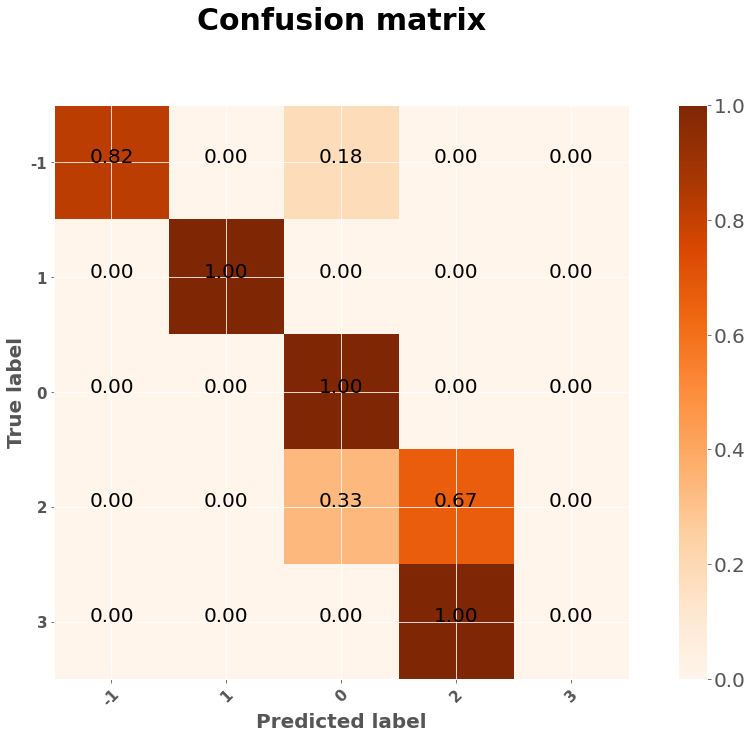

In [221]:
knnmatrixclusterdbscan = confusion_matrix(Y_testclusterdbscan, yhatknnclusterdbscan, labels=pd.DataFrame(Y_testclusterdbscan)[0].unique().astype(list))
np.set_printoptions(precision=2)
print (classification_report(Y_testclusterdbscan, yhatknnclusterdbscan))
# Plot non-normalized confusion matrix
plt.figure(figsize = [14,10])
plot_confusion_matrix(knnmatrixclusterdbscan, classes=pd.DataFrame(Y_testclusterdbscan)[0].unique().astype(list),normalize= True,  title='Confusion matrix')

In [222]:
KNNPrecisiondbcluster = []
KNNRecalldbcluster = []
KNNTestSizedbcluster = []
for i in np.arange(10, 70):
    X_traindbclusterprecall, X_testdbclusterprecall, Y_traindbclusterprecall, Y_testdbclusterprecall = train_test_split(Xclusterdbscan, Yclusterdbscan, test_size=i/100, random_state=0)
    knndbclusterprecision = KNeighborsClassifier(n_neighbors = 3, weights = 'distance')
    knndbclusterprecision.fit(X_traindbclusterprecall, Y_traindbclusterprecall)
    KNNdbclusterPscore = precision_score(Y_testdbclusterprecall, knndbclusterprecision.predict(X_testdbclusterprecall), average = 'weighted')
    KNNdbclusterRc = recall_score(Y_testdbclusterprecall, knndbclusterprecision.predict(X_testdbclusterprecall), average = 'weighted')
    KNNPrecisiondbcluster.append(KNNdbclusterPscore)
    KNNRecalldbcluster.append(KNNdbclusterRc)
    KNNTestSizedbcluster.append(i/100)

In [223]:
KNNPrecisiondbcluster = pd.DataFrame(KNNPrecisiondbcluster).rename(columns = {0:'Precision'})
KNNRecalldbcluster = pd.DataFrame(KNNRecalldbcluster).rename(columns = {0:'Recall'})
KNNPCdbclustercurve = KNNPrecisiondbcluster.join(KNNRecalldbcluster)
KNNPCdbclustercurve['Test Size'] = KNNTestSizedbcluster
KNNPCdbclustercurve.sort_values(by = 'Recall', ascending = False).head(5)

,Precision,Recall,Test Size
7,0.923360,0.917808,0.17
10,0.926113,0.917647,0.20
9,0.923398,0.913580,0.19
6,0.917514,0.911765,0.16
8,0.919481,0.909091,0.18


**DT**

In [ ]:
dtparamclusterdbscan = [{'criterion': ['gini'], 'max_depth': np.arange(1,100)},
                    {'criterion': ['entropy'], 'max_depth': np.arange(1,100)}]
DTclusterdbscanmodel= DecisionTreeClassifier()
GridDTclusterdbscan = GridSearchCV(DTclusterdbscanmodel, dtparamclusterdbscan, cv=4)
GridDTclusterdbscan.fit(Xclusterdbscan, Yclusterdbscan)
BestRRDTclusterdbscan=GridDTclusterdbscan.best_params_
BestRRDTclusterdbscan

**Grid Search Results**

    Criterion: Entropy
    Max Depth: 38, max depth tends to change each time it's run

In [225]:
inmaxdsclusterdbscan = 30
inmean_acc_dtclusterdbscan = np.zeros((inmaxdsclusterdbscan-1))
instd_acc_dtclusterdbscan = np.zeros((inmaxdsclusterdbscan-1))
inConfustionMxDTclusterdbscan = [];
for n in range(1,inmaxdsclusterdbscan):
    inukTreeclusterdbscanconf = DecisionTreeClassifier(criterion="entropy", max_depth = n).fit(X_trainclusterdbscan,Y_trainclusterdbscan) #X_train, Y_train
    inyhat_dtclusterdbscan=inukTreeclusterdbscanconf.predict(X_trainclusterdbscan)
    inmean_acc_dtclusterdbscan[n-1] = metrics.accuracy_score(Y_trainclusterdbscan, inyhat_dtclusterdbscan)
    instd_acc_dtclusterdbscan[n-1]=np.std(inyhat_dtclusterdbscan==Y_trainclusterdbscan)/np.sqrt(inyhat_dtclusterdbscan.shape[0])

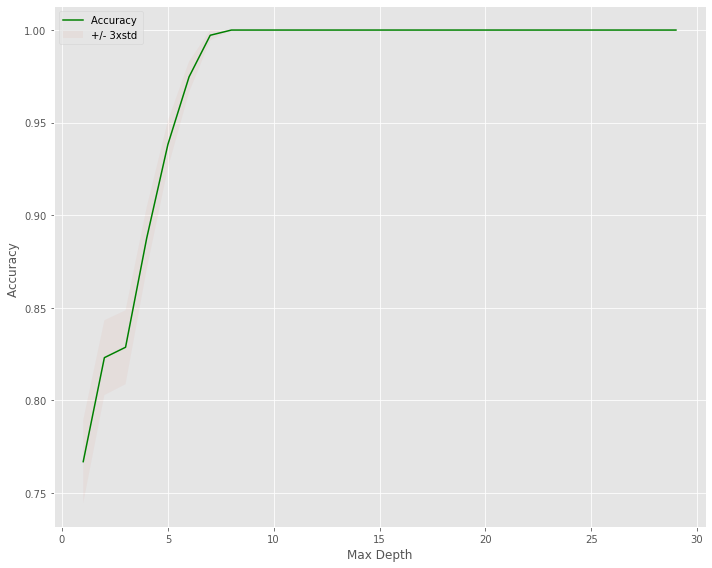

The best in sample accuracy is 1.0 with max depth =  8


In [226]:
plt.figure(figsize = (10,8))
plt.plot(range(1,inmaxdsclusterdbscan),inmean_acc_dtclusterdbscan,'g')
plt.fill_between(range(1,inmaxdsclusterdbscan),inmean_acc_dtclusterdbscan - 1 * instd_acc_dtclusterdbscan,inmean_acc_dtclusterdbscan + 1 * instd_acc_dtclusterdbscan, alpha=0.05)
plt.legend(('Accuracy ', '+/- 3xstd'))
plt.ylabel('Accuracy ')
plt.xlabel('Max Depth')
plt.tight_layout()
plt.show()
print( "The best in sample accuracy is", inmean_acc_dtclusterdbscan.max(), "with max depth = ",  inmean_acc_dtclusterdbscan.argmax()+1)

In [227]:
from sklearn.tree import DecisionTreeClassifier
inkdtclusterdbscan = inmean_acc_dtclusterdbscan.argmax()+1
inukTreeclusterdbscan = DecisionTreeClassifier(criterion="entropy", max_depth = inkdtclusterdbscan)
inukTreeclusterdbscan.fit(Xclusterdbscan,Yclusterdbscan)
inyhatDTclusterdbscan = inukTreeclusterdbscan.predict(Xclusterdbscan)

In [228]:
maxdsclusterdbscan = 100
mean_acc_dtclusterdbscan = np.zeros((maxdsclusterdbscan-1))
std_acc_dtclusterdbscan = np.zeros((maxdsclusterdbscan-1))
ConfustionMxDTclusterdbscan = [];
for n in range(1,maxdsclusterdbscan):
    ukTreeclusterdbscanconf = DecisionTreeClassifier(criterion="entropy", max_depth = n).fit(X_trainclusterdbscan,Y_trainclusterdbscan) #X_train, Y_train
    yhat_dtclusterdbscan=ukTreeclusterdbscanconf.predict(X_testclusterdbscan)
    mean_acc_dtclusterdbscan[n-1] = metrics.accuracy_score(Y_testclusterdbscan, yhat_dtclusterdbscan)
    std_acc_dtclusterdbscan[n-1]=np.std(yhat_dtclusterdbscan==Y_testclusterdbscan)/np.sqrt(yhat_dtclusterdbscan.shape[0])

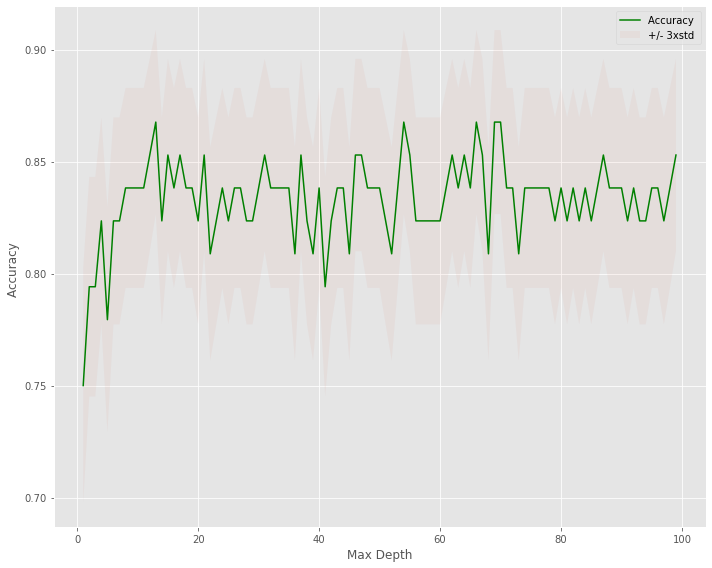

The best accuracy out of sample is 0.8676470588235294 with max depth =  13


In [229]:
plt.figure(figsize = (10,8))
plt.plot(range(1,maxdsclusterdbscan),mean_acc_dtclusterdbscan,'g')
plt.fill_between(range(1,maxdsclusterdbscan),mean_acc_dtclusterdbscan - 1 * std_acc_dtclusterdbscan,mean_acc_dtclusterdbscan+ 1 * std_acc_dtclusterdbscan, alpha=0.05)
plt.legend(('Accuracy ', '+/- 3xstd'))
plt.ylabel('Accuracy ')
plt.xlabel('Max Depth')
plt.tight_layout()
plt.show()
print( "The best accuracy out of sample is", mean_acc_dtclusterdbscan.max(), "with max depth = ",  mean_acc_dtclusterdbscan.argmax()+1)

In [230]:
kdtclusterdbscan = mean_acc_dtclusterdbscan.argmax()+1
ukTreeclusterdbscan = DecisionTreeClassifier(criterion="entropy", max_depth = kdtclusterdbscan)
ukTreeclusterdbscan.fit(X_trainclusterdbscan,Y_trainclusterdbscan)
yhatDTclusterdbscan = ukTreeclusterdbscan.predict(X_testclusterdbscan)

**Confusion Matrix**

              precision    recall  f1-score   support

          -1       0.67      0.36      0.47        11
           0       0.88      0.98      0.93        51
           1       1.00      0.50      0.67         2
           2       0.50      0.67      0.57         3
           3       0.00      0.00      0.00         1

   micro avg       0.84      0.84      0.84        68
   macro avg       0.61      0.50      0.53        68
weighted avg       0.82      0.84      0.82        68

Normalized confusion matrix


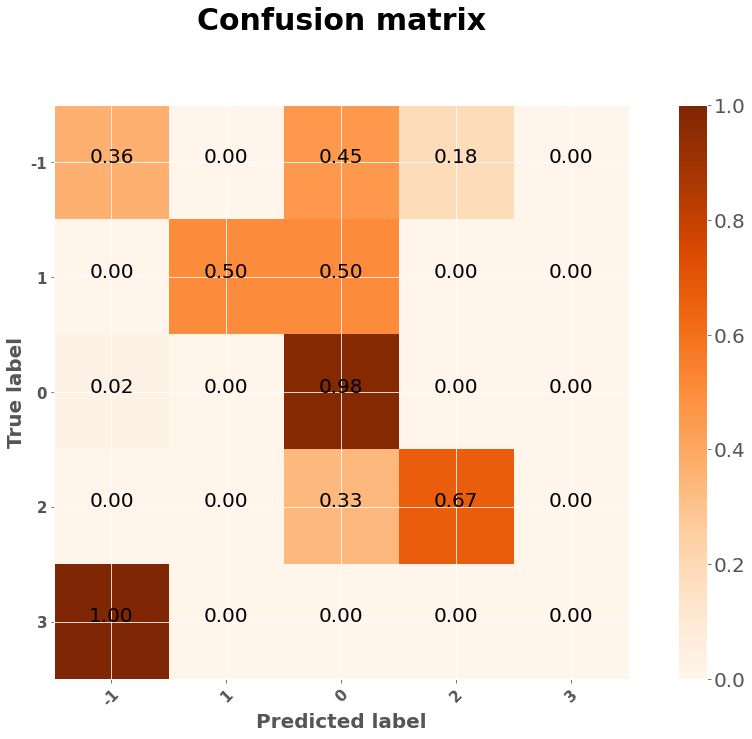

In [231]:
DTmatrixclusterdbscan= confusion_matrix(Y_testclusterdbscan, yhatDTclusterdbscan, labels=pd.DataFrame(Y_testclusterdbscan)[0].unique().astype(list))
np.set_printoptions(precision=2)
print (classification_report(Y_testclusterdbscan, yhatDTclusterdbscan))
# Plot non-normalized confusion matrix
plt.figure(figsize = [14,10])
plot_confusion_matrix(DTmatrixclusterdbscan, classes=pd.DataFrame(Y_testclusterdbscan)[0].unique().astype(list),normalize= True,  title='Confusion matrix')

**Visualize Decision Tree**

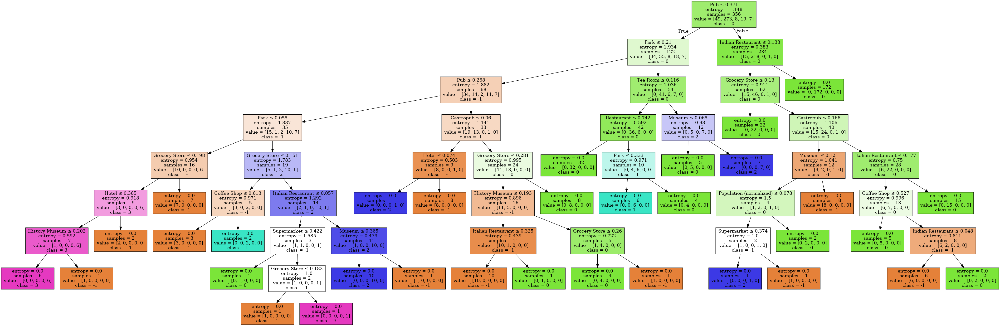

In [232]:
dot_dataclusterdbscan = StringIO()
featureNamesclusterdbscan= Xclusterdbscan.columns[0:18]
targetNamesclusterdbscan = clustereddbscan['DBScan Labels'].astype(str).unique().tolist()
outclusterdbscan=tree.export_graphviz(ukTreeclusterdbscan,feature_names=featureNamesclusterdbscan, out_file=dot_dataclusterdbscan, class_names= np.unique(Y_trainclusterdbscan.astype(str)).tolist(), filled=True,  special_characters=True,rotate=False)  
graphclusterdbscan = pydotplus.graph_from_dot_data(dot_dataclusterdbscan.getvalue())  
Image(graphclusterdbscan.create_png(), retina = True)

**Here is the Ideal Model**

In [ ]:
dot_dataGridclusterdbscan = StringIO()
featureNamesGridclusterdbscan= Xclusterdbscan.columns[0:18]
targetNamesGridclusterdbscan = clustereddbscan['DBScan Labels'].astype(str).unique().tolist()
outGridclusterdbscan=tree.export_graphviz(GridDTclusterdbscan.best_estimator_,feature_names=featureNamesGridclusterdbscan, out_file=dot_dataGridclusterdbscan, class_names= np.unique(Y_trainclusterdbscan.astype(str)).tolist(), filled=True,  special_characters=True,rotate=False)  
graphGridclusterdbscan = pydotplus.graph_from_dot_data(dot_dataGridclusterdbscan.getvalue())  
Image(graphGridclusterdbscan.create_png(), retina = True)
#graphGridclusterdbscan.write_png('IdealDT_DBSCAN.png')

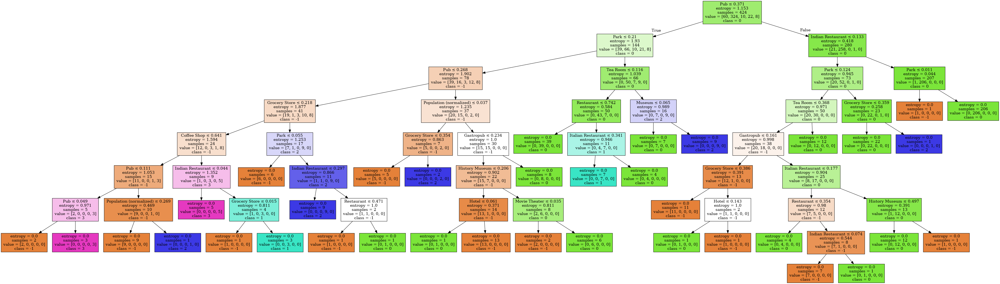

In [233]:
IM.open('IdealDT_DBSCAN.png')

In [234]:
DTdbclusterPrecision = []
DTdbclusterRecall = []
DTdbclusterTestsize = []
for i in np.arange(10, 70):
    DTX_traindbclusterprecall, DTX_testdbclusterprecall, DTY_traindbclusterprecall, DTY_testdbclusterprecall = train_test_split(Xclusterdbscan, Yclusterdbscan, test_size=i/100)
    DTdbclusterprecision = DecisionTreeClassifier(criterion="entropy", max_depth = 38)
    DTdbclusterprecision.fit(DTX_traindbclusterprecall, DTY_traindbclusterprecall)
    DTdbclusterPscore = precision_score(DTY_testdbclusterprecall, DTdbclusterprecision.predict(DTX_testdbclusterprecall), average = 'weighted')
    DTdbclusterRc = recall_score(DTY_testdbclusterprecall, DTdbclusterprecision.predict(DTX_testdbclusterprecall), average = 'weighted')
    DTdbclusterPrecision.append(DTdbclusterPscore)
    DTdbclusterRecall.append(DTdbclusterRc)
    DTdbclusterTestsize.append(i/100)

In [235]:
DTdbclusterPrecision = pd.DataFrame(DTdbclusterPrecision).rename(columns = {0:'Precision'})
DTdbclusterRecall = pd.DataFrame(DTdbclusterRecall).rename(columns = {0:'Recall'})
DTdbclusterPCcurve = DTdbclusterPrecision.join(DTdbclusterRecall)
DTdbclusterPCcurve['Test Size'] = DTdbclusterTestsize
DTdbclusterPCcurve.sort_values(by = 'Recall', ascending = False).head()

,Precision,Recall,Test Size
3,0.890693,0.875000,0.13
5,0.891477,0.875000,0.15
28,0.863106,0.858025,0.38
13,0.874065,0.857143,0.23
18,0.856656,0.848739,0.28


**RF**

In [ ]:
rfparamclusterdbscan = [{'criterion': ['gini', 'entropy'], 'n_estimators': np.arange(1,20), 'max_depth': np.arange(1, 15), 'max_features': ['auto', 'log2', None]},
                    {'criterion': ['entropy'], 'n_estimators': np.arange(1,20), 'max_depth': np.arange(1,15), 'max_features': ['auto', 'log2', None]}]
RFclusterdbscanmodel= RandomForestClassifier()
GridRFclusterdbscan = GridSearchCV(RFclusterdbscanmodel, rfparamclusterdbscan, cv=4)
GridRFclusterdbscan.fit(Xclusterdbscan, Yclusterdbscan)
BestRRRFclusterdbscan=GridRFclusterdbscan.best_params_
BestRRRFclusterdbscan

**Grid Search Results**

    Criterion: Entropy
    Max Depth: 13, this can vary a bit
    Max_Features: None
    N_estimators: 15, this can vary 

In [236]:
inmaxestimatordbscan  = 100
inmean_acc_rfclusterdbscan = np.zeros((inmaxestimatordbscan-1))
instd_acc_rfclusterdbscan = np.zeros((inmaxestimatordbscan-1))
inConfustionMxRFclusterdbscan = [];
for n in range(1,inmaxestimatordbscan):
    inukRFclusterdbscanconf = RandomForestClassifier(n_estimators=n, criterion = 'entropy', max_depth = 13, max_features = None, random_state = 1).fit(X_trainclusterdbscan,Y_trainclusterdbscan) #X_train, Y_train
    inyhat_rfclusterdbscan=inukRFclusterdbscanconf.predict(X_trainclusterdbscan)
    inmean_acc_rfclusterdbscan[n-1] = metrics.accuracy_score(Y_trainclusterdbscan, inyhat_rfclusterdbscan)
    instd_acc_rfclusterdbscan[n-1]=np.std(inyhat_rfclusterdbscan==Y_trainclusterdbscan)/np.sqrt(inyhat_rfclusterdbscan.shape[0])

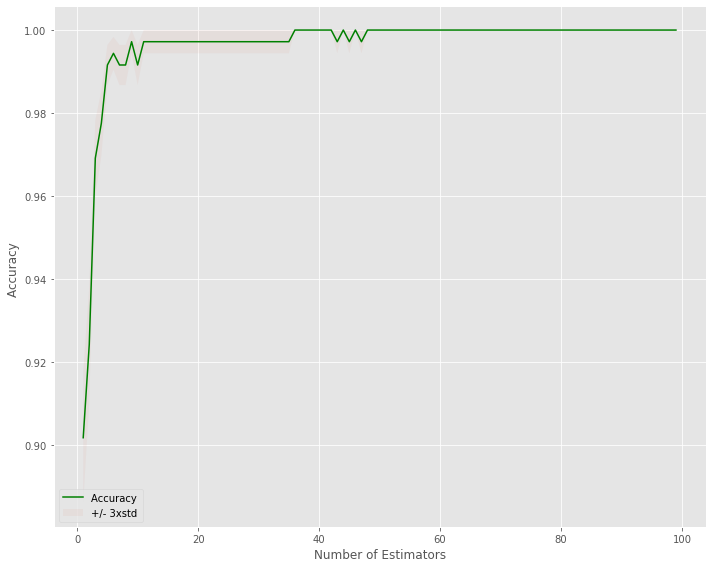

The best accuracy in-sample accuracy is 1.0 with # of estimators 36


In [237]:
plt.figure(figsize = (10,8))
plt.plot(range(1,inmaxestimatordbscan),inmean_acc_rfclusterdbscan,'g')
plt.fill_between(range(1,inmaxestimatordbscan),inmean_acc_rfclusterdbscan - 1 * instd_acc_rfclusterdbscan,inmean_acc_rfclusterdbscan + 1 * instd_acc_rfclusterdbscan, alpha=0.05)
plt.legend(('Accuracy ', '+/- 3xstd'))
plt.ylabel('Accuracy ')
plt.xlabel('Number of Estimators')
plt.tight_layout()
plt.show()
print( "The best accuracy in-sample accuracy is", inmean_acc_rfclusterdbscan.max(), "with # of estimators",  inmean_acc_rfclusterdbscan.argmax()+1)

In [238]:
inrfclusterdbscanestimators = inmean_acc_rfclusterdbscan.argmax()+1
inRFclusterdbscan =RandomForestClassifier(n_estimators=inrfclusterdbscanestimators, criterion = 'entropy', max_depth = 14, max_features = None, random_state = 1)
inRFclusterdbscan.fit(Xclusterdbscan, Yclusterdbscan)
inyhatRFclusterdbscan = inRFclusterdbscan.predict(Xclusterdbscan)

In [239]:
maxestimatordbscan  = 100
mean_acc_rfclusterdbscan = np.zeros((maxestimatordbscan-1))
std_acc_rfclusterdbscan = np.zeros((maxestimatordbscan-1))
ConfustionMxRFclusterdbscan = [];
for n in range(1,maxestimatordbscan):
    ukRFclusterdbscanconf = RandomForestClassifier(n_estimators=n, criterion = 'entropy', max_depth = 13, max_features = None, random_state = 1).fit(X_trainclusterdbscan,Y_trainclusterdbscan) #X_train, Y_train
    yhat_rfclusterdbscan=ukRFclusterdbscanconf.predict(X_testclusterdbscan)
    mean_acc_rfclusterdbscan[n-1] = metrics.accuracy_score(Y_testclusterdbscan, yhat_rfclusterdbscan)
    std_acc_rfclusterdbscan[n-1]=np.std(yhat_rfclusterdbscan==Y_testclusterdbscan)/np.sqrt(yhat_rfclusterdbscan.shape[0])

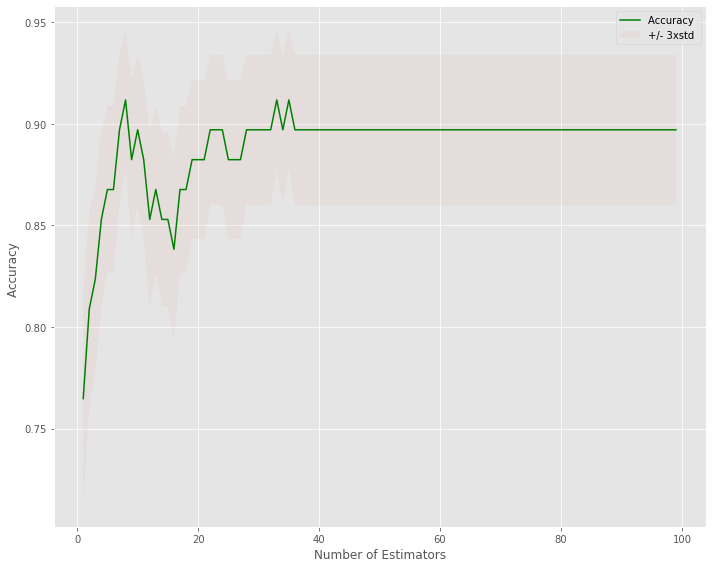

The best out of sample accuracy is 0.9117647058823529 with # of estimators 8


In [240]:
plt.figure(figsize = (10,8))
plt.plot(range(1,maxestimatordbscan),mean_acc_rfclusterdbscan,'g')
plt.fill_between(range(1,maxestimatordbscan),mean_acc_rfclusterdbscan - 1 * std_acc_rfclusterdbscan,mean_acc_rfclusterdbscan + 1 * std_acc_rfclusterdbscan, alpha=0.05)
plt.legend(('Accuracy ', '+/- 3xstd'))
plt.ylabel('Accuracy ')
plt.xlabel('Number of Estimators')
plt.tight_layout()
plt.show()
print( "The best out of sample accuracy is", mean_acc_rfclusterdbscan.max(), "with # of estimators",  mean_acc_rfclusterdbscan.argmax()+1)

In [241]:
RFclusterdbscan =RandomForestClassifier(n_estimators=mean_acc_rfclusterdbscan.argmax()+1, criterion = 'entropy', max_depth = 13, max_features = None, random_state = 1)
RFclusterdbscan.fit(X_trainclusterdbscan, Y_trainclusterdbscan)
yhatRFclusterdbscan = RFclusterdbscan.predict(X_testclusterdbscan)

**Confusion Matrix**

              precision    recall  f1-score   support

          -1       0.78      0.64      0.70        11
           0       0.94      1.00      0.97        51
           1       0.67      1.00      0.80         2
           2       1.00      0.67      0.80         3
           3       0.00      0.00      0.00         1

   micro avg       0.91      0.91      0.91        68
   macro avg       0.68      0.66      0.65        68
weighted avg       0.90      0.91      0.90        68

Normalized confusion matrix


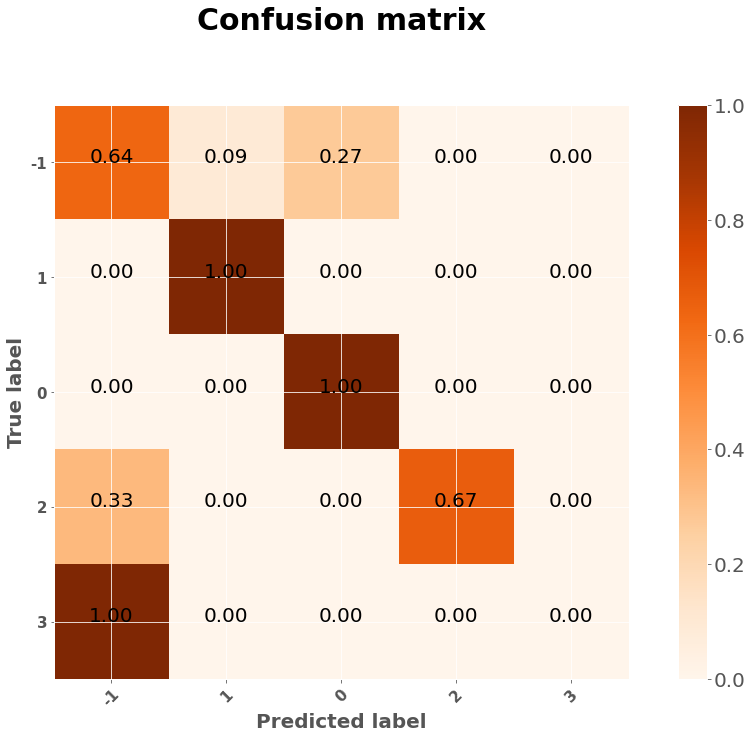

In [242]:
rfmatrixclusterdbscan = confusion_matrix(Y_testclusterdbscan, yhatRFclusterdbscan, labels=pd.DataFrame(Y_testclusterdbscan)[0].unique().astype(list))
np.set_printoptions(precision=2)
print (classification_report(Y_testclusterdbscan, yhatRFclusterdbscan))
# Plot non-normalized confusion matrix
plt.figure(figsize = [14,10])
plot_confusion_matrix(rfmatrixclusterdbscan, classes=pd.DataFrame(Y_testclusterdbscan)[0].unique().astype(list),normalize= True,  title='Confusion matrix')

In [243]:
RFdbclusterPrecision = []
RFdbclusterRecall = []
RFdbClusterTestsize = []
for i in np.arange(10, 70):
    RFX_traindbclusterprecall, RFX_testdbclusterprecall, RFY_traindbclusterprecall, RFY_testdbclusterprecall = train_test_split(Xclusterdbscan, Yclusterdbscan, test_size=i/100)
    RFdbclusterprecision = RandomForestClassifier(n_estimators=15, criterion = 'entropy', max_depth = 13, max_features = None, random_state = 1)
    RFdbclusterprecision.fit(RFX_traindbclusterprecall, RFY_traindbclusterprecall)
    RFdbclusterPscore = precision_score(RFY_testdbclusterprecall, RFdbclusterprecision.predict(RFX_testdbclusterprecall), average = 'weighted')
    RFdbclusterRc = recall_score(RFY_testdbclusterprecall, RFdbclusterprecision.predict(RFX_testdbclusterprecall), average = 'weighted')
    RFdbClusterTestsize.append(i/100)
    RFdbclusterPrecision.append(RFdbclusterPscore)
    RFdbclusterRecall.append(RFdbclusterRc)

In [244]:
RFdbclusterPrecision = pd.DataFrame(RFdbclusterPrecision).rename(columns = {0:'Precision'})
RFdbclusterRecall = pd.DataFrame(RFdbclusterRecall).rename(columns = {0:'Recall'})
RFdbclusterPCcurve = RFdbclusterPrecision.join(RFdbclusterRecall)
RFdbclusterPCcurve['Test Size'] = RFdbClusterTestsize
RFdbclusterPCcurve.sort_values(by = 'Recall', ascending = False).head()

,Precision,Recall,Test Size
8,0.937391,0.935065,0.18
30,0.914706,0.911765,0.40
0,0.932435,0.906977,0.10
15,0.912774,0.905660,0.25
34,0.891652,0.887701,0.44


**Classification with Clusters Evaluation**

Predictions for DBSCAN and K-Means labels were made according to the scenarios outlines previously, just like wih Population Bin labels

In [ ]:
EVcluster = ['Full Dataset Accuracy (K-Means)',
      'Training Set Accuracy (K-Means)', 
      'Test Set Accuracy (K-Means)', 
      'Full Dataset Accuracy (DBScan)', 
      'Training Set Accuracy (DBScan)', 
      'Test Set Accuracy (DBScan)',
       'Cross Evaluation (K-Means)',
       'Cross Evaluation (DBScan)',
        'Ideal Model (K-Means)',
        'Ideal Model (DBScan)']

crossvalsvm = Gridsvmcluster.best_estimator_
crossvalsvmdbscan = Gridsvmclusterdbscan.best_estimator_

crossvalneigh = GridKNNcluster.best_estimator_
crossvalneighdbscan = GridKNNclusterdbscan.best_estimator_

crossvaldtcluster = GridDTcluster.best_estimator_
crossvaldtclusterdbscan = GridDTclusterdbscan.best_estimator_

crossvalrf = GridRFcluster.best_estimator_
crossvalrfdbscan =GridRFclusterdbscan.best_estimator_

KNNcluster = [metrics.accuracy_score(Ycluster, inneighcluster.predict(Xcluster)),
metrics.accuracy_score(Y_traincluster, neighcluster.predict(X_traincluster)),
metrics.accuracy_score(Y_testcluster, yhatknncluster),
metrics.accuracy_score(Yclusterdbscan, inneighclusterdbscan.predict(Xclusterdbscan)),
metrics.accuracy_score(Y_trainclusterdbscan, neighclusterdbscan.predict(X_trainclusterdbscan)),
metrics.accuracy_score(Y_testclusterdbscan, yhatknnclusterdbscan),
cross_val_score(crossvalneigh, Xcluster, Ycluster, cv=4).mean(),
cross_val_score(crossvalneighdbscan, Xclusterdbscan, Yclusterdbscan, cv=4).mean(),
GridKNNcluster.best_estimator_.score(Xcluster, Ycluster),
GridKNNclusterdbscan.best_estimator_.score(Xclusterdbscan, Yclusterdbscan)]

KNNclusterF1 = [f1_score(Ycluster, inneighcluster.predict(Xcluster), average = 'weighted'),
f1_score(Y_traincluster, neighcluster.predict(X_traincluster), average = 'weighted'),
f1_score(Y_testcluster, yhatknncluster, average = 'weighted'),
f1_score(Yclusterdbscan, inneighclusterdbscan.predict(Xclusterdbscan), average = 'weighted'),
f1_score(Y_trainclusterdbscan, neighclusterdbscan.predict(X_trainclusterdbscan), average = 'weighted'),
f1_score(Y_testclusterdbscan, yhatknnclusterdbscan, average = 'weighted')] 

KNNclusterRC = [recall_score(Ycluster, inneighcluster.predict(Xcluster), average = 'weighted'),
recall_score(Y_traincluster, neighcluster.predict(X_traincluster), average = 'weighted'),
recall_score(Y_testcluster, yhatknncluster, average = 'weighted'),
recall_score(Yclusterdbscan, inneighclusterdbscan.predict(Xclusterdbscan), average = 'weighted'),
recall_score(Y_trainclusterdbscan, neighclusterdbscan.predict(X_trainclusterdbscan), average = 'weighted'),
recall_score(Y_testclusterdbscan, yhatknnclusterdbscan, average = 'weighted')] 

KNNclusterPC = [precision_score(Ycluster, inneighcluster.predict(Xcluster), average = 'weighted'),
precision_score(Y_traincluster, neighcluster.predict(X_traincluster), average = 'weighted'),
precision_score(Y_testcluster, yhatknncluster, average = 'weighted'),
precision_score(Yclusterdbscan, inneighclusterdbscan.predict(Xclusterdbscan), average = 'weighted'),
precision_score(Y_trainclusterdbscan, neighclusterdbscan.predict(X_trainclusterdbscan), average = 'weighted'),
precision_score(Y_testclusterdbscan, yhatknnclusterdbscan, average = 'weighted')] 

SVcluster = [metrics.accuracy_score(Ycluster, inSVM.fit(Xcluster, Ycluster).predict(Xcluster)),
metrics.accuracy_score(Y_traincluster, SVM.predict(X_traincluster)),
metrics.accuracy_score(Y_testcluster, yhatSVM),
metrics.accuracy_score(Yclusterdbscan, inSVMdbscan.fit(Xclusterdbscan, Yclusterdbscan).predict(Xclusterdbscan)),
metrics.accuracy_score(Y_trainclusterdbscan, SVMdbscan.predict(X_trainclusterdbscan)),
metrics.accuracy_score(Y_testclusterdbscan, yhatSVMdbscan),
cross_val_score(crossvalsvm, Xcluster, Ycluster, cv=4).mean(),
cross_val_score(crossvalsvmdbscan, Xclusterdbscan, Yclusterdbscan, cv=4).mean(),
Gridsvmcluster.best_estimator_.score(Xcluster, Ycluster),
Gridsvmclusterdbscan.best_estimator_.score(Xclusterdbscan, Yclusterdbscan)]

SVclusterF1 = [f1_score(Ycluster, inSVM.fit(Xcluster, Ycluster).predict(Xcluster), average = 'weighted'),
f1_score(Y_traincluster, SVM.predict(X_traincluster), average = 'weighted'),
f1_score(Y_testcluster, yhatSVM, average = 'weighted'),
f1_score(Yclusterdbscan, inSVMdbscan.fit(Xclusterdbscan, Yclusterdbscan).predict(Xclusterdbscan), average = 'weighted'),
f1_score(Y_trainclusterdbscan, SVMdbscan.predict(X_trainclusterdbscan), average = 'weighted'),
f1_score(Y_testclusterdbscan, yhatSVMdbscan, average = 'weighted')]

SVclusterRC = [recall_score(Ycluster, inSVM.fit(Xcluster, Ycluster).predict(Xcluster), average = 'weighted'),
recall_score(Y_traincluster, SVM.predict(X_traincluster), average = 'weighted'),
recall_score(Y_testcluster, yhatSVM, average = 'weighted'),
recall_score(Yclusterdbscan, inSVMdbscan.fit(Xclusterdbscan, Yclusterdbscan).predict(Xclusterdbscan), average = 'weighted'),
recall_score(Y_trainclusterdbscan, SVMdbscan.predict(X_trainclusterdbscan), average = 'weighted'),
recall_score(Y_testclusterdbscan, yhatSVMdbscan, average = 'weighted')]

SVclusterPC = [precision_score(Ycluster, inSVM.fit(Xcluster, Ycluster).predict(Xcluster), average = 'weighted'),
precision_score(Y_traincluster, SVM.predict(X_traincluster), average = 'weighted'),
precision_score(Y_testcluster, yhatSVM, average = 'weighted'),
precision_score(Yclusterdbscan, inSVMdbscan.fit(Xclusterdbscan, Yclusterdbscan).predict(Xclusterdbscan), average = 'weighted'),
precision_score(Y_trainclusterdbscan, SVMdbscan.predict(X_trainclusterdbscan), average = 'weighted'),
precision_score(Y_testclusterdbscan, yhatSVMdbscan, average = 'weighted')]


DTcluster = [metrics.accuracy_score(Ycluster, inukTreecluster.predict(Xcluster)),
metrics.accuracy_score(Y_traincluster, ukTreecluster.predict(X_traincluster)),
metrics.accuracy_score(Y_testcluster, yhatDTcluster),
metrics.accuracy_score(Yclusterdbscan, inukTreeclusterdbscan.predict(Xclusterdbscan)),
metrics.accuracy_score(Y_trainclusterdbscan, ukTreeclusterdbscan.predict(X_trainclusterdbscan)),
metrics.accuracy_score(Y_testclusterdbscan, yhatDTclusterdbscan),
cross_val_score(crossvaldtcluster, Xcluster, Ycluster, cv=4).mean(),
cross_val_score(crossvaldtclusterdbscan, Xclusterdbscan, Yclusterdbscan, cv=4).mean(),
GridDTcluster.best_estimator_.score(Xcluster, Ycluster),
GridDTclusterdbscan.best_estimator_.score(Xclusterdbscan, Yclusterdbscan)]


DTclusterF1 = [f1_score(Ycluster, inukTreecluster.predict(Xcluster), average = 'weighted'),
f1_score(Y_traincluster, ukTreecluster.predict(X_traincluster), average = 'weighted'),
f1_score(Y_testcluster, yhatDTcluster, average = 'weighted'),
f1_score(Yclusterdbscan, inukTreeclusterdbscan.predict(Xclusterdbscan), average = 'weighted'),
f1_score(Y_trainclusterdbscan, ukTreeclusterdbscan.predict(X_trainclusterdbscan), average = 'weighted'),
f1_score(Y_testclusterdbscan, yhatDTclusterdbscan, average = 'weighted')]

DTclusterRC = [recall_score(Ycluster, inukTreecluster.predict(Xcluster), average = 'weighted'),
recall_score(Y_traincluster, ukTreecluster.predict(X_traincluster), average = 'weighted'),
recall_score(Y_testcluster, yhatDTcluster, average = 'weighted'),
recall_score(Yclusterdbscan, inukTreeclusterdbscan.predict(Xclusterdbscan), average = 'weighted'),
recall_score(Y_trainclusterdbscan, ukTreeclusterdbscan.predict(X_trainclusterdbscan), average = 'weighted'),
recall_score(Y_testclusterdbscan, yhatDTclusterdbscan, average = 'weighted')]

DTclusterPC = [precision_score(Ycluster, inukTreecluster.predict(Xcluster), average = 'weighted'),
precision_score(Y_traincluster, ukTreecluster.predict(X_traincluster), average = 'weighted'),
precision_score(Y_testcluster, yhatDTcluster, average = 'weighted'),
precision_score(Yclusterdbscan, inukTreeclusterdbscan.predict(Xclusterdbscan), average = 'weighted'),
precision_score(Y_trainclusterdbscan, ukTreeclusterdbscan.predict(X_trainclusterdbscan), average = 'weighted'),
precision_score(Y_testclusterdbscan, yhatDTclusterdbscan, average = 'weighted')]

RFclustered = [metrics.accuracy_score(Ycluster, inRFcluster.predict(Xcluster)),
metrics.accuracy_score(Y_traincluster, RFcluster.predict(X_traincluster)),
metrics.accuracy_score(Y_testcluster, yhatRFcluster),
metrics.accuracy_score(Yclusterdbscan, inRFclusterdbscan.predict(Xclusterdbscan)),
metrics.accuracy_score(Y_trainclusterdbscan, RFclusterdbscan.predict(X_trainclusterdbscan)),
metrics.accuracy_score(Y_testclusterdbscan, yhatRFclusterdbscan),
cross_val_score(crossvalrf, Xcluster, Ycluster, cv=4).mean(),
cross_val_score(crossvalrfdbscan, Xclusterdbscan, Yclusterdbscan, cv=4).mean(),
GridRFcluster.best_estimator_.score(Xcluster, Ycluster),
GridRFclusterdbscan.best_estimator_.score(Xclusterdbscan, Yclusterdbscan)]


RFclusteredF1 = [f1_score(Ycluster, inRFcluster.predict(Xcluster), average = 'weighted'),
f1_score(Y_traincluster, RFcluster.predict(X_traincluster), average = 'weighted'),
f1_score(Y_testcluster, yhatRFcluster, average = 'weighted'),
f1_score(Yclusterdbscan, inRFclusterdbscan.predict(Xclusterdbscan), average = 'weighted'),
f1_score(Y_trainclusterdbscan, RFclusterdbscan.predict(X_trainclusterdbscan), average = 'weighted'),
f1_score(Y_testclusterdbscan, yhatRFclusterdbscan, average = 'weighted')]

RFclusteredRC = [recall_score(Ycluster, inRFcluster.predict(Xcluster), average = 'weighted'),
recall_score(Y_traincluster, RFcluster.predict(X_traincluster), average = 'weighted'),
recall_score(Y_testcluster, yhatRFcluster, average = 'weighted'),
recall_score(Yclusterdbscan, inRFclusterdbscan.predict(Xclusterdbscan), average = 'weighted'),
recall_score(Y_trainclusterdbscan, RFclusterdbscan.predict(X_trainclusterdbscan), average = 'weighted'),
recall_score(Y_testclusterdbscan, yhatRFclusterdbscan, average = 'weighted')]

RFclusteredPC = [precision_score(Ycluster, inRFcluster.predict(Xcluster), average = 'weighted'),
precision_score(Y_traincluster, RFcluster.predict(X_traincluster), average = 'weighted'),
precision_score(Y_testcluster, yhatRFcluster, average = 'weighted'),
precision_score(Yclusterdbscan, inRFclusterdbscan.predict(Xclusterdbscan), average = 'weighted'),
precision_score(Y_trainclusterdbscan, RFclusterdbscan.predict(X_trainclusterdbscan), average = 'weighted'),
precision_score(Y_testclusterdbscan, yhatRFclusterdbscan, average = 'weighted')]

predictions = [knn_mean, knn_dbscan, svm_mean, svm_dbscan, dt_mean, dt_dbscan, rf_mean, rf_dbscan] = [ pd.Series(neighcluster.fit(Xcluster, Ycluster).predict(Xcluster)),
pd.Series(neighclusterdbscan.fit(Xclusterdbscan, Yclusterdbscan).predict(Xclusterdbscan)),
pd.Series(SVM.fit(Xcluster, Ycluster).predict(Xcluster)),
pd.Series(SVMdbscan.fit(Xclusterdbscan, Yclusterdbscan).predict(Xclusterdbscan)),
pd.Series(ukTreecluster.fit(Xcluster, Ycluster).predict(Xcluster)),
pd.Series(ukTreeclusterdbscan.fit(Xclusterdbscan, Yclusterdbscan).predict(Xclusterdbscan)),
pd.Series(RFcluster.fit(Xcluster, Ycluster).predict(Xcluster)),
pd.Series(RFclusterdbscan.fit(Xclusterdbscan, Yclusterdbscan).predict(Xclusterdbscan))]


prediction_slice = [knn_mean_slice, knn_dbscan_slice, svm_mean_slice, svm_dbscan_slice, dt_mean_slice, dt_dbscan_slice, rf_mean_slice, rf_dbscan_slice] = [pd.Series(yhatknncluster),
pd.Series(yhatknnclusterdbscan),
pd.Series(yhatSVM),
pd.Series(yhatSVMdbscan),
pd.Series(yhatDTcluster),
pd.Series(yhatDTclusterdbscan),
pd.Series(yhatRFcluster),
pd.Series(yhatRFclusterdbscan)]

In [ ]:
predictions_models  = pd.DataFrame()
for i in np.arange(0,len(neighcluster.fit(Xcluster, Ycluster).predict(Xcluster))):
    knn_m, knn_s, svm_m, svm_s, dt_m, dt_s, rf_m, rf_s = knn_mean[i], knn_dbscan[i], svm_mean[i], svm_dbscan[i], dt_mean[i], dt_dbscan[i], rf_mean[i], rf_dbscan[i]
    predictions_models.loc[i, 'Knn_kmean'] = knn_m
    predictions_models.loc[i, 'SVM_kmean'] = svm_m
    predictions_models.loc[i, 'DT_kmean'] = dt_m
    predictions_models.loc[i, 'RF_kmean'] = rf_m
    predictions_models.loc[i, 'Knn_dbscan'] = knn_s
    predictions_models.loc[i, 'SVM_dbscan'] = svm_s
    predictions_models.loc[i, 'DT_dbscan'] = dt_s
    predictions_models.loc[i, 'RF_dbscan'] = rf_s  
predictions_models.index = Xcluster.index
predictions_mask = np.random.rand(len(predictions_models)) < 0.04
predictions_models[predictions_mask]
#predictions_models.to_csv('Predictions_Classification.csv') save to spreadsheet

**We can view the predicted clusters of towns for each algorithm where it is trained and tested on the full dataset and see how each of them compare**

For many of the towns, the predictions for the label from all 4 algorithms match. However, for some towns the prediction from one or more the algorithms is does't match the prediction from the others

In [245]:
predictions_models = pd.read_csv('Predictions_Classification.csv')
predictions_models.set_index('Town/Area', inplace = True)
predictions_mask = np.random.rand(len(predictions_models)) < 0.04
predictions_models[predictions_mask]

,Knn_kmean,SVM_kmean,DT_kmean,RF_kmean,Knn_dbscan,SVM_dbscan,DT_dbscan,RF_dbscan
Town/Area,,,,,,,,
Boston,3.0,3.0,3.0,3.0,-1.0,-1.0,-1.0,-1.0
Broxtowe,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
Cambridge,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
Chesterfield,1.0,1.0,1.0,1.0,0.0,0.0,0.0,0.0
Derry,3.0,1.0,3.0,3.0,-1.0,-1.0,-1.0,-1.0
East Staffordshire,1.0,0.0,1.0,1.0,0.0,0.0,0.0,0.0
Exeter,3.0,3.0,3.0,3.0,-1.0,-1.0,-1.0,-1.0
Guernsey,1.0,1.0,1.0,1.0,-1.0,-1.0,-1.0,-1.0
Hinckley and Bosworth,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [ ]:
predictions_models_testcluster  = pd.DataFrame()
for i in np.arange(0,len(yhatDTcluster)):
    knn_Kslice, svm_Kslice,dt_Kslice, rf_Kslice,  = knn_mean_slice[i],svm_mean_slice[i],dt_mean_slice[i],rf_mean_slice[i], 
    predictions_models_testcluster.loc[i, 'Knn_kmean'] = knn_Kslice
    predictions_models_testcluster.loc[i, 'SVM_kmean'] = svm_Kslice
    predictions_models_testcluster.loc[i, 'DT_kmean'] = dt_Kslice
    predictions_models_testcluster.loc[i, 'RF_kmean'] = rf_Kslice
predictions_models_testcluster.index = Y_testcluster.index
predictionstestcluster_mask = np.random.rand(len(predictions_models_testcluster)) < 0.1
predictions_models_testcluster[predictionstestcluster_mask]
predictions_models_testcluster.to_csv('predictions_test_kmeans.csv')

**We can also view the predictions on the test set alone**

In [246]:
predictions_models_testcluster = pd.read_csv('predictions_test_kmeans.csv')
predictions_models_testcluster.set_index('Town/Area', inplace = True)
predictionstestcluster_mask = np.random.rand(len(predictions_models_testcluster)) < 0.1
predictions_models_testcluster[predictionstestcluster_mask]

,Knn_kmean,SVM_kmean,DT_kmean,RF_kmean
Town/Area,,,,
Wycombe,0.0,0.0,1.0,1.0
Craigavon,3.0,3.0,3.0,3.0
Central Bedfordshire,0.0,0.0,0.0,0.0
Gedling,0.0,0.0,0.0,0.0
Norfolk,3.0,3.0,3.0,3.0
South Tyneside,1.0,1.0,1.0,1.0


In [ ]:
predictions_models_testdbscan  = pd.DataFrame()
for j in np.arange(0,len(yhatDTclusterdbscan)):
    knn_dbslice, svm_dbslice, dt_dbslice, rf_dbslice = knn_dbscan_slice[j], svm_dbscan_slice[j], dt_dbscan_slice[j], rf_dbscan_slice[j]
    predictions_models_testdbscan.loc[j, 'Knn_dbscan'] = knn_dbslice
    predictions_models_testdbscan.loc[j, 'SVM_dbscan'] = svm_dbslice
    predictions_models_testdbscan.loc[j, 'DT_dbscan'] = dt_dbslice
    predictions_models_testdbscan.loc[j, 'RF_dbscan'] = rf_dbslice
predictions_models_testdbscan.index = Y_testclusterdbscan.index
predictionstestdbscan_mask = np.random.rand(len(predictions_models_testdbscan)) < 0.4
predictions_models_testdbscan[predictionstestdbscan_mask]
predictions_models_testdbscan.to_csv('predictions_test_dbscan.csv')

In [247]:
predictions_models_testdbscan = pd.read_csv('predictions_test_dbscan.csv')
predictions_models_testdbscan.set_index('Town/Area', inplace = True)
predictionstestdbscan_mask = np.random.rand(len(predictions_models_testdbscan)) < 0.4
predictions_models_testdbscan[predictionstestdbscan_mask]

,Knn_dbscan,SVM_dbscan,DT_dbscan,RF_dbscan
Town/Area,,,,
Banbridge,1.0,3.0,3.0,1.0
Argyll and Bute,0.0,-1.0,0.0,-1.0
North East Lincolnshire,-1.0,-1.0,-1.0,0.0
Isles of Scilly,-1.0,-1.0,-1.0,-1.0
Rotherham,0.0,0.0,0.0,0.0
Sedgemoor,0.0,0.0,0.0,0.0
Derry,-1.0,-1.0,-1.0,-1.0
Wellingborough,0.0,0.0,0.0,0.0
Sefton,0.0,0.0,0.0,0.0


Lets see how the predicted labels match the true labels for the K-Means Cluster Labels

In [ ]:
combined = predictions_models_slicecluster.join(pd.DataFrame(Y_testcluster))
combined.rename(columns = {0:'True K-Means Cluster Label'}, inplace = True)
combined_mask = np.random.rand(len(combined)) < 0.3
combined[combined_mask]
combined.to_csv('Predicted vs. Actual_Kmeans.csv')

In [248]:
combined = pd.read_csv('Predicted vs. Actual_Kmeans.csv')
combined.set_index('Town/Area', inplace = True)
combined.rename(columns = {0:'True K-Means Cluster Label'}, inplace = True)
combined_mask = np.random.rand(len(combined)) < 0.3
combined[combined_mask]

,Knn_kmean,SVM_kmean,DT_kmean,RF_kmean,True K-Means Cluster Label
Town/Area,,,,,
Guernsey,1.0,1.0,1.0,1.0,1
Banbridge,3.0,1.0,3.0,1.0,1
Wycombe,0.0,0.0,1.0,1.0,1
Sedgemoor,1.0,1.0,1.0,1.0,0
Wellingborough,0.0,0.0,1.0,0.0,0
Blackburn with Darwen,0.0,0.0,0.0,0.0,0
Craigavon,3.0,3.0,3.0,3.0,3
Sunderland,1.0,1.0,0.0,1.0,1
Weymouth and Portland,1.0,3.0,1.0,1.0,3


And for the DBSCAN labels

In [ ]:
combined_dbscan = predictions_models_slicedbscan.join(pd.DataFrame(Y_testclusterdbscan))
combined_dbscan.rename(columns = {0:'True DBSCAN Cluster Label'}, inplace = True)
combined_dbscan_mask = np.random.rand(len(combined_dbscan)) < 0.3
combined_dbscan[combined_dbscan_mask]
combined_dbscan.to_csv('Predictions vs. Actual_DBSCAN.csv')

In [249]:
combined_dbscan = pd.read_csv('Predictions vs. Actual_DBSCAN.csv')
combined_dbscan.set_index('Town/Area', inplace = True)
combined_dbscan_mask = np.random.rand(len(combined_dbscan)) < 0.3
combined_dbscan[combined_dbscan_mask]

,Knn_dbscan,SVM_dbscan,DT_dbscan,RF_dbscan,True DBSCAN Cluster Label
Town/Area,,,,,
Guernsey,-1.0,-1.0,0.0,-1.0,-1
Banbridge,1.0,3.0,3.0,1.0,1
Sedgemoor,0.0,0.0,0.0,0.0,0
Derry,-1.0,-1.0,-1.0,-1.0,-1
Harlow,0.0,0.0,0.0,0.0,0
Sefton,0.0,0.0,0.0,0.0,0
Blackburn with Darwen,0.0,0.0,0.0,0.0,0
Llandrindod Wells,0.0,0.0,0.0,0.0,0
Caerphilly,0.0,0.0,0.0,0.0,0


**CLASSIFICATION RESULTS**

Now lets's see the final results

In [ ]:
evaluation_classification_cluster  = pd.DataFrame()
for i in np.arange(0,len(KNNcluster)):
    evcluster, kcluster, svcluster, dtcluster, rfcluster = EVcluster[i], KNNcluster[i], SVcluster[i], DTcluster[i], RFclustered[i]
    evaluation_classification_cluster.loc[i, 'Clustered Data Metric'] = evcluster
    evaluation_classification_cluster.loc[i, 'KNN Accuracy Score'] = kcluster
    evaluation_classification_cluster.loc[i, 'SVM Accuracy Score'] = svcluster
    evaluation_classification_cluster.loc[i, 'DT Accuracy Score'] = dtcluster
    evaluation_classification_cluster.loc[i, 'RF Accuracy Score'] = rfcluster
for j in np.arange(0, len(KNNclusterF1)):
    kclusterf1, svclusterf1, dtclusterf1, rfclusterf1 = KNNclusterF1[j], SVclusterF1[j], DTclusterF1[j], RFclusteredF1[j]
    evaluation_classification_cluster.loc[j, 'KNN_F1 Score'] = kclusterf1
    evaluation_classification_cluster.loc[j, 'SVM_F1 Score'] = svclusterf1
    evaluation_classification_cluster.loc[j, 'DT_F1 Score'] = dtclusterf1
    evaluation_classification_cluster.loc[j, 'RF_F1 Score'] = rfclusterf1
    
for k in np.arange(0, len(KNNclusterRC)):
    kclusterrc, svclusterrc, dtclusterrc, rfclusterrc = KNNclusterRC[k], SVclusterRC[k], DTclusterRC[k], RFclusteredRC[k]
    evaluation_classification_cluster.loc[k, 'KNN_Recall'] = kclusterrc
    evaluation_classification_cluster.loc[k, 'SVM_Recall'] = svclusterrc
    evaluation_classification_cluster.loc[k, 'DT_Recall'] = dtclusterrc
    evaluation_classification_cluster.loc[k, 'RF_Recall'] = rfclusterrc
for l in np.arange(0, len(KNNclusterPC)):
    kclusterps, svclusterps, dtclusterps, rfclusterps = KNNclusterPC[l], SVclusterPC[l], DTclusterPC[l], RFclusteredPC[l]
    evaluation_classification_cluster.loc[l, 'KNN_Precision'] = kclusterps
    evaluation_classification_cluster.loc[l, 'SVM_Precision'] = svclusterps
    evaluation_classification_cluster.loc[l, 'DT_Precision'] = dtclusterps
    evaluation_classification_cluster.loc[l, 'RF_Precision'] = rfclusterps
    
evaluation_classification_cluster = evaluation_classification_cluster.set_index('Clustered Data Metric')
evaluation_classification_cluster[evaluation_scores]
evaluation_classification_cluster.to_csv('Cluster_Evaluation.csv')

In [250]:
evaluation_classification_cluster = pd.read_csv('Cluster_Evaluation.csv')
evaluation_classification_cluster.set_index('Clustered Data Metric', inplace = True)
evaluation_classification_cluster[evaluation_scores]

,KNN Accuracy Score,KNN_F1 Score,KNN_Recall,KNN_Precision,SVM Accuracy Score,SVM_F1 Score,SVM_Recall,SVM_Precision,DT Accuracy Score,DT_F1 Score,DT_Recall,DT_Precision,RF Accuracy Score,RF_F1 Score,RF_Recall,RF_Precision
Clustered Data Metric,,,,,,,,,,,,,,,,
Full Dataset Accuracy (K-Means),1.000000,1.000000,1.000000,1.000000,0.962264,0.962022,0.962264,0.962142,0.997642,0.997639,0.997642,0.997655,0.990566,0.990582,0.990566,0.990666
Training Set Accuracy (K-Means),1.000000,1.000000,1.000000,1.000000,0.905660,0.905799,0.905660,0.906043,0.820755,0.820207,0.820755,0.826386,0.993711,0.993711,0.993711,0.993711
Test Set Accuracy (K-Means),0.801887,0.803115,0.801887,0.807103,0.877358,0.877572,0.877358,0.878464,0.650943,0.654026,0.650943,0.665182,0.783019,0.782429,0.783019,0.787955
Full Dataset Accuracy (DBScan),1.000000,1.000000,1.000000,1.000000,0.974057,0.974136,0.974057,0.974585,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000
Training Set Accuracy (DBScan),1.000000,1.000000,1.000000,1.000000,0.921348,0.917310,0.921348,0.924269,1.000000,1.000000,1.000000,1.000000,0.991573,0.991512,0.991573,0.991895
Test Set Accuracy (DBScan),0.941176,0.932983,0.941176,0.928922,0.911765,0.910021,0.911765,0.928309,0.852941,0.834779,0.852941,0.826270,0.911765,0.900630,0.911765,0.897876
Cross Evaluation (K-Means),0.798772,NaN,NaN,NaN,0.870120,NaN,NaN,NaN,0.624538,NaN,NaN,NaN,0.723972,NaN,NaN,NaN
Cross Evaluation (DBScan),0.889030,NaN,NaN,NaN,0.881931,NaN,NaN,NaN,0.827659,NaN,NaN,NaN,0.865354,NaN,NaN,NaN
Ideal Model (K-Means),1.000000,NaN,NaN,NaN,0.955189,NaN,NaN,NaN,1.000000,NaN,NaN,NaN,0.983491,NaN,NaN,NaN


In [ ]:
combined_evaluation_1 = evaluation_classification.append(evaluation_classification_cluster)  
combined_evaluation_1[evaluation_scores].round(5)
combined_evaluation_1.to_csv('Final_Evaluation.csv')

In [251]:
Evaluation = pd.read_csv('Final_Evaluation.csv')
Evaluation.rename(columns = {'Unnamed: 0': 'Metric'}, inplace = True)
Evaluation.set_index('Metric', inplace = True)
Evaluation

,KNN Accuracy Score,SVM Accuracy Score,DT Accuracy Score,RF Accuracy Score,KNN_F1 Score,SVM_F1 Score,DT_F1 Score,RF_F1 Score,KNN_Recall,SVM_Recall,DT_Recall,RF_Recall,KNN_Precision,SVM_Precision,DT_Precision,RF_Precision
Metric,,,,,,,,,,,,,,,,
Full Dataset (Pop),1.000000,0.990566,1.000000,0.997642,1.000000,0.990488,1.000000,0.997604,1.000000,0.990566,1.000000,0.997642,1.000000,0.990582,1.000000,0.997667
Training Set (Pop),1.000000,0.989011,0.991758,0.978022,1.000000,0.988903,0.988761,0.978854,1.000000,0.989011,0.991758,0.978022,1.000000,0.989030,0.987049,0.983974
Test Set (Pop),0.766667,0.966667,1.000000,0.916667,0.750842,0.963987,1.000000,0.925397,0.766667,0.966667,1.000000,0.916667,0.740761,0.967054,1.000000,0.939103
Cross Evaluation (Pop),0.795318,0.929513,0.988465,0.948653,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Ideal Model from Grid Search (Pop),1.000000,0.981132,1.000000,1.000000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Full Dataset Accuracy (K-Means),1.000000,0.962264,0.997642,0.990566,1.000000,0.962022,0.997639,0.990582,1.000000,0.962264,0.997642,0.990566,1.000000,0.962142,0.997655,0.990666
Training Set Accuracy (K-Means),1.000000,0.905660,0.820755,0.993711,1.000000,0.905799,0.820207,0.993711,1.000000,0.905660,0.820755,0.993711,1.000000,0.906043,0.826386,0.993711
Test Set Accuracy (K-Means),0.801887,0.877358,0.650943,0.783019,0.803115,0.877572,0.654026,0.782429,0.801887,0.877358,0.650943,0.783019,0.807103,0.878464,0.665182,0.787955
Full Dataset Accuracy (DBScan),1.000000,0.974057,1.000000,1.000000,1.000000,0.974136,1.000000,1.000000,1.000000,0.974057,1.000000,1.000000,1.000000,0.974585,1.000000,1.000000


In [252]:
Evaluation[Evaluation.columns[Evaluation.columns.str.contains('Accuracy')]].round(5)

,KNN Accuracy Score,SVM Accuracy Score,DT Accuracy Score,RF Accuracy Score
Metric,,,,
Full Dataset (Pop),1.00000,0.99057,1.00000,0.99764
Training Set (Pop),1.00000,0.98901,0.99176,0.97802
Test Set (Pop),0.76667,0.96667,1.00000,0.91667
Cross Evaluation (Pop),0.79532,0.92951,0.98846,0.94865
Ideal Model from Grid Search (Pop),1.00000,0.98113,1.00000,1.00000
Full Dataset Accuracy (K-Means),1.00000,0.96226,0.99764,0.99057
Training Set Accuracy (K-Means),1.00000,0.90566,0.82075,0.99371
Test Set Accuracy (K-Means),0.80189,0.87736,0.65094,0.78302
Full Dataset Accuracy (DBScan),1.00000,0.97406,1.00000,1.00000


Classification with Population Bins is generally best. Out-of-sample accuracy is ~90%. There is a distinct relationship between population and the population bin the town is assigned to which also explains the high accuracy of the SVM and RF models. Classification is worst with KNN, which relies on using classified towns in a neighbourhood (by euclidian distance) of an unclassified town to make classification.

For K-Means class labels, the out-of-sample accuracy for the models is roughly 77%. The best performing models are SVM with an out-of-sample accuracy of ~87% and KNN with ~80%. RF has an out-of-sample accuracy of ~72% and DT only ~63%. The reason for the poorer accuracy overall when K-Means class labels are used, is because the algorithms struggle to establish the relationship between the classification features and the K-Means clusters. Reaching high levels of accuracy requires high computational cost. SVM is able to define a hyperplane which separates the features after they have been mapped into a higher dimensional feature space where they are separable hence why its performance is higher than the other models. However the hyperplane is very complex as the Cost hyperparameter is fairly high. RBF uses an RBF kernel which suggest the relationship between the features and the classes are non-linear. The ideal KNN also requires upwards of 20 neighbours to reach an accuracy of ~80%. The decision tree model is very complex with a multitude of decision nodes and leaf nodes. Thus it is difficult to visualize or quantify a specific relationship between venue category densities of the classification features and the K-Means classes they belong to.

For DBSCAN labels, the out-of-sample accuracy is roughly ~89% which is considerably better than the accuracy for K-Means class labels. It is slightly less complex than the ideal K-Means model but more importantly, its leaf nodes are purer which makes prediction more reliable. These models appear to establish a relationship between venue category densities and the geographical location, as DBSCAN clusters mostly depend on geographical location, which may be useful insight. The fact that all four models have relatively equal levels of accuracy may be because the 4 classes (not including the outliers) are well separated in principal component space unlike in the K-Means model where 3 of the 5 classes have some overlap.

## **CONCLUSIONS & RECOMMENDATIONS**

Regression Analysis did not produce a function which could reliably predict population based on venue category totals. This could indicate a lack of correlation between the population of towns and the proliferation of businesses. Perhaps using population density as the dependent variable or investigating the relationship between venue category totals and an economy related attribute would yield better results.
    
The clusters defined with K-Means represent one way of dividing UK towns into classes based on the makeup of the towns. However the exact makeup of towns in each cluster is unclear beyond a superficial level. In deciding a town to live in or establish a business, a town from another country or a hypothetical town with venue data, could be assigned to one of these clusters using the SVM model. Any UK town in the cluster would likely share similarities with the these towns. For example, if 20% of the venues in this town are pubs, it would likely be assigned to one of the two large clusters of towns scattered predominantly around England. 

K-Means Clustering revealed that towns in the London Metropolitan Area are very different from the rest of the UK. However aside from London, there doesn't appear to be significant regional segmentation in the makeup of UK towns. Incorporating latitude and longitude into the clustering feature set, creates clusters which generally trend towards geographic regions. Clustering could be performed differently using K-Means to identify geographic clusters. Within each geographic cluster, K-Means could then be run to generate classes based on venue category density and this would potentially show the variation in the makeup of towns for each geographic region.